## About Dataset
### OSHA Severe Injury Reports:
**Data Dictionay:**

| Index | Data Element | Definition |
| --- | --- | --- |
| 1 | ID | Unique number for each record |
| 2 | UPA | UPA code |
| 3 | EventDate | The date of the event |
| 4 |Employer | The name of the employer's organization |
| 5 | Address1 | Address number 1 of the institution |
| 6 | Address2 | Address number 2 of the institution |
| 7 | City | Institute city |
| 8 | State | Institution state |
| 9 | Zip | Institute zip code |
| 10 | Latitude | Institute Latitude |
| 11 | Longitude | Institute Longitude |
| 12 | Primary NAICS | Primary The North American Industry Classification System (NAICS) code which classifies an establishment’s business |
| 13 | Hospitalized | 0 means not hospitalized and 1 to 6 are different levels of hospitalization |
| 14 | Amputation | 0 means no amputation, and 1 to 2 are different levels of amputation |
| 15 | Inspection | Inspection code|
| 16 | Final Narrative | The final narrative of the accident |
| 17 | Nature | Nature of injury code |
| 18 | NatureTitle | Nature of injury title |
| 19 | Part of Body | Part of body code |
| 20 | Part of Body Title | Part of body title |
| 21 | Event | Event code |
| 22 | EventTitle | Event title |
| 23 | Source | Source of accident code |
| 24 | SourceTitle | Source of accident title |
| 25 | Secondary Source | Secondary Source of accident code |
| 26 | Secondary Source Title | Secondary Source of accident title |

Link to access the dataset:
https://www.osha.gov/severeinjury

# 1. Data Collection

## 1.1 Import Libraries For Overview & EDA

In [1]:
# Install sweetviz
%pip install sweetviz

In [2]:
# Import Libraries For Overview & EDA
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sweetviz as sv

## 1.2 Get Of Dataset

In [3]:
!pip install -U -q PyDrive

from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials


# Authenticate and create the PyDrive client.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

In [4]:
# Get the Severe Injury Report dataset
link = 'https://drive.google.com/file/d/10foIBD6_6agrxlwC5FT3vJKZY5DBbmlk/view'

# to get the id part of the file
id = link.split("/")[-2]

downloaded = drive.CreateFile({'id':id})
downloaded.GetContentFile('Severe Injury.csv')

data = pd.read_csv('Severe Injury.csv', encoding='cp1252', low_memory=False)

# 2. Data Mining

## 2.1 Data Understanding
Overview Of The Dataset

In [5]:
# Shape of dataset
data.shape

(77208, 26)

In [6]:
# The first 5 rows of the dataset
data.head()

,ID,UPA,EventDate,Employer,Address1,Address2,City,State,Zip,Latitude,...,Nature,NatureTitle,Part of Body,Part of Body Title,Event,EventTitle,Source,SourceTitle,Secondary Source,Secondary Source Title
0,2015010015,931176,1/1/2015,FCI Otisville Federal Correctional Institution,Two Mile Drive,NaN,OTISVILLE,NEW YORK,10963.0,41.46,...,111,Fractures,513,Lower leg(s),1214,Injured by physical contact with person while ...,5721,Co-worker,5772.0,Inmate or detainee in custody
1,2015010016,930267,1/1/2015,Kalahari Manufacturing LLC,171 Progress Drive,NaN,LAKE DELTON,WISCONSIN,53940.0,43.59,...,1522,Second degree heat (thermal) burns,519,"Leg(s), n.e.c.",317,"Ignition of vapors, gases, or liquids",7261,"Welding, cutting, and blow torches",NaN,NaN
2,2015010018,929823,1/1/2015,Schneider National Bulk Carrier,420 CORAOPOLIS ROAD,NaN,CORAOPOLIS,PENNSYLVANIA,15108.0,40.49,...,10,"Traumatic injuries and disorders, unspecified",9999,Nonclassifiable,4331,Other fall to lower level less than 6 feet,8421,"Semi, tractor-trailer, tanker truck",741.0,Ladders-fixed
3,2015010019,929711,1/1/2015,PEPSI BOTTLING GROUP INC.,4541 HOUSTON AVE.,NaN,MACON,GEORGIA,31206.0,32.77,...,1972,"Soreness, pain, hurt-nonspecified injury",510,"Leg(s), unspecified",640,Caught in or compressed by equipment or object...,8623,Pallet jack-powered,8420.0,"Truck-motorized freight hauling and utility, u..."
4,2015010020,929642,1/1/2015,North American Pipe Corporation,210 South Arch Street,NaN,JANESVILLE,WISCONSIN,53545.0,42.67,...,111,Fractures,4429,"Finger(s), fingernail(s), n.e.c.",6411,Caught in running equipment or machinery durin...,350,"Metal, woodworking, and special material machi...",NaN,NaN


In [7]:
# The last 5 rows of the dataset
data.tail()

,ID,UPA,EventDate,Employer,Address1,Address2,City,State,Zip,Latitude,...,Nature,NatureTitle,Part of Body,Part of Body Title,Event,EventTitle,Source,SourceTitle,Secondary Source,Secondary Source Title
77203,2022098630,1953555,9/30/2022,Geisinger,174 Buckaroo Lane,NaN,BELLEFONTE,PA,16823.0,40.91,...,1963,"Other respiratory system symptoms-toxic, noxio...",6,BODY SYSTEMS,5521,Inhalation of harmful substance-single episode,182,"Beauty preparations, cosmetics",NaN,NaN
77204,2022098632,1953764,9/30/2022,AutoZone Inc.,4151 Center Road,NaN,BRUNSWICK,OH,44212.0,41.23,...,1972,"Soreness, pain, hurt-nonspecified injury",18,Multiple head locations,4213,Fall on same level due to tripping over an obj...,6662,Parking lot-paved,6673.0,Concrete parking blocks and barriers
77205,2022098633,1953214,9/30/2022,"Werk-Brau Co., Inc.",2800 Fostoria Rd.,NaN,FINDLAY,OH,45840.0,41.06,...,1311,Amputations,4422,Fingertip(s),6230,"Struck by falling object or equipment, unspeci...",489,"Vehicle and mobile equipment parts, n.e.c.",NaN,NaN
77206,2022098634,1952804,9/30/2022,Cargill Protein,490 Road 9,NaN,SCHUYLER,NE,68661.0,41.44,...,1311,Amputations,4420,"Finger(s), fingernail(s), unspecified",640,Caught in or compressed by equipment or object...,3715,Butchering machinery,NaN,NaN
77207,2022098635,1953033,9/30/2022,Riceland Foods Inc,918 New Madrid County Prt,NaN,MARSTON,MO,63866.0,36.51,...,1311,Amputations,4422,Fingertip(s),642,Compressed or pinched by shifting objects or e...,3710,Food and beverage processing machinery-special...,NaN,NaN


In [8]:
# 5 sample rows from the dataset
data.sample(5)

,ID,UPA,EventDate,Employer,Address1,Address2,City,State,Zip,Latitude,...,Nature,NatureTitle,Part of Body,Part of Body Title,Event,EventTitle,Source,SourceTitle,Secondary Source,Secondary Source Title
24117,2017054926,1223170,5/31/2017,"Cracker Barrel Old Country Store, Inc.",4914 Timber Drive,NaN,LAKE PARK,GEORGIA,31636.0,30.68,...,111,Fractures,341,Hip(s),420,"Fall on same level, unspecified",6629,"Floor, n.e.c.",NaN,NaN
45615,2019054917,1455152,5/14/2019,"MID-STATE TANK CO., INC.",510 E Progress Street,NaN,ARTHUR,ILLINOIS,61911.0,39.71,...,1971,Crushing injuries,4429,"Finger(s), fingernail(s), n.e.c.",6419,"Caught in running equipment or machinery, n.e.c.",3513,"Rolling mills, rolling, calendering machinery",NaN,NaN
71184,2022021255,1865462,2/9/2022,Design Solutions & Integration Inc.,1201 S 46th Street,#3806,GRAND FORKS,ND,58201.0,47.90,...,1311,Amputations,4420,"Finger(s), fingernail(s), unspecified",60,"Contact with objects and equipment, unspecified",9999,Nonclassifiable,NaN,NaN
60833,20201111141,1695025,11/25/2020,Quality Trailer Products,604 West Main Street,NaN,AZLE,TX,76020.0,32.89,...,1311,Amputations,4422,Fingertip(s),6411,Caught in running equipment or machinery durin...,30,"Machinery, unspecified",NaN,NaN
9072,2015118962,1041535,11/27/2015,FORD,8121 US-69,NaN,KANSAS CITY,MISSOURI,64119.0,39.20,...,10,"Traumatic injuries and disorders, unspecified",9999,Nonclassifiable,4213,Fall on same level due to tripping over an obj...,6629,"Floor, n.e.c.",216.0,"Skids, pallets"


In [9]:
# Info of dataset
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 77208 entries, 0 to 77207
Data columns (total 26 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   ID                      77208 non-null  int64  
 1   UPA                     77208 non-null  int64  
 2   EventDate               77208 non-null  object 
 3   Employer                77208 non-null  object 
 4   Address1                77191 non-null  object 
 5   Address2                6994 non-null   object 
 6   City                    77192 non-null  object 
 7   State                   77208 non-null  object 
 8   Zip                     77185 non-null  float64
 9   Latitude                77148 non-null  float64
 10  Longitude               77148 non-null  float64
 11  Primary NAICS           77206 non-null  object 
 12  Hospitalized            77208 non-null  float64
 13  Amputation              77202 non-null  float64
 14  Inspection              25838 non-null

In [10]:
# A statistical look at the dataset
data.describe()

,ID,UPA,Zip,Latitude,Longitude,Hospitalized,Amputation,Inspection,Nature,Part of Body,Event,Source,Secondary Source
count,7.720800e+04,7.720800e+04,77185.000000,77148.000000,77148.000000,77208.000000,77202.000000,2.583800e+04,77208.000000,77208.000000,77208.000000,77208.000000,27922.000000
mean,4.811797e+09,1.406149e+06,47309.698296,36.646425,-87.595859,0.815136,0.263944,1.331631e+06,844.825627,2058.054696,3878.785864,4808.341739,4727.604362
std,6.552909e+09,2.870222e+05,25097.501751,5.555744,11.857937,0.406190,0.441242,1.714915e+05,757.130255,2560.595143,2474.740994,2944.017288,3335.573195
min,2.015010e+09,8.674120e+05,716.000000,-34.920000,-170.710000,0.000000,0.000000,8.371470e+05,7.000000,6.000000,20.000000,10.000000,10.000000
25%,2.017021e+09,1.162478e+06,30303.000000,32.070000,-95.460000,1.000000,0.000000,1.184010e+06,111.000000,310.000000,642.000000,3199.000000,871.000000
50%,2.019054e+09,1.384813e+06,44905.000000,38.730000,-87.550000,1.000000,0.000000,1.338635e+06,1231.000000,512.000000,4330.000000,4212.000000,4226.000000
75%,2.021119e+09,1.638371e+06,72315.000000,41.050000,-80.500000,1.000000,1.000000,1.479895e+06,1311.000000,4422.000000,6252.000000,7192.000000,7810.000000
max,2.021121e+10,1.996216e+06,99926.000000,70.340000,166.640000,6.000000,2.000000,1.655407e+06,9999.000000,9999.000000,9999.000000,9999.000000,9999.000000


## 2.2 Data Cleaning
Clean Data, Data Transform, Feature Selection & Feature Engineering

### 2.2.1 Columns

In [11]:
# Columns
data.columns

Index(['ID', 'UPA', 'EventDate', 'Employer', 'Address1', 'Address2', 'City',
       'State', 'Zip', 'Latitude', 'Longitude', 'Primary NAICS',
       'Hospitalized', 'Amputation', 'Inspection', 'Final Narrative', 'Nature',
       'NatureTitle', 'Part of Body', 'Part of Body Title', 'Event',
       'EventTitle', 'Source', 'SourceTitle', 'Secondary Source',
       'Secondary Source Title'],
      dtype='object')

#### 2.2.1.1 ID

In [12]:
print('Number of unique values: ',data['ID'].nunique())
print('Number of values: ',data['ID'].count())

Number of unique values:  77203
Number of values:  77208


In [13]:
data[data['ID'].duplicated()]

,ID,UPA,EventDate,Employer,Address1,Address2,City,State,Zip,Latitude,...,Nature,NatureTitle,Part of Body,Part of Body Title,Event,EventTitle,Source,SourceTitle,Secondary Source,Secondary Source Title
458,2015010015,967503,1/19/2015,"Lochridge Priest, Inc.",2901 E. Industrial Blvd,NaN,WACO,TEXAS,76705.0,31.60,...,1972,"Soreness, pain, hurt-nonspecified injury",511,Thigh(s),4212,Fall on same level due to tripping on uneven s...,6543,Roof surfaces other than roof edge,4131.0,Angle irons
657,2015010016,963661,1/26/2015,"HDA Motors, Inc. dba Continental Honda",5901 S. LaGrange Road,NaN,COUNTRYSIDE,ILLINOIS,60525.0,41.78,...,160,"Intracranial injuries, unspecified",111,Brain,422,Fall on same level due to slipping,6660,"Parking lot, unspecified",9273.0,"Ice, sleet, snow"
726,2015010018,973007,1/28/2015,"RCS SYSTEMS, INC.",7075 West Parkland Court,NaN,MILWAUKEE,WISCONSIN,53223.0,43.16,...,1972,"Soreness, pain, hurt-nonspecified injury",440,"Hand(s), unspecified",640,Caught in or compressed by equipment or object...,7214,Routers and molders-powered,NaN,NaN
808,2015010020,958411,1/30/2015,"Schiavone Construction Co, Inc",409 St Paul's Ave,NaN,JERSEY CITY,NEW JERSEY,7306.0,40.73,...,1311,Amputations,4422,Fingertip(s),6252,Injured by slipping or swinging object held by...,7220,"Cutting handtools-powered, unspecified",NaN,NaN
809,2015010021,964863,1/30/2015,Schiavone Construction Co. LLC,409 St. Paul's Avenue,NaN,JERSEY CITY,NEW JERSEY,7306.0,40.73,...,1311,Amputations,4422,Fingertip(s),6252,Injured by slipping or swinging object held by...,7224,"Saws-powered, except chainsaws",NaN,NaN


In [14]:
data.drop([458,657,726,808,809],axis=0,inplace=True)

In [15]:
data[data['ID'].duplicated()]

,ID,UPA,EventDate,Employer,Address1,Address2,City,State,Zip,Latitude,...,Nature,NatureTitle,Part of Body,Part of Body Title,Event,EventTitle,Source,SourceTitle,Secondary Source,Secondary Source Title


In [16]:
print('Number of unique values: ',data['ID'].nunique())
print('Number of values: ',data['ID'].count())

Number of unique values:  77203
Number of values:  77203


#### 2.2.1.2 UPA

In [17]:
data['UPA'].nunique()

77203

#### 2.2.1.3 EventDate

In [18]:
data['EventDate'].value_counts()

7/10/2019     68
8/28/2018     61
8/19/2019     59
10/4/2018     58
9/16/2019     58
              ..
12/24/2016     3
1/2/2022       2
12/25/2015     2
11/26/2015     2
4/12/2020      2
Name: EventDate, Length: 2828, dtype: int64

In [19]:
data['EventDate'] = data['EventDate'].apply(lambda x:pd.to_datetime(x))

In [20]:
data['EventDate'].sample(5)

69015   2021-11-05
61055   2020-12-08
36583   2018-07-20
11305   2016-02-23
49998   2019-09-30
Name: EventDate, dtype: datetime64[ns]

In [21]:
data['Event DayOfWeek'] = data['EventDate'].apply(lambda x:x.dayofweek)
dayofweek_map = {0:'Mon',1:'Tue',2:'Wed',3:'Thu',4:'Fri',5:'Sat',6:'Sun'}
data['Event DayOfWeek'] = data['Event DayOfWeek'].map(dayofweek_map)

data['Event Day'] = data['EventDate'].apply(lambda x:x.day)
data['Event Month'] = data['EventDate'].apply(lambda x:x.month)
data['Event Year'] = data['EventDate'].apply(lambda x:x.year)

In [22]:
data.sample(5)

,ID,UPA,EventDate,Employer,Address1,Address2,City,State,Zip,Latitude,...,Event,EventTitle,Source,SourceTitle,Secondary Source,Secondary Source Title,Event DayOfWeek,Event Day,Event Month,Event Year
18282,20161010129,1151387,2016-10-27,Admiral Security Services,8529 S Park Circle,NaN,ORLANDO,FLORIDA,32819.0,28.43,...,5521,Inhalation of harmful substance-single episode,1839,"Cleaning and polishing agents, n.e.c.",NaN,NaN,Thu,27,10,2016
61714,2021010260,1719491,2021-01-11,"Lakeshore Recycling Systems, LLC",98 Southgate Course,NaN,SAINT CHARLES,IL,60174.0,41.93,...,422,Fall on same level due to slipping,660,"Floors, walkways, ground surfaces, unspecified",9273.0,"Ice, sleet, snow",Mon,11,1,2021
20102,2017010186,1170928,2017-01-07,"Wal-Mart Stores, Inc.",3300 Brumback Boulevard,NaN,KENOSHA,WISCONSIN,53144.0,42.60,...,6412,Caught in running equipment or machinery durin...,3713,Meat grinders,NaN,NaN,Sat,7,1,2017
5051,2015074416,999005,2015-07-07,Prarie Farms,926 Highway 35 By-Pass,NaN,KOSCIUSKO,MISSISSIPPI,39090.0,33.04,...,643,Compressed or pinched between two stationary o...,3991,Air compressors,8420.0,"Truck-motorized freight hauling and utility, u...",Tue,7,7,2015
37919,2018088939,1377187,2018-08-29,Coreslab Structures Inc.,817 SE 55th Street,NaN,OKLAHOMA CITY,OKLAHOMA,73129.0,35.41,...,6269,"Struck by swinging or slipping object, other t...",3430,"Cranes, unspecified",NaN,NaN,Wed,29,8,2018


#### 2.2.1.4 Employer

In [23]:
data['Employer'].value_counts()

U.S. Postal Service                398
United States Postal Service       201
UPS                                193
U.S. POSTAL SERVICE                133
Walmart                            103
                                  ... 
Jay-Bee Oil and Gas, Inc.            1
Motley-Motley Inc.                   1
G & J Pepsi Cola Bottlers, Inc.      1
A. L. Kauffman & Sons Company        1
Werk-Brau Co., Inc.                  1
Name: Employer, Length: 55058, dtype: int64

In [24]:
def lowerstrip(x):
  s = x.lower().strip()
  return s

In [25]:
data['Employer'] = data['Employer'].apply(lowerstrip)

In [26]:
data['Employer'].value_counts()

u.s. postal service             552
united states postal service    212
ups                             199
walmart                         128
united parcel service           126
                               ... 
elliott equipment co.             1
henry wurst, inc.                 1
cwpwi, inc.                       1
tennant lawn service              1
geisinger                         1
Name: Employer, Length: 52275, dtype: int64

In [27]:
data['Employer'] = data['Employer'].replace(['united states postal service','ups','usps','us postal service','united parcel service','walmart','tyson foods',
                                             'international paper','fedex freight','u. s. postal service','walmart inc','tyson foods inc.','kroger','tyson fresh meats','walmart inc.','wal-mart stores, inc.'],
                                            ['u.s. postal service','u.s. postal service','u.s. postal service','u.s. postal service','united parcel service, inc.','walmart, inc.',
                                             'tyson foods, inc.','international paper company','fedex freight, inc.','u.s. postal service','walmart, inc.','tyson foods, inc.',
                                             'the kroger company','tyson fresh meats, inc.','walmart, inc.','walmart stores, inc.'])

In [28]:
data['Employer'].value_counts().head(10)

u.s. postal service            1175
united parcel service, inc.     210
walmart, inc.                   199
tyson foods, inc.               158
publix super markets, inc.       93
fedex freight, inc.              83
international paper company      78
american airlines                77
the kroger company               68
lowe's home centers, llc         63
Name: Employer, dtype: int64

#### 2.2.1.5 Address1

In [29]:
data['Address1'].value_counts()

Unknown                      56
unknown                      26
4101 Washington Avenue       20
1400 North Weber Avenue      17
2700 Clemens Rd.             15
                             ..
8412 Rio Bravo Ct.            1
3000 W Chrysler Dr,           1
401 SOUTH PAINT STREET        1
146 Silver St.                1
918 New Madrid County Prt     1
Name: Address1, Length: 67085, dtype: int64

In [30]:
data['Address1'] = data['Address1'].replace(['unknown'],
                                            ['Unknown'])

In [31]:
data['Address1'].value_counts()

Unknown                      82
4101 Washington Avenue       20
1400 North Weber Avenue      17
2700 Clemens Rd.             15
2701 Spruce Street           14
                             ..
8412 Rio Bravo Ct.            1
3000 W Chrysler Dr,           1
401 SOUTH PAINT STREET        1
146 Silver St.                1
918 New Madrid County Prt     1
Name: Address1, Length: 67084, dtype: int64

#### 2.2.1.6 Address2

In [32]:
data['Address2'].value_counts()

Suite 100                 56
Suite 200                 25
Suite 300                 22
Suite A                   21
Suite B                   16
                          ..
375 7th Way                1
2467 Dog River Dr. N.      1
Buildling 3                1
901 Cornwall Road          1
Rig 333                    1
Name: Address2, Length: 6388, dtype: int64

In [33]:
data['Address2'].isna().sum()

70209

#### 2.2.1.7 City

In [34]:
data['City'].value_counts()

HOUSTON        1426
ORLANDO         724
CHICAGO         695
DALLAS          672
SAN ANTONIO     558
               ... 
WORLEY            1
EARLVILLE         1
ST JOHN           1
EFFIE             1
IRMA              1
Name: City, Length: 7413, dtype: int64

#### 2.2.1.8 State

In [35]:
data['State'].value_counts()

TEXAS           9642
FLORIDA         5942
PENNSYLVANIA    4582
OHIO            4442
ILLINOIS        3508
                ... 
PR                 4
VERMONT            3
VI                 3
AS                 2
MP                 1
Name: State, Length: 112, dtype: int64

In [36]:
data['State'] = data['State'].apply(lowerstrip)

In [37]:
data['State'].unique()

array(['new york', 'wisconsin', 'pennsylvania', 'georgia', 'florida',
       'colorado', 'oklahoma', 'texas', 'louisiana', 'mississippi',
       'new jersey', 'ohio', 'illinois', 'nebraska', 'new hampshire',
       'kansas', 'massachusetts', 'arkansas', 'michigan', 'idaho',
       'missouri', 'maine', 'connecticut', 'west virginia',
       'north dakota', 'montana', 'north carolina', 'delaware',
       'california', 'american samoa', 'district of columbia', 'alabama',
       'tennessee', 'oregon', 'south dakota', 'rhode island', 'indiana',
       'virginia', 'new mexico', 'maryland', 'utah', 'vermont', 'arizona',
       'guam', 'iowa', 'kentucky', 'minnesota', 'washington',
       'south carolina', 'hawaii', 'puerto rico', 'virgin islands',
       'nevada', 'wyoming', 'northern mariana islands', 'alaska', 'pa',
       'fl', 'oh', 'tx', 'mo', 'il', 'al', 'ny', 'me', 'nj', 'ma', 'de',
       'wy', 'ga', 'ks', 'ne', 'co', 'ms', 'wi', 'ca', 'ct', 'la', 'ar',
       'mt', 'or', 'wv', 'nc', 

In [38]:
data['State'] = data['State'].replace(['pa','fl','oh','tx','mo','il','al','ny','me',
             'nj','ma','de','wy','ga','ks','ne','co','ms',
             'wi','ca', 'ct','la','ar','mt','or','wv',
             'nc','nh','wa','ok','md','va','sc','gu',
             'nd','dc','nm','ky','hi','id','ri','ak',
             'nv','sd','ut','mi','tn','mn','in','ia','az',
             'vt','vi','as','pr','mp'],
                                            ['pennsylvania','florida','ohio','texas','missouri','illinois','alabama','new york','maine','new jersey',
                                             'massachusetts','delaware','wyoming','georgia','kansas','nebraska','colorado','mississippi','wisconsin',
                                             'california','connecticut','louisiana','arkansas','montana','oregon','west virginia','north carolina',
                                             'new hampshire','washington','oklahoma','maryland','virginia','south carolina','guam','north dakota',
                                             'district of columbia','new mexico','kentucky','hawaii','idaho','rhode island','alaska','nevada','south dakota',
                                             'utah','michigan','tennessee','minnesota','indiana','iowa','arizona','vermont','virgin islands','american samoa',
                                             'puerto rico','northern mariana islands'])

In [39]:
data['State'].value_counts()

texas                       12665
florida                      8213
pennsylvania                 6160
ohio                         6030
illinois                     4661
georgia                      4308
new york                     3884
wisconsin                    3180
alabama                      2550
colorado                     2416
missouri                     2357
new jersey                   1945
louisiana                    1821
massachusetts                1760
arkansas                     1686
oklahoma                     1641
kansas                       1544
mississippi                  1435
nebraska                     1229
connecticut                   843
idaho                         760
west virginia                 754
north dakota                  705
maine                         562
south dakota                  502
new hampshire                 486
california                    392
montana                       382
delaware                      320
rhode island  

#### 2.2.1.9 Zip

In [40]:
data['Zip'].value_counts()

32830.0    196
77041.0    118
79772.0     99
32819.0     88
75261.0     82
          ... 
78648.0      1
36556.0      1
57043.0      1
31565.0      1
54442.0      1
Name: Zip, Length: 13042, dtype: int64

#### 2.2.1.10 Latitude

In [41]:
data['Latitude'].value_counts()

40.75    217
40.76    203
39.97    191
40.77    178
40.74    169
        ... 
51.25      1
47.47      1
46.50      1
47.41      1
18.36      1
Name: Latitude, Length: 2432, dtype: int64

#### 2.2.1.11 Longitude

In [42]:
data['Longitude'].value_counts()

-81.53     146
-81.46     146
-80.14     130
-80.12     127
-81.47     127
          ... 
-118.43      1
-112.48      1
-163.72      1
-118.77      1
-104.55      1
Name: Longitude, Length: 4642, dtype: int64

#### 2.2.1.12 Primary NAICS

In [43]:
data['Primary NAICS'].value_counts()

622110    1777
445110    1501
213112    1491
236220    1433
238210    1397
          ... 
611420       1
5419         1
315211       1
921140       1
335220       1
Name: Primary NAICS, Length: 1271, dtype: int64

In [44]:
data[data['Primary NAICS']=='48-49']
data.drop(20909,inplace=True)

#### 2.2.1.13 Hospitalized

In [45]:
data['Hospitalized'].value_counts()

1.0    61952
0.0    14776
2.0      457
3.0       11
4.0        2
6.0        2
5.0        2
Name: Hospitalized, dtype: int64

In [46]:
data['Hospitalized_binary'] = data['Hospitalized'].replace([1.0,2.0,3.0,4.0,5.0,6.0],[1.0,1.0,1.0,1.0,1.0,1.0])

In [47]:
data['Hospitalized_binary'].value_counts()

1.0    62426
0.0    14776
Name: Hospitalized_binary, dtype: int64

#### 2.2.1.14 Amputation

In [48]:
data['Amputation'].value_counts()

0.0    56838
1.0    20342
2.0       16
Name: Amputation, dtype: int64

In [49]:
data['Amputation_binary'] = data['Amputation'].replace([1.0,2.0],[1.0,1.0])

In [50]:
data['Amputation_binary'].value_counts()

0.0    56838
1.0    20358
Name: Amputation_binary, dtype: int64

#### 2.2.1.15 Inspection

In [51]:
data['Inspection'].value_counts()

1212113.0    4
1087712.0    4
1166282.0    3
1074333.0    3
1271198.0    3
            ..
1236873.0    1
1235529.0    1
1238537.0    1
1239748.0    1
1626287.0    1
Name: Inspection, Length: 25704, dtype: int64

#### 2.2.1.16 Final Narrative

In [52]:
data['Final Narrative'].value_counts()

An employee fell from a ladder.                                                                                                                                                                                                                                              6
An employee suffered a fingertip amputation.                                                                                                                                                                                                                                 6
An employee suffered a finger amputation.                                                                                                                                                                                                                                    5
An employee was hospitalized due to dehydration.                                                                                                                                           

#### 2.2.1.17 Nature

In [53]:
data['Nature'].value_counts()

111     24670
1311    20438
1972     5818
132      3815
10       1665
        ...  
192         1
2342        1
5150        1
2352        1
2443        1
Name: Nature, Length: 193, dtype: int64

#### 2.2.1.18 NatureTitle

In [54]:
data['NatureTitle'].value_counts()

Fractures                                                24670
Amputations                                              20438
Soreness, pain, hurt-nonspecified injury                  5818
Cuts, lacerations                                         3815
Traumatic injuries and disorders, unspecified             1665
                                                         ...  
Drownings                                                    1
Pulmonary embolism                                           1
Symptoms involving cardiovascular system, unspecified        1
Heart failure                                                1
Asthma, except intrinsic                                     1
Name: NatureTitle, Length: 194, dtype: int64

#### 2.2.1.19 Part of Body

In [55]:
data['Part of Body'].value_counts()

4422    9104
4429    7420
4420    5761
899     4439
6       3694
        ... 
59         1
5311       1
5319       1
3353       1
19         1
Name: Part of Body, Length: 125, dtype: int64

#### 2.2.1.20 Part of Body Title

In [56]:
data['Part of Body Title'].value_counts()

Fingertip(s)                             9104
Finger(s), fingernail(s), n.e.c.         7420
Finger(s), fingernail(s), unspecified    5761
Multiple body parts, n.e.c.              4439
BODY SYSTEMS                             3694
                                         ... 
Lower extremities, n.e.c.                   1
Ball(s) of the foot                         1
Sole(s), n.e.c.                             1
Large intestine, colon, rectum              1
Head, n.e.c.                                1
Name: Part of Body Title, Length: 125, dtype: int64

In [57]:
data['Part of Body Title'] = data['Part of Body Title'].apply(lowerstrip)

In [58]:
data['Part of Body Title'].value_counts()

fingertip(s)                             9104
finger(s), fingernail(s), n.e.c.         7420
finger(s), fingernail(s), unspecified    5761
multiple body parts, n.e.c.              4439
body systems                             3694
                                         ... 
lower extremities, n.e.c.                   1
ball(s) of the foot                         1
sole(s), n.e.c.                             1
large intestine, colon, rectum              1
head, n.e.c.                                1
Name: Part of Body Title, Length: 125, dtype: int64

#### 2.2.1.21 Event

In [59]:
data['Event'].value_counts()

6412    5977
4330    5126
6411    4663
642     4472
422     3243
        ... 
650        1
7352       1
7360       1
2633       1
1117       1
Name: Event, Length: 353, dtype: int64

#### 2.2.1.22 EventTitle

In [60]:
data['EventTitle'].value_counts()

Caught in running equipment or machinery during regular operation          5977
Other fall to lower level, unspecified                                     5126
Caught in running equipment or machinery during maintenance, cleaning      4645
Compressed or pinched by shifting objects or equipment                     4472
Fall on same level due to slipping                                         3223
                                                                           ... 
Struck by shifting load during transport, roadway                             1
Multiple types of exposures through skin, eyes, or other exposed tissue       1
Other oxygen deficiency, n.e.c.                                               1
Jump from collapsing structure or equipment 11 to 15 feet                     1
Threat, verbal assault                                                        1
Name: EventTitle, Length: 362, dtype: int64

#### 2.2.1.23 Source

In [61]:
data['Source'].value_counts()

6629    4382
8621    3289
9999    2526
660     2090
9262    1945
        ... 
218        1
139        1
473        1
7637       1
2130       1
Name: Source, Length: 1079, dtype: int64

#### 2.2.1.24 SourceTitle

In [62]:
data['SourceTitle'].value_counts()

Floor, n.e.c.                                     4382
Forklift, order picker, platform truck-powered    3289
Nonclassifiable                                   2526
Floors, walkways, ground surfaces, unspecified    2090
Heat-environmental                                1945
                                                  ... 
Birds, except fowl                                   1
Sewer gas                                            1
Grain elevator interiors                             1
Tank, bin, vat interiors, unspecified                1
Containers-variable restraint, unspecified           1
Name: SourceTitle, Length: 1082, dtype: int64

#### 2.2.1.25 Secondary Source

In [63]:
data['Secondary Source'].value_counts()

660.0     3373
9273.0    1624
6629.0    1587
9111.0    1020
8621.0     983
          ... 
4822.0       1
5729.0       1
1852.0       1
3761.0       1
5151.0       1
Name: Secondary Source, Length: 885, dtype: int64

#### 2.2.1.26 Secondary Source Title

In [64]:
data['Secondary Source Title'].value_counts()

Floors, walkways, ground surfaces, unspecified    3373
Ice, sleet, snow                                  1624
Floor, n.e.c.                                     1587
Belts, gloves, neckties, scarves                  1020
Forklift, order picker, platform truck-powered     983
                                                  ... 
Co-worker or work associate, n.e.c.                  1
Flammable gas, unspecified                           1
Dyeing machinery-textile                             1
Other handtools-powered, unspecified                 1
Cats, felines-domestic                               1
Name: Secondary Source Title, Length: 886, dtype: int64

#### 2.2.1.27 Event DayOfWeek

In [65]:
data['Event DayOfWeek'].value_counts()

Wed    14374
Tue    14299
Thu    13920
Mon    13491
Fri    11996
Sat     5602
Sun     3520
Name: Event DayOfWeek, dtype: int64

#### 2.2.1.28 Event Day

In [66]:
data['Event Day'].value_counts()

9     2766
20    2685
11    2659
21    2641
10    2634
15    2633
8     2630
22    2629
13    2627
14    2608
7     2593
6     2591
19    2587
16    2578
17    2575
12    2562
18    2543
5     2518
27    2512
23    2512
1     2472
24    2465
3     2452
26    2435
28    2398
2     2376
4     2344
25    2302
29    2286
30    2237
31    1352
Name: Event Day, dtype: int64

#### 2.2.1.29 Event Month

In [67]:
data['Event Month'].value_counts()

8     7335
7     7318
6     7085
9     6680
3     6644
1     6602
2     6412
5     6400
4     6115
10    6038
11    5369
12    5204
Name: Event Month, dtype: int64

#### 2.2.1.30 Event Year

In [68]:
data['Event Year'].value_counts()

2018    11156
2019    11075
2017    10447
2016    10091
2015     9847
2020     8915
2021     8704
2022     6967
Name: Event Year, dtype: int64

### 2.2.2 Drop Non-Important Columns

<Axes: >

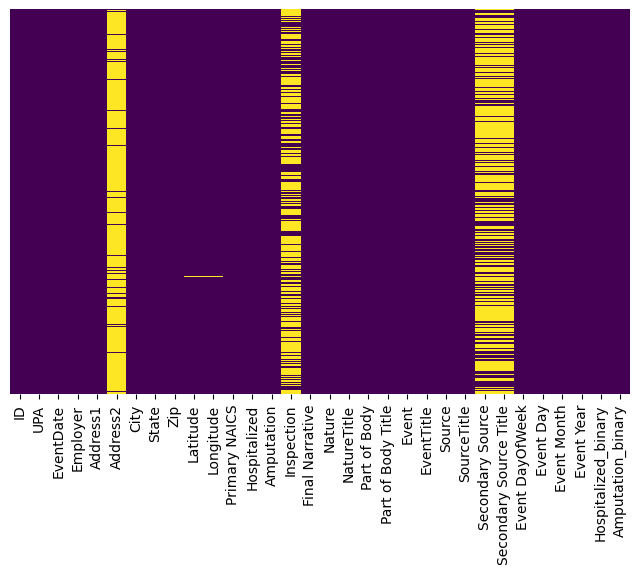

In [69]:
plt.figure(figsize=(8,5))
sns.heatmap(data=data.isnull(),cbar=False,yticklabels=False,cmap='viridis')

In [70]:
null_counts = data.isnull().sum()
columns_with_null = null_counts[null_counts > 0]
print(columns_with_null)

Address1                     17
Address2                  70208
City                         16
Zip                          23
Latitude                     60
Longitude                    60
Primary NAICS                 2
Amputation                    6
Inspection                51368
Secondary Source          49282
Secondary Source Title    49282
Amputation_binary             6
dtype: int64


In [71]:
final_narrative = data[['Final Narrative','Hospitalized_binary','Amputation_binary']]

In [72]:
final_narrative.to_csv('Final Narrative.csv')

In [77]:
data.drop(['ID','UPA','Address1','Address2','Inspection','Final Narrative','Secondary Source','Secondary Source Title','Amputation','Hospitalized','Latitude','Longitude'],
         axis=1,inplace=True)

In [78]:
null_counts = data.isnull().sum()
columns_with_null = null_counts[null_counts > 0]
print(columns_with_null)

City                 16
Zip                  23
Primary NAICS         2
Amputation_binary     6
dtype: int64


### 2.2.3 Drop Missing Data

In [ ]:
data.dropna(inplace=True)

<Axes: >

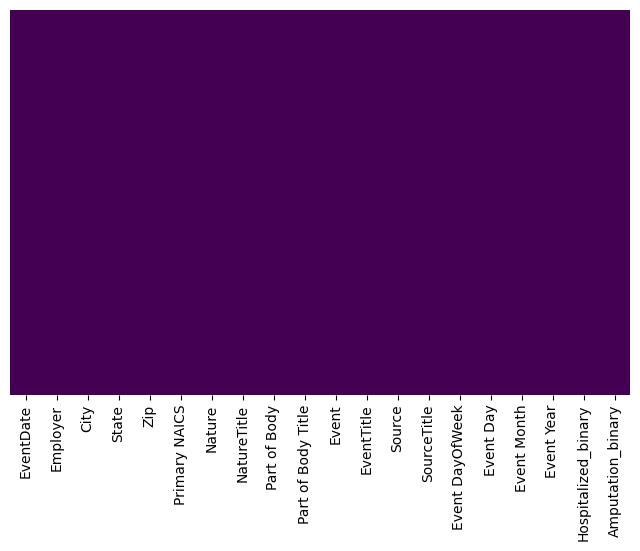

In [ ]:
plt.figure(figsize=(8,5))
sns.heatmap(data=data.isnull(),cbar=False,yticklabels=False,cmap='viridis')

In [ ]:
# Convert 'Primary NAICS' from object to int
data['Primary NAICS'] = data['Primary NAICS'].astype('int64')

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 77172 entries, 0 to 77207
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   EventDate            77172 non-null  datetime64[ns]
 1   Employer             77172 non-null  object        
 2   City                 77172 non-null  object        
 3   State                77172 non-null  object        
 4   Zip                  77172 non-null  float64       
 5   Primary NAICS        77172 non-null  int64         
 6   Nature               77172 non-null  int64         
 7   NatureTitle          77172 non-null  object        
 8   Part of Body         77172 non-null  int64         
 9   Part of Body Title   77172 non-null  object        
 10  Event                77172 non-null  int64         
 11  EventTitle           77172 non-null  object        
 12  Source               77172 non-null  int64         
 13  SourceTitle          77172 non-

## 2.3 EDA: Exploratory Data Analysis

### 2.3.1 Auto EDA with Sweetviz

In [ ]:
from warnings import filterwarnings
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

#### 2.3.1.1 Severe Injuries: Hospitalization

                                             |          | [  0%]   00:00 -> (? left)


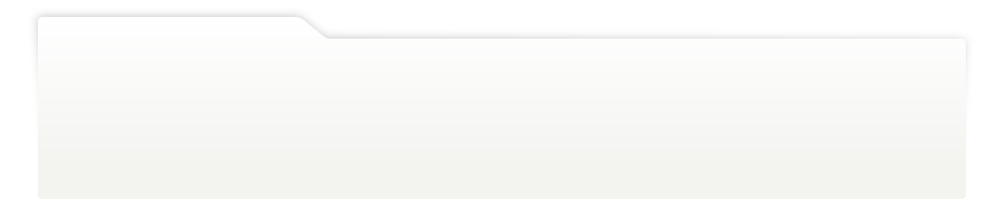
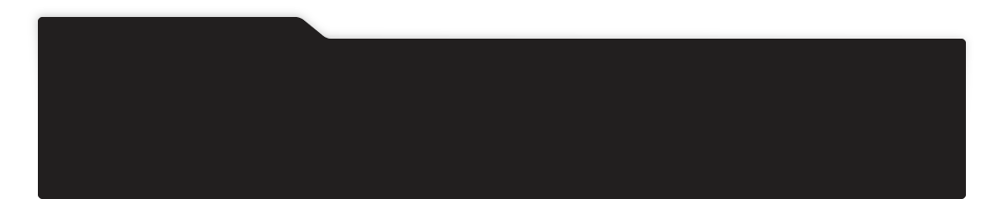
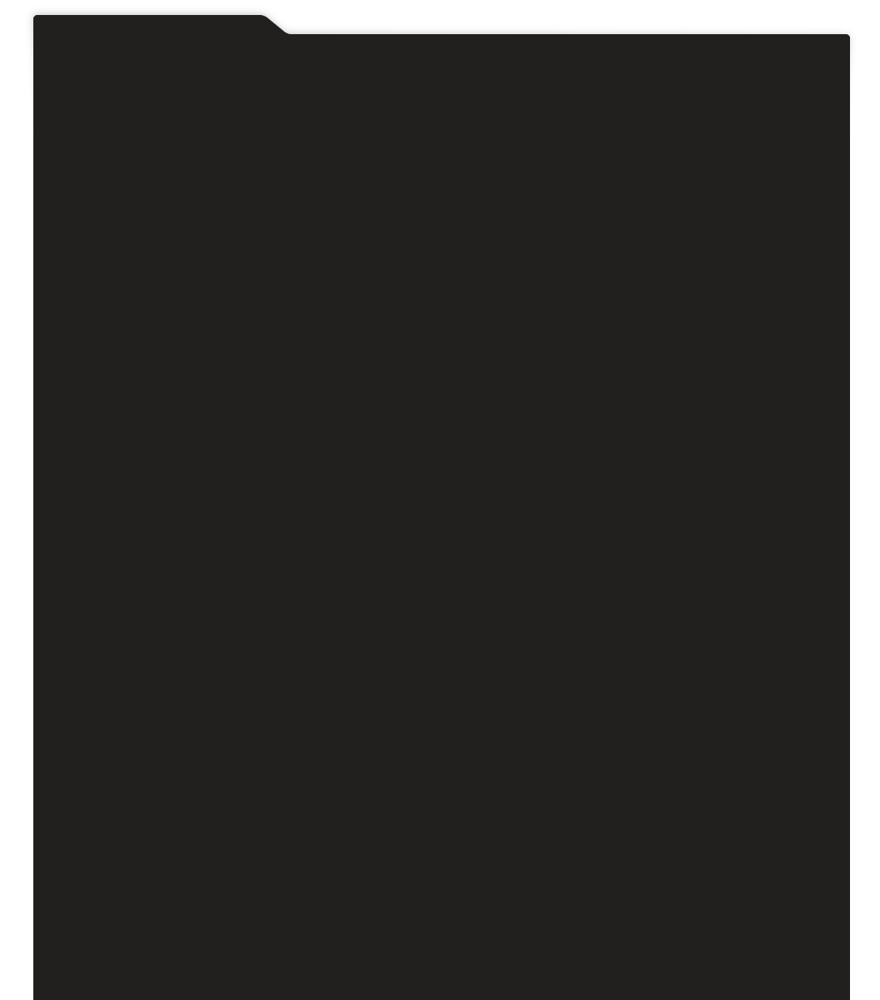
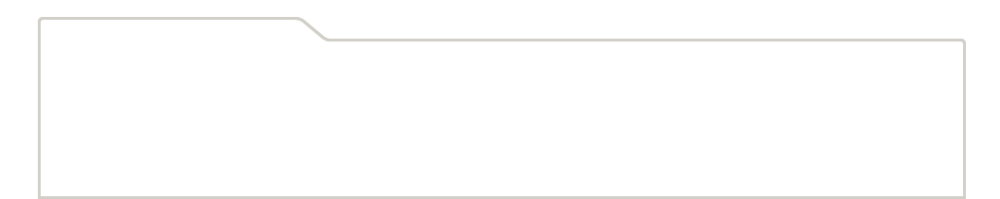
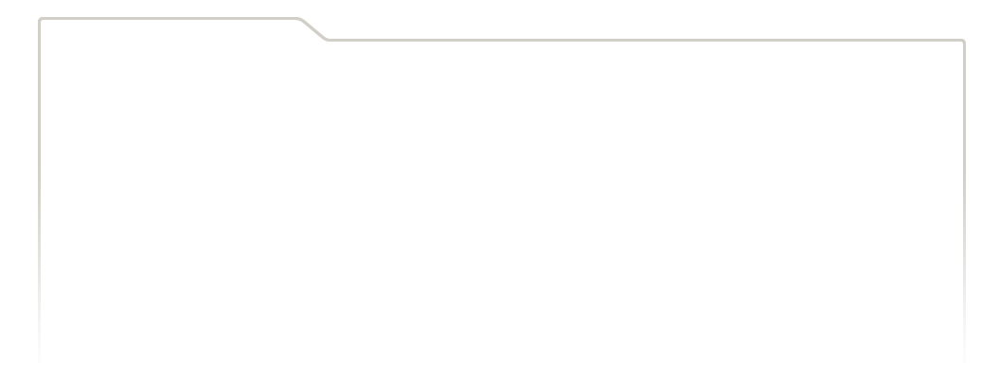
...
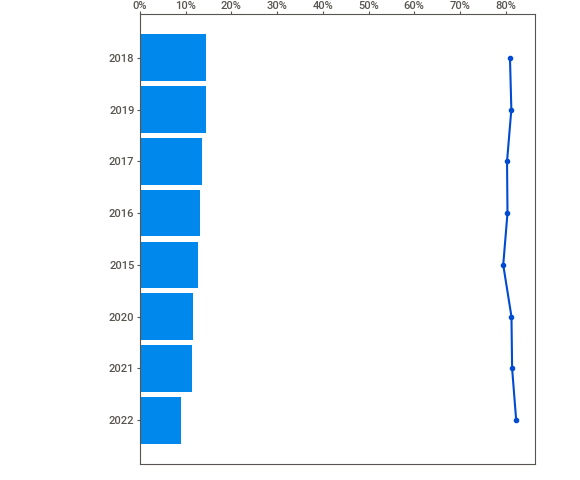
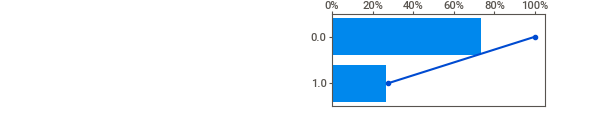
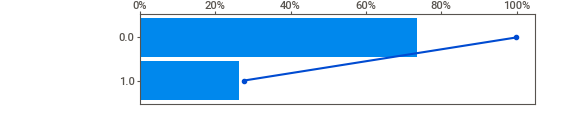
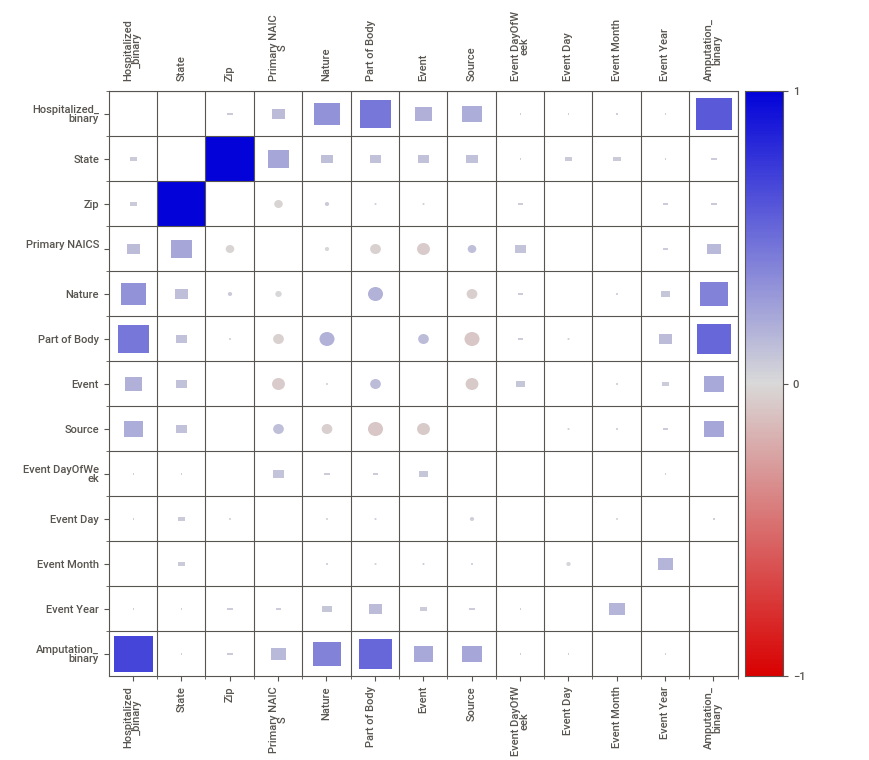
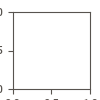

In [ ]:
# Analyzing the dataset
advert_report = sv.analyze([data,'Severe Injuries: Hospitalization'],target_feat='Hospitalized_binary',pairwise_analysis="on")
# Display the report
advert_report.show_notebook(w='100%')

#### 2.3.1.2 Severe Injuries: Amputation

                                             |          | [  0%]   00:00 -> (? left)


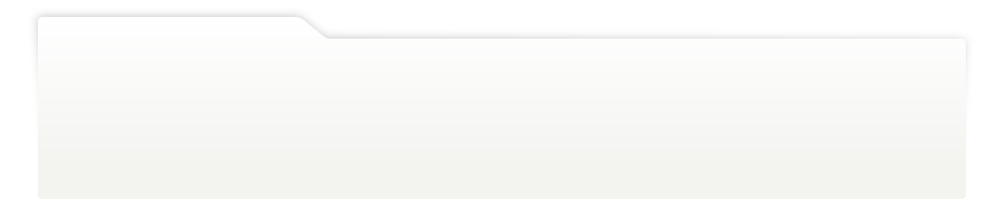
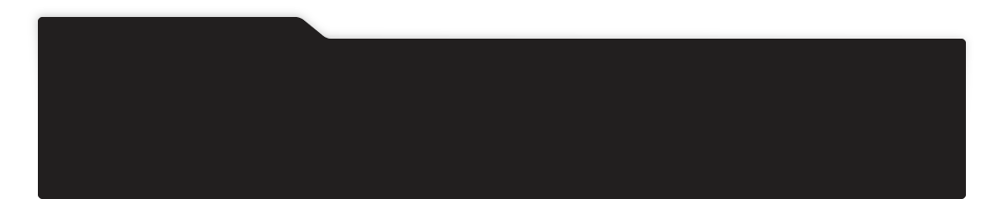
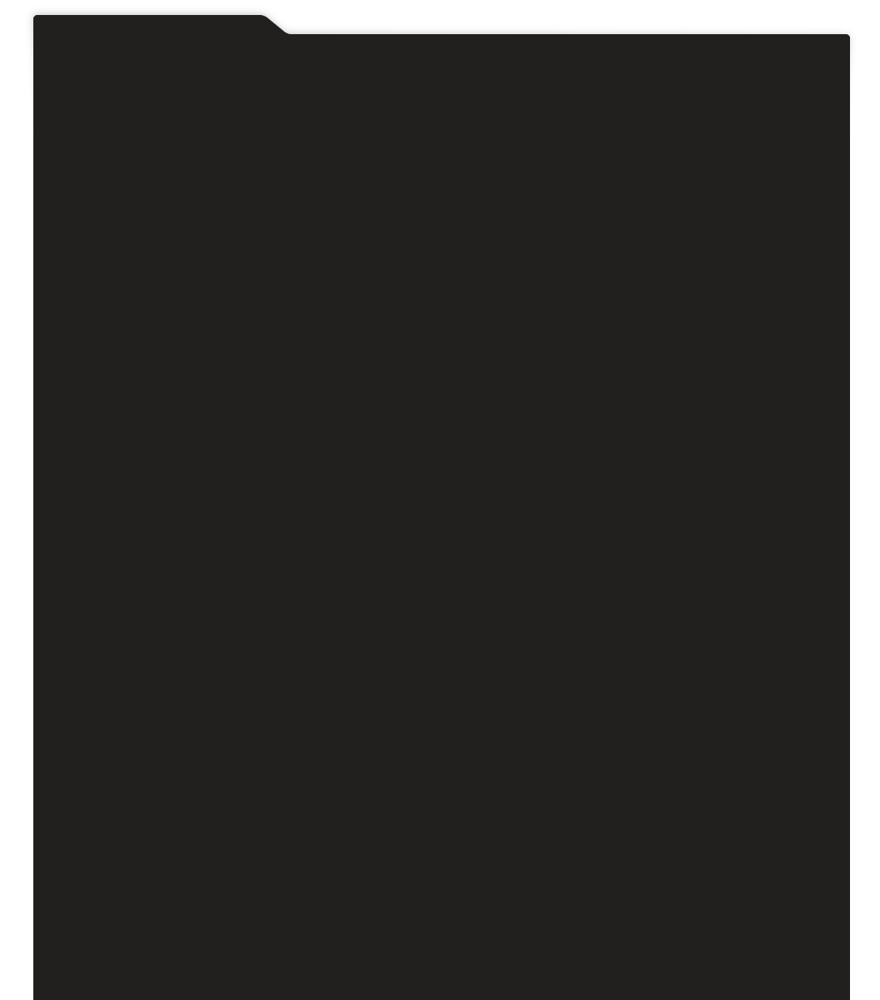
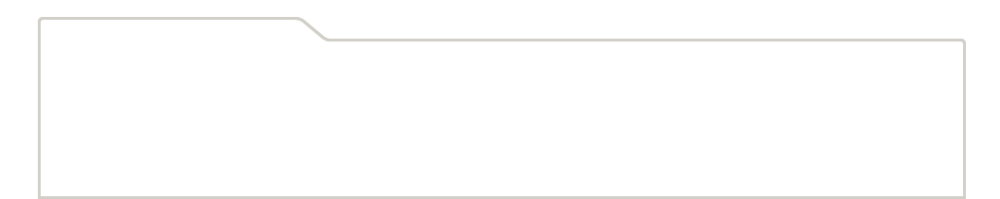
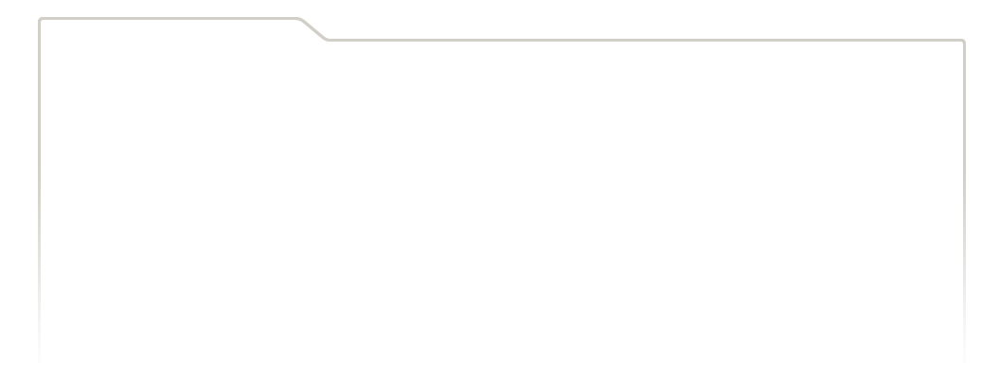
...
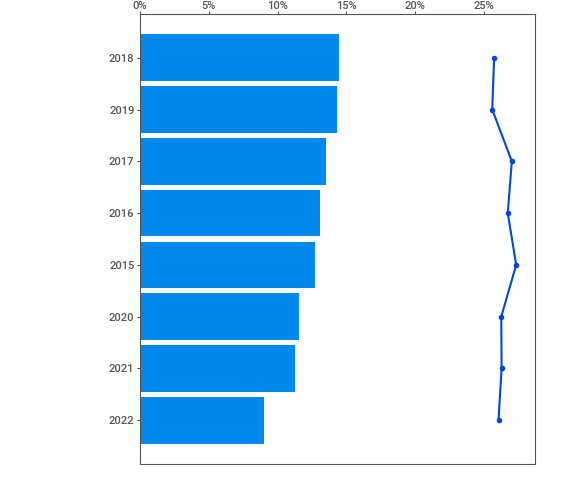
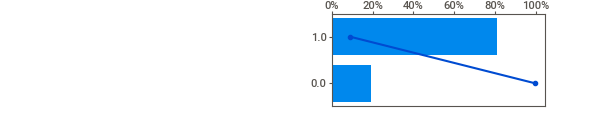
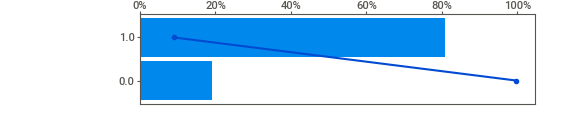
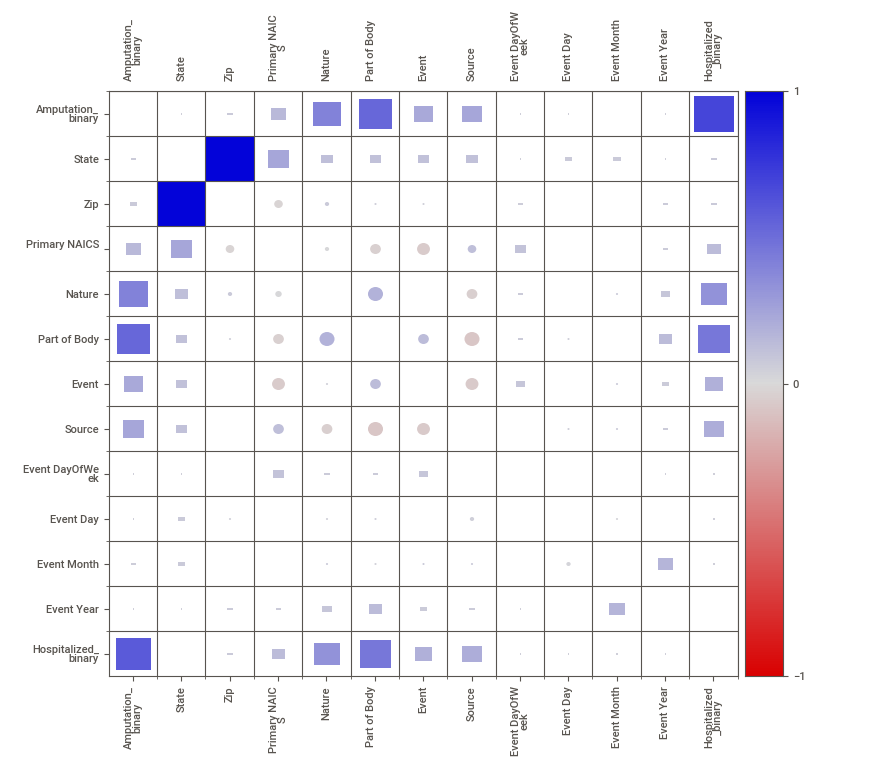
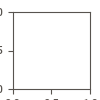

In [ ]:
#analyzing the dataset
advert_report = sv.analyze([data,'Severe Injuries: Amputation'],target_feat='Amputation_binary',pairwise_analysis="on")
#display the report
advert_report.show_notebook(w='100%')

#### 2.3.1.3 Compare Severe Injuries: Hospitalization

                                             |          | [  0%]   00:00 -> (? left)


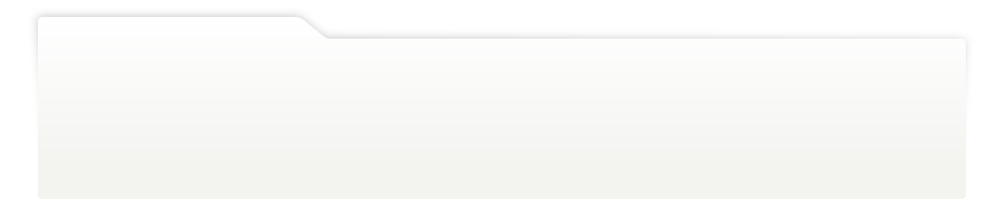
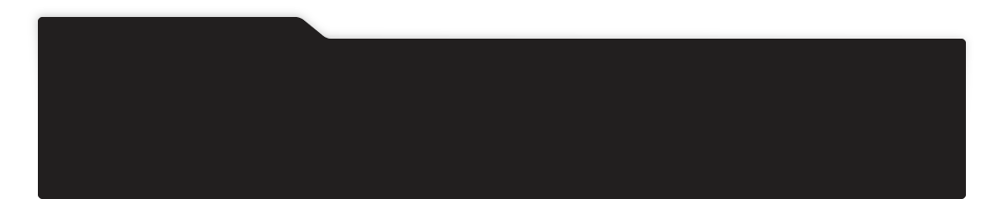
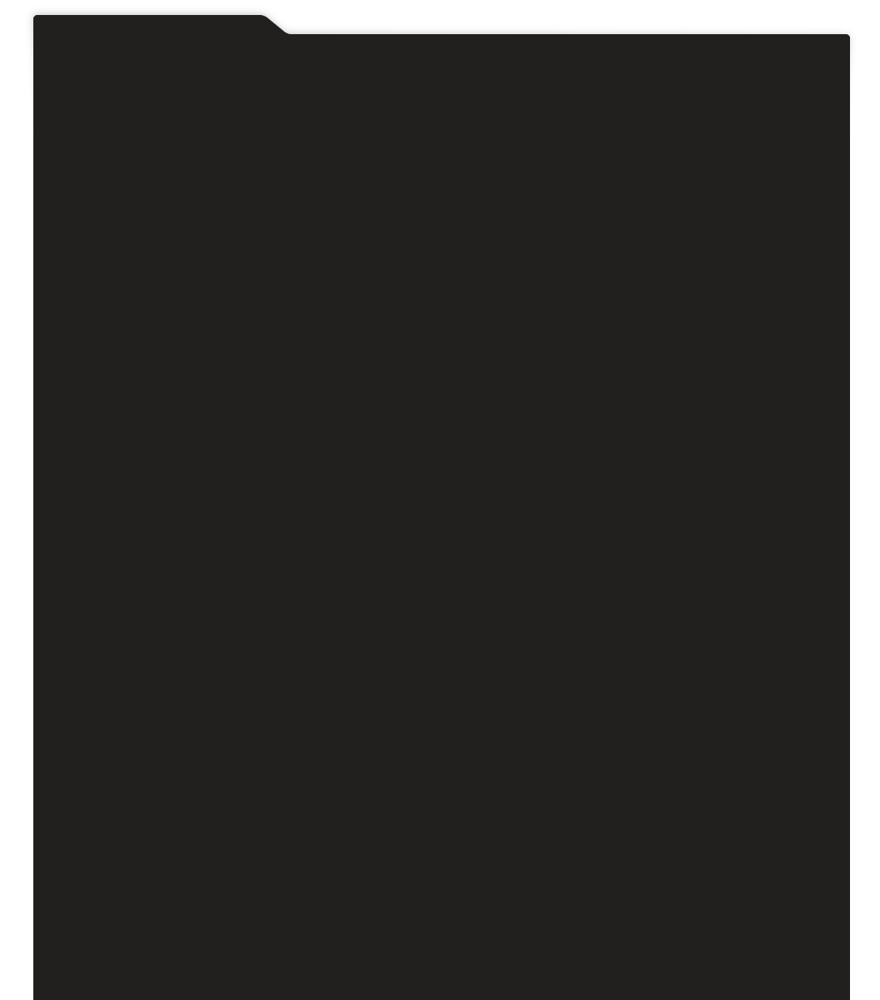
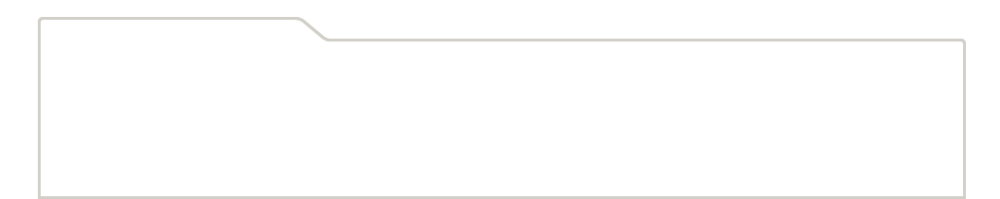
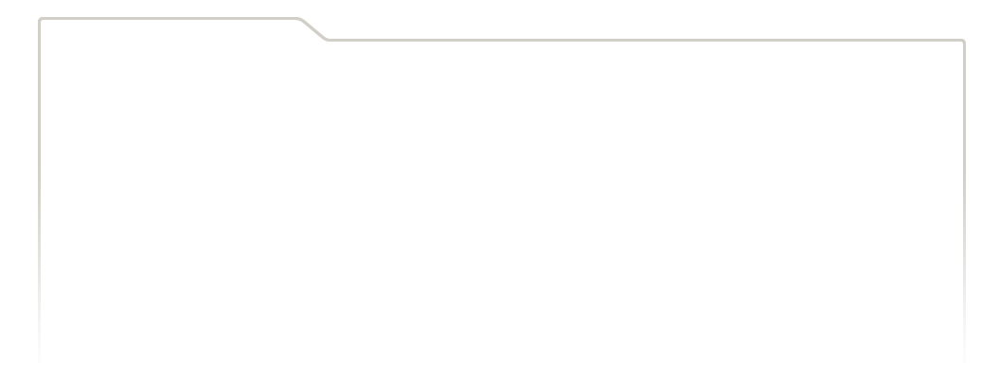
...
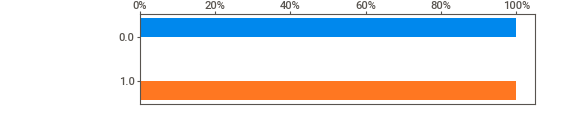
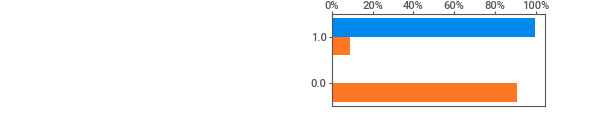
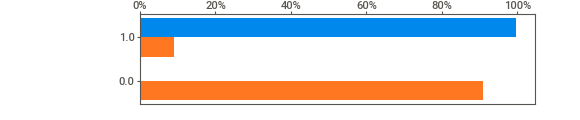
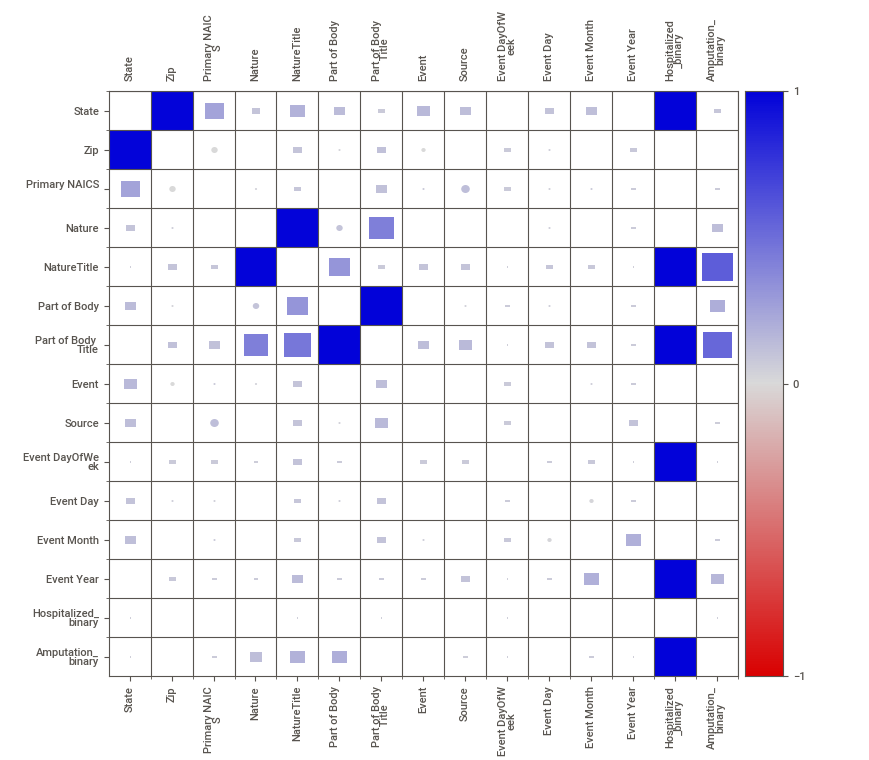
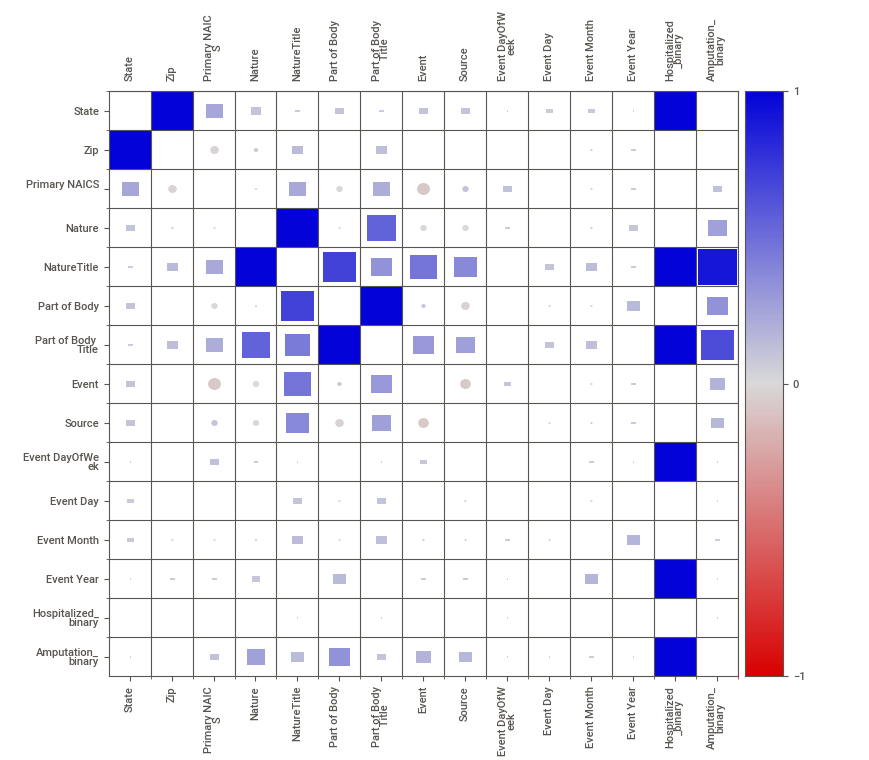

In [ ]:
feature_config = sv.FeatureConfig(force_cat='Hospitalized_binary')
my_report = sv.compare_intra(data, data['Hospitalized_binary'] ==0, ["Not Hospitalized", "Hospitalized"],feat_cfg= feature_config)
my_report.show_notebook(w='100%')

#### 2.3.1.4 Compare Severe Injuries: Amputation

                                             |          | [  0%]   00:00 -> (? left)


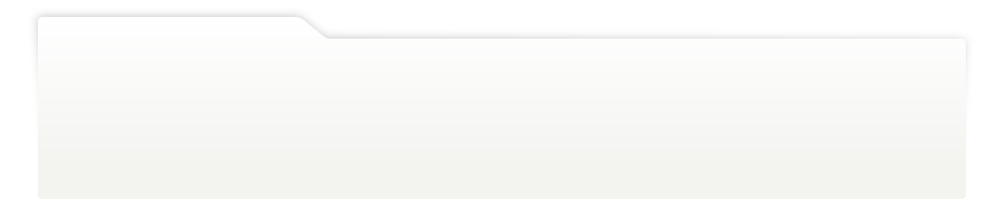
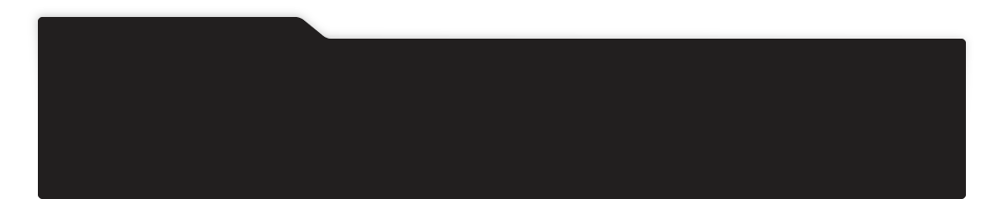
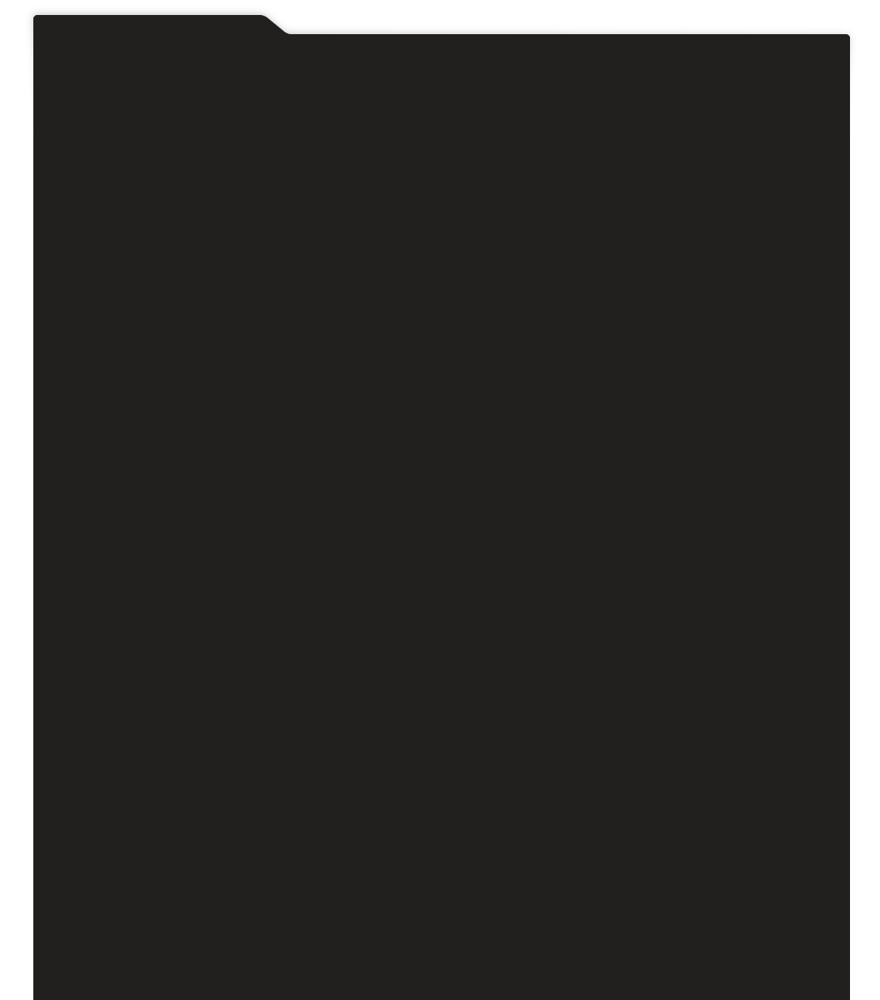
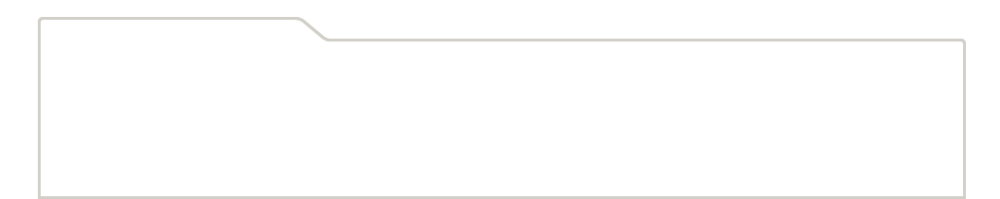
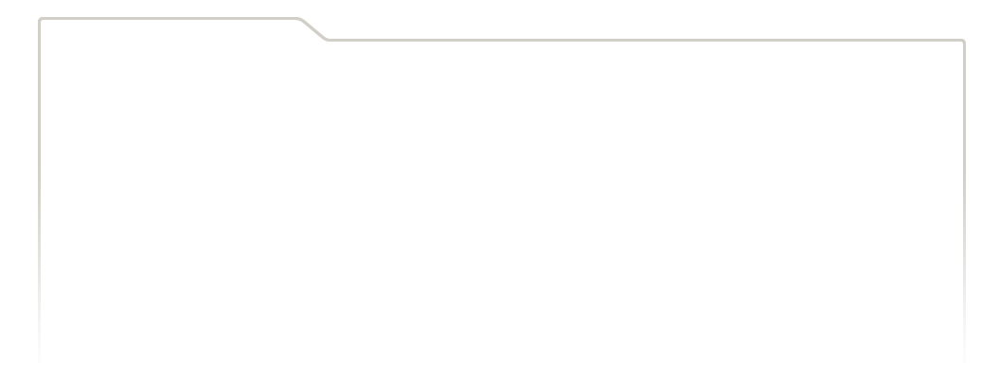
...
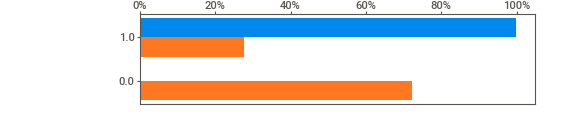
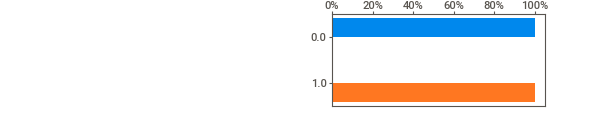
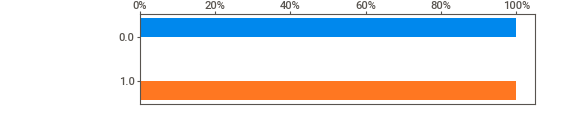
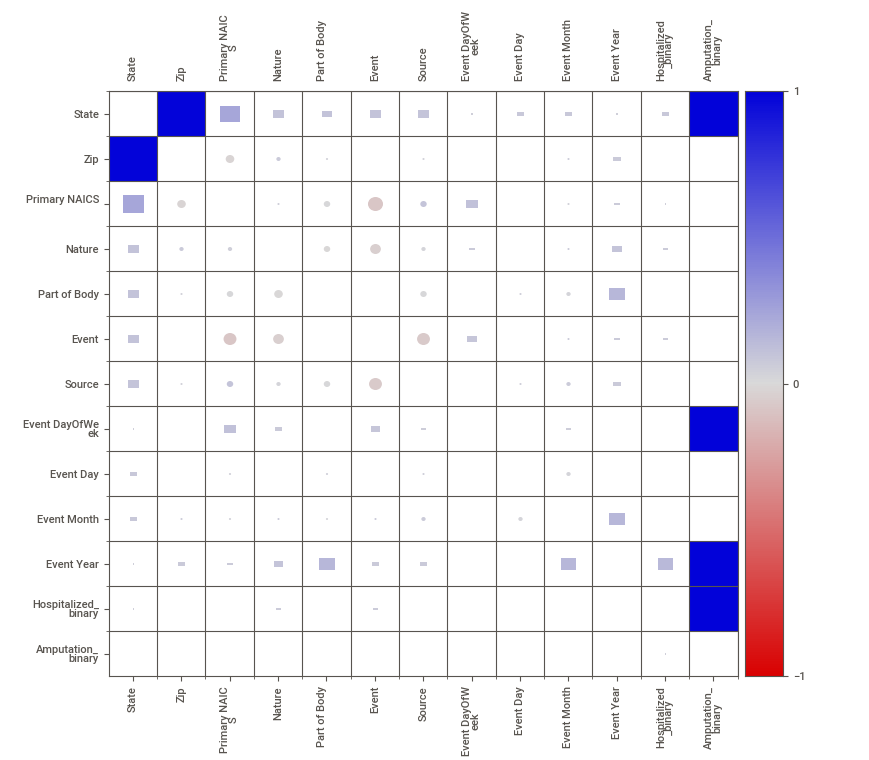
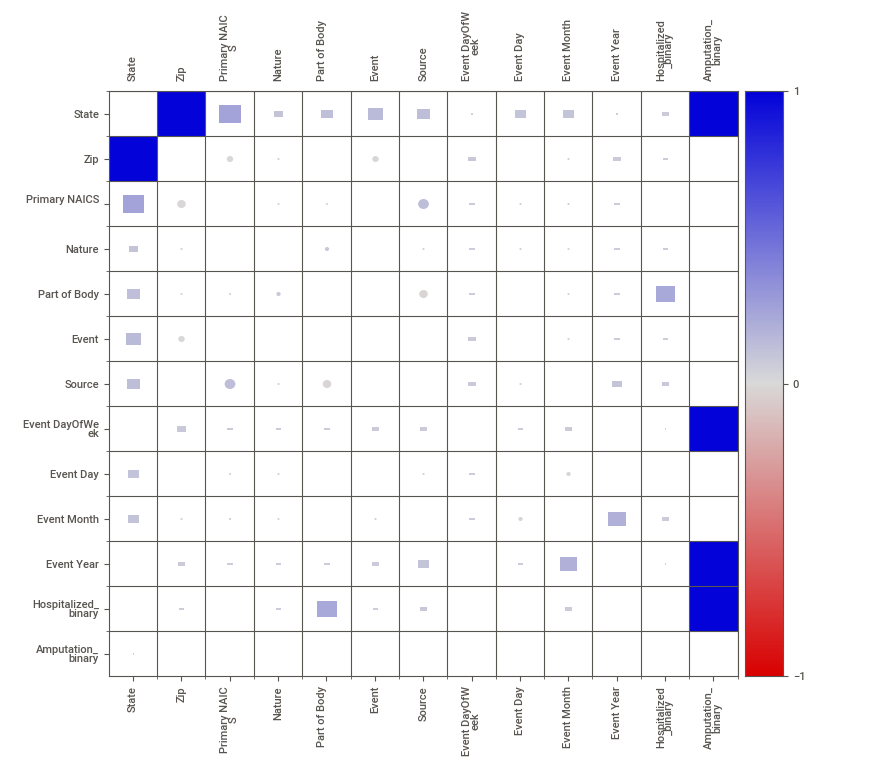

In [ ]:
feature_config = sv.FeatureConfig(force_cat='Amputation_binary')
my_report = sv.compare_intra(data, data['Amputation_binary'] ==0, ["Not Amputated", "Amputated"],feat_cfg= feature_config)
my_report.show_notebook(w='100%')

### 2.3.2 EDA With Python Libraries

<Axes: >

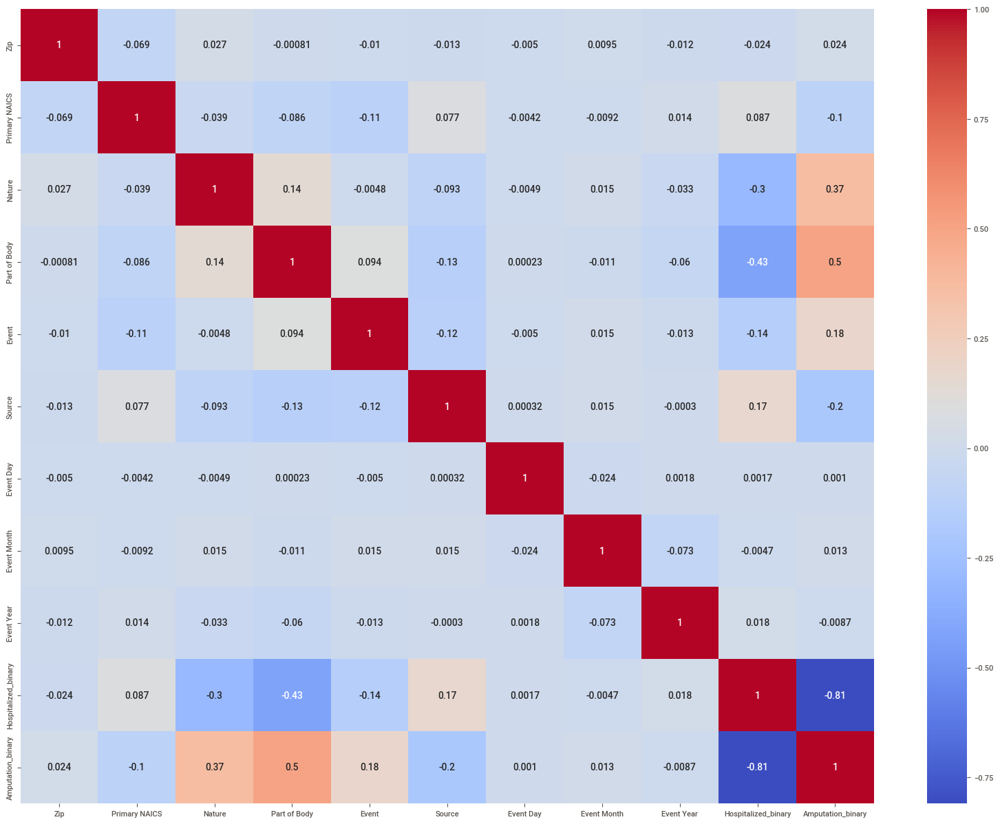

In [ ]:
plt.figure(figsize=(20,15))
sns.heatmap(data.corr(),annot=True,cmap='coolwarm')

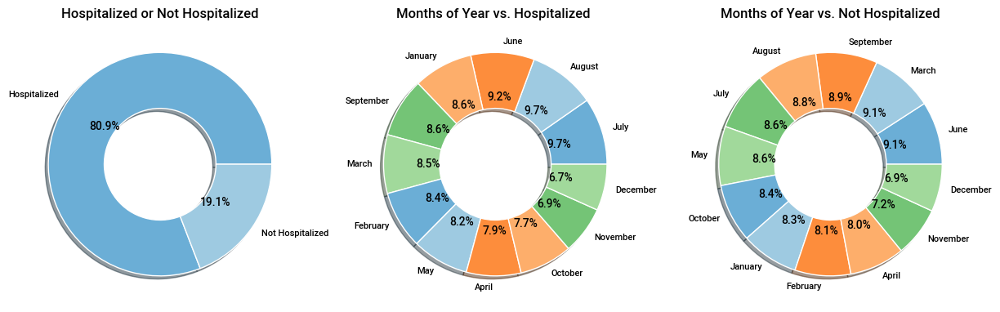

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(15,15))

size = 0.5
Hospitalized_binary_vals = data["Hospitalized_binary"].value_counts()
labels_Hospitalized_binary =  ['Hospitalized', 'Not Hospitalized']

yes = data[data["Hospitalized_binary"]==1.0]["Event Month"].value_counts()
no = data[data["Hospitalized_binary"]==0.0]["Event Month"].value_counts()


Event_Month_vals = data["Event Month"].value_counts()
yes_labels_Event_Month = ['July','August','June','January','September','March','February','May','April','October','November','December']
no_labels_Event_Month = ['June','March','September','August','July','May','October','January','February','April','November','December']

cmap = plt.colormaps["tab20c"]

outer_colors = cmap([1, 2, 5, 6, 9, 10])


ax[0].pie(Hospitalized_binary_vals, radius=1, colors=outer_colors, labels=labels_Hospitalized_binary, autopct="%1.1f%%", shadow=True,
       wedgeprops=dict(width=size, edgecolor='w'))
ax[0].set_title("Hospitalized or Not Hospitalized")

ax[1].pie(yes, radius=1, colors=outer_colors, labels=yes_labels_Event_Month , autopct="%1.1f%%", shadow=True,
       wedgeprops=dict(width=size, edgecolor='w'))
ax[1].set_title("Months of Year vs. Hospitalized ")

ax[2].pie(no, radius=1, colors=outer_colors, labels=no_labels_Event_Month , autopct="%1.1f%%", shadow=True,
       wedgeprops=dict(width=size, edgecolor='w'))
ax[2].set_title("Months of Year vs. Not Hospitalized")


plt.show()

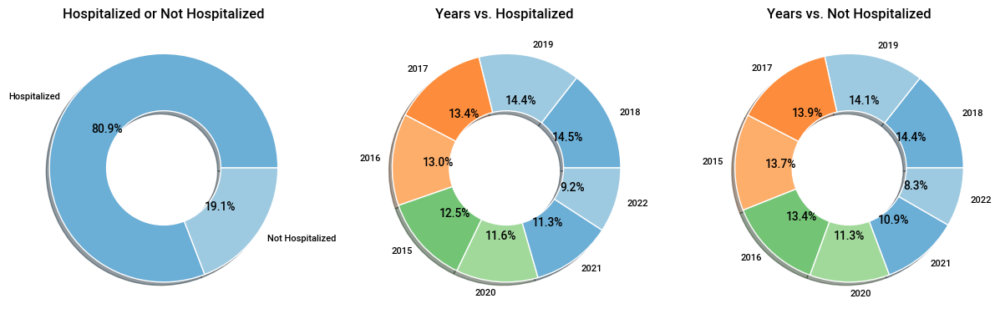

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(15,15))

size = 0.5
Hospitalized_binary_vals = data["Hospitalized_binary"].value_counts()
labels_Hospitalized_binary =  ['Hospitalized', 'Not Hospitalized']

yes = data[data["Hospitalized_binary"]==1.0]["Event Year"].value_counts()
no = data[data["Hospitalized_binary"]==0.0]["Event Year"].value_counts()


Event_Year_vals = data["Event Year"].value_counts()
yes_labels_Event_Year = ['2018','2019','2017','2016','2015','2020','2021','2022']
no_labels_Event_Year = ['2018','2019','2017','2015','2016','2020','2021','2022']

cmap = plt.colormaps["tab20c"]

outer_colors = cmap([1, 2, 5, 6, 9, 10])


ax[0].pie(Hospitalized_binary_vals, radius=1, colors=outer_colors, labels=labels_Hospitalized_binary, autopct="%1.1f%%", shadow=True,
       wedgeprops=dict(width=size, edgecolor='w'))
ax[0].set_title("Hospitalized or Not Hospitalized")

ax[1].pie(yes, radius=1, colors=outer_colors, labels=yes_labels_Event_Year , autopct="%1.1f%%", shadow=True,
       wedgeprops=dict(width=size, edgecolor='w'))
ax[1].set_title("Years vs. Hospitalized ")

ax[2].pie(no, radius=1, colors=outer_colors, labels=no_labels_Event_Year , autopct="%1.1f%%", shadow=True,
       wedgeprops=dict(width=size, edgecolor='w'))
ax[2].set_title("Years vs. Not Hospitalized")


plt.show()

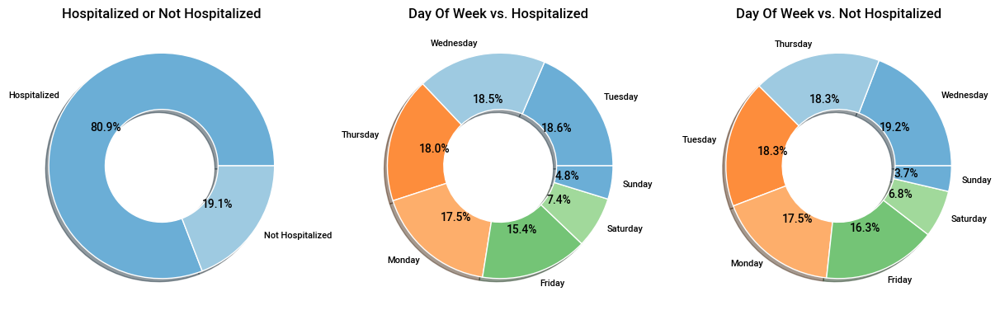

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(15,15))

size = 0.5
Hospitalized_binary_vals = data["Hospitalized_binary"].value_counts()
labels_Hospitalized_binary =  ['Hospitalized', 'Not Hospitalized']

yes = data[data["Hospitalized_binary"]==1.0]["Event DayOfWeek"].value_counts()
no = data[data["Hospitalized_binary"]==0.0]["Event DayOfWeek"].value_counts()


Event_Day_vals = data['Event DayOfWeek'].value_counts()
yes_labels_Day_Week = ['Tuesday','Wednesday','Thursday','Monday','Friday','Saturday','Sunday']
no_labels_Day_Week = ['Wednesday','Thursday','Tuesday','Monday','Friday','Saturday','Sunday']

cmap = plt.colormaps["tab20c"]

outer_colors = cmap([1, 2, 5, 6, 9, 10])


ax[0].pie(Hospitalized_binary_vals, radius=1, colors=outer_colors, labels=labels_Hospitalized_binary, autopct="%1.1f%%", shadow=True,
       wedgeprops=dict(width=size, edgecolor='w'))
ax[0].set_title("Hospitalized or Not Hospitalized")

ax[1].pie(yes, radius=1, colors=outer_colors, labels=yes_labels_Day_Week , autopct="%1.1f%%", shadow=True,
       wedgeprops=dict(width=size, edgecolor='w'))
ax[1].set_title("Day Of Week vs. Hospitalized ")

ax[2].pie(no, radius=1, colors=outer_colors, labels=no_labels_Day_Week , autopct="%1.1f%%", shadow=True,
       wedgeprops=dict(width=size, edgecolor='w'))
ax[2].set_title("Day Of Week vs. Not Hospitalized")


plt.show()

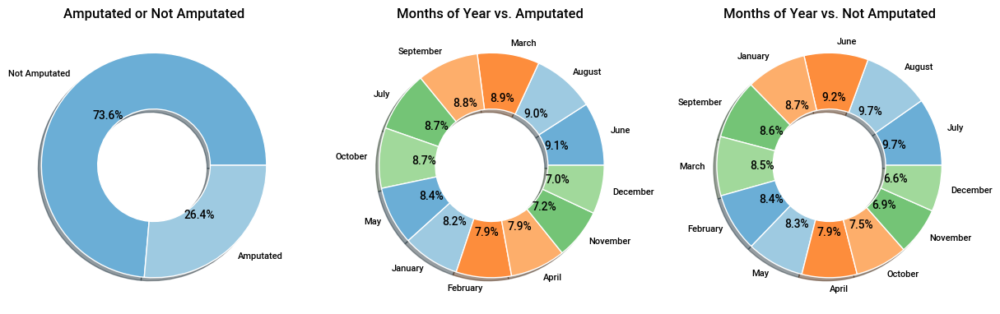

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(15,15))

size = 0.5
Amputation_binary_vals = data["Amputation_binary"].value_counts()
labels_Amputation_binary =  ['Not Amputated', 'Amputated']

yes = data[data["Amputation_binary"]==1.0]["Event Month"].value_counts()
no = data[data["Amputation_binary"]==0.0]["Event Month"].value_counts()


Event_Month_vals = data["Event Month"].value_counts()
yes_labels_Event_Month = ['June','August','March','September','July','October','May','January','February','April','November','December']
no_labels_Event_Month = ['July','August','June','January','September','March','February','May','April','October','November','December']

cmap = plt.colormaps["tab20c"]

outer_colors = cmap([1, 2, 5, 6, 9, 10])


ax[0].pie(Amputation_binary_vals, radius=1, colors=outer_colors, labels=labels_Amputation_binary, autopct="%1.1f%%", shadow=True,
       wedgeprops=dict(width=size, edgecolor='w'))
ax[0].set_title("Amputated or Not Amputated")

ax[1].pie(yes, radius=1, colors=outer_colors, labels=yes_labels_Event_Month , autopct="%1.1f%%", shadow=True,
       wedgeprops=dict(width=size, edgecolor='w'))
ax[1].set_title("Months of Year vs. Amputated ")

ax[2].pie(no, radius=1, colors=outer_colors, labels=no_labels_Event_Month , autopct="%1.1f%%", shadow=True,
       wedgeprops=dict(width=size, edgecolor='w'))
ax[2].set_title("Months of Year vs. Not Amputated")


plt.show()

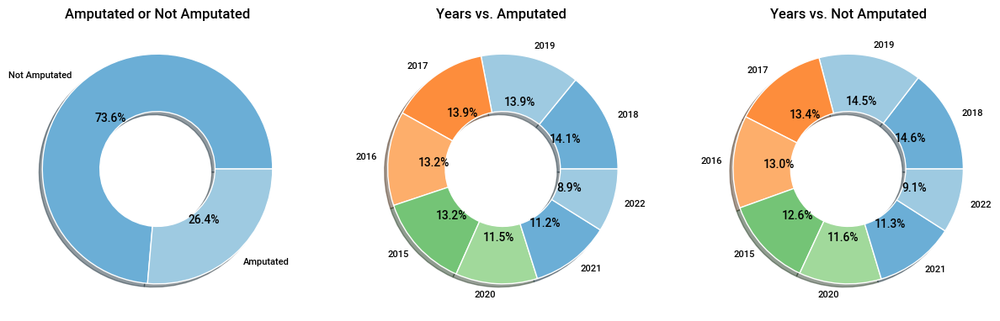

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(15,15))

size = 0.5
Amputation_binary_vals = data["Amputation_binary"].value_counts()
labels_Amputation_binary =  ['Not Amputated', 'Amputated']

yes = data[data["Amputation_binary"]==1.0]["Event Year"].value_counts()
no = data[data["Amputation_binary"]==0.0]["Event Year"].value_counts()


Event_Year_vals = data["Event Year"].value_counts()
yes_labels_Event_Year = ['2018','2019','2017','2016','2015','2020','2021','2022']
no_labels_Event_Year = ['2018','2019','2017','2016','2015','2020','2021','2022']

cmap = plt.colormaps["tab20c"]

outer_colors = cmap([1, 2, 5, 6, 9, 10])


ax[0].pie(Amputation_binary_vals, radius=1, colors=outer_colors, labels=labels_Amputation_binary, autopct="%1.1f%%", shadow=True,
       wedgeprops=dict(width=size, edgecolor='w'))
ax[0].set_title("Amputated or Not Amputated")

ax[1].pie(yes, radius=1, colors=outer_colors, labels=yes_labels_Event_Year , autopct="%1.1f%%", shadow=True,
       wedgeprops=dict(width=size, edgecolor='w'))
ax[1].set_title("Years vs. Amputated ")

ax[2].pie(no, radius=1, colors=outer_colors, labels=no_labels_Event_Year , autopct="%1.1f%%", shadow=True,
       wedgeprops=dict(width=size, edgecolor='w'))
ax[2].set_title("Years vs. Not Amputated")


plt.show()

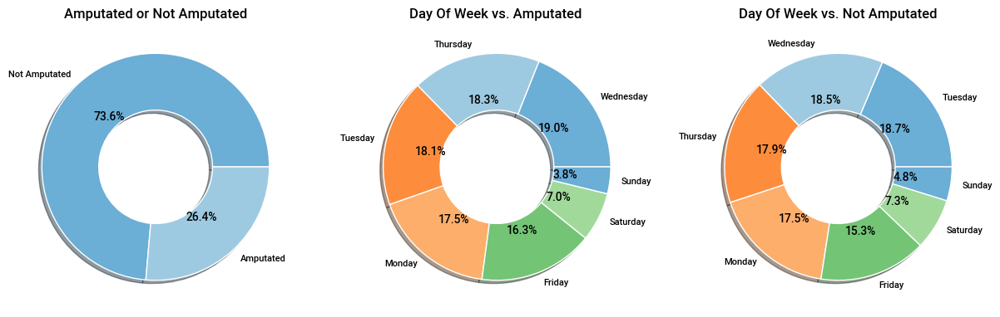

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(15,15))

size = 0.5
Amputation_binary_vals = data["Amputation_binary"].value_counts()
labels_Amputation_binary =  ['Not Amputated', 'Amputated']

yes = data[data["Amputation_binary"]==1.0]["Event DayOfWeek"].value_counts()
no = data[data["Amputation_binary"]==0.0]["Event DayOfWeek"].value_counts()


Event_Day_vals = data['Event DayOfWeek'].value_counts()
yes_labels_Day_Week = ['Wednesday','Thursday','Tuesday','Monday','Friday','Saturday','Sunday']
no_labels_Day_Week = ['Tuesday','Wednesday','Thursday','Monday','Friday','Saturday','Sunday']

cmap = plt.colormaps["tab20c"]

outer_colors = cmap([1, 2, 5, 6, 9, 10])


ax[0].pie(Amputation_binary_vals, radius=1, colors=outer_colors, labels=labels_Amputation_binary, autopct="%1.1f%%", shadow=True,
       wedgeprops=dict(width=size, edgecolor='w'))
ax[0].set_title("Amputated or Not Amputated")

ax[1].pie(yes, radius=1, colors=outer_colors, labels=yes_labels_Day_Week , autopct="%1.1f%%", shadow=True,
       wedgeprops=dict(width=size, edgecolor='w'))
ax[1].set_title("Day Of Week vs. Amputated ")

ax[2].pie(no, radius=1, colors=outer_colors, labels=no_labels_Day_Week , autopct="%1.1f%%", shadow=True,
       wedgeprops=dict(width=size, edgecolor='w'))
ax[2].set_title("Day Of Week vs. Not Amputated")


plt.show()

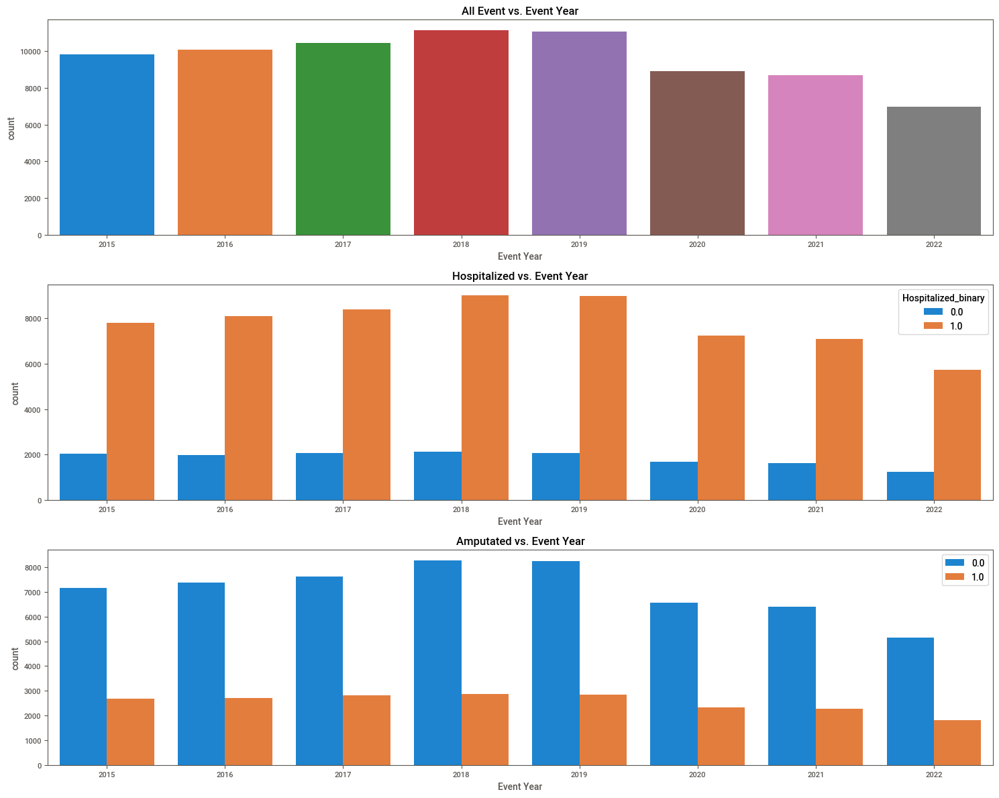

In [ ]:
fig, axes = plt.subplots(3, 1, figsize=(15,12))
sns.countplot(data=data , x='Event Year', ax=axes[0])
axes[0].set_title('All Event vs. Event Year')

sns.countplot(data=data , x='Event Year', hue='Hospitalized_binary', ax=axes[1])
axes[1].set_title('Hospitalized vs. Event Year')

sns.countplot(data=data , x='Event Year', hue='Amputation_binary', ax=axes[2])
axes[2].set_title('Amputated vs. Event Year')


plt.legend()
plt.tight_layout()
plt.show()

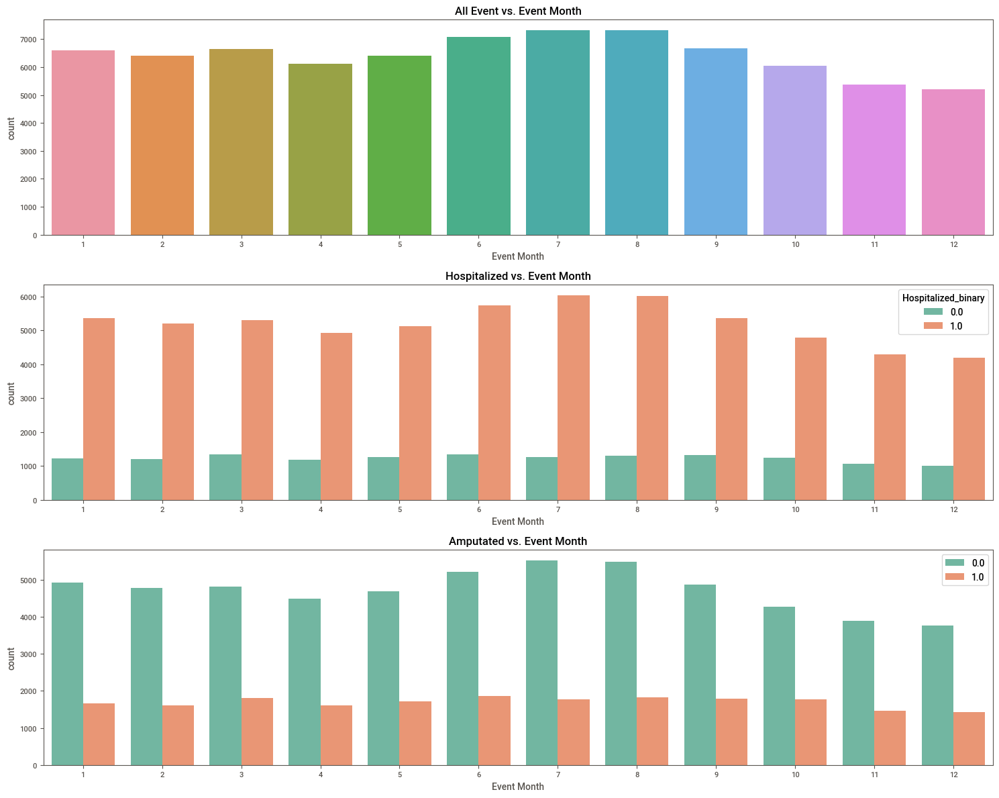

In [ ]:
fig, axes = plt.subplots(3, 1, figsize=(15,12))
sns.countplot(data=data , x='Event Month', ax=axes[0])
axes[0].set_title('All Event vs. Event Month')

sns.countplot(data=data , x='Event Month', hue='Hospitalized_binary', ax=axes[1],palette='Set2')
axes[1].set_title('Hospitalized vs. Event Month')

sns.countplot(data=data , x='Event Month', hue='Amputation_binary', ax=axes[2],palette='Set2')
axes[2].set_title('Amputated vs. Event Month')


plt.legend()
plt.tight_layout()
plt.show()

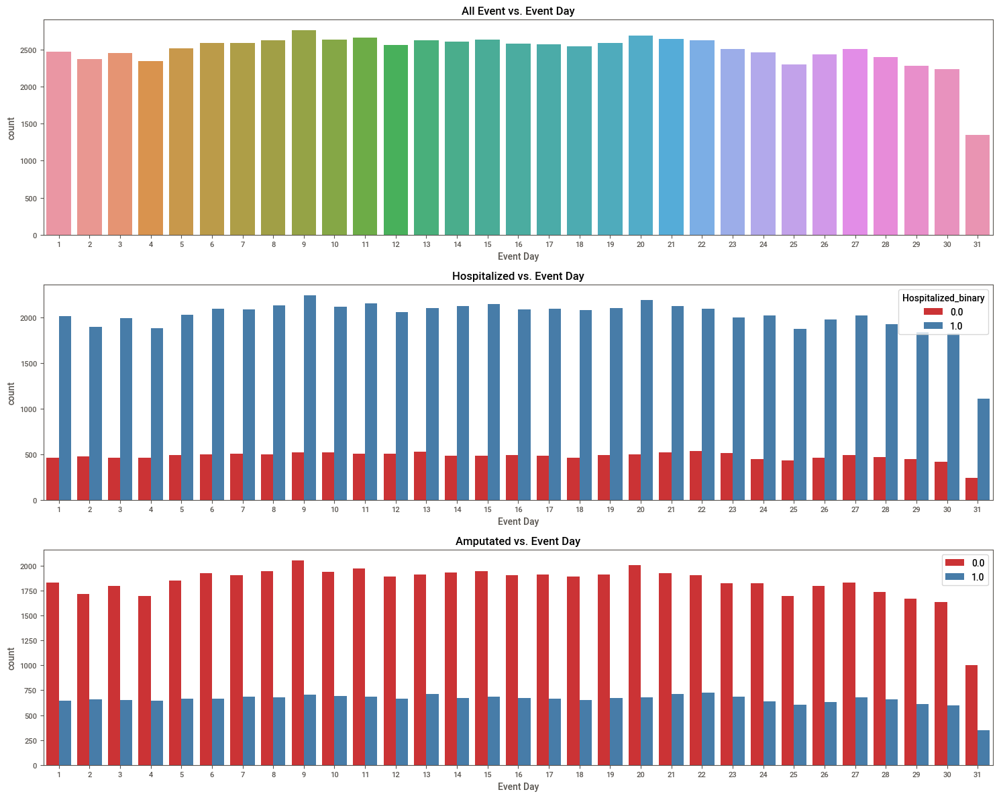

In [ ]:
fig, axes = plt.subplots(3, 1, figsize=(15,12))
sns.countplot(data=data , x='Event Day', ax=axes[0])
axes[0].set_title('All Event vs. Event Day')

sns.countplot(data=data , x='Event Day', hue='Hospitalized_binary', ax=axes[1],palette='Set1')
axes[1].set_title('Hospitalized vs. Event Day')

sns.countplot(data=data , x='Event Day', hue='Amputation_binary', ax=axes[2],palette='Set1')
axes[2].set_title('Amputated vs. Event Day')


plt.legend()
plt.tight_layout()
plt.show()

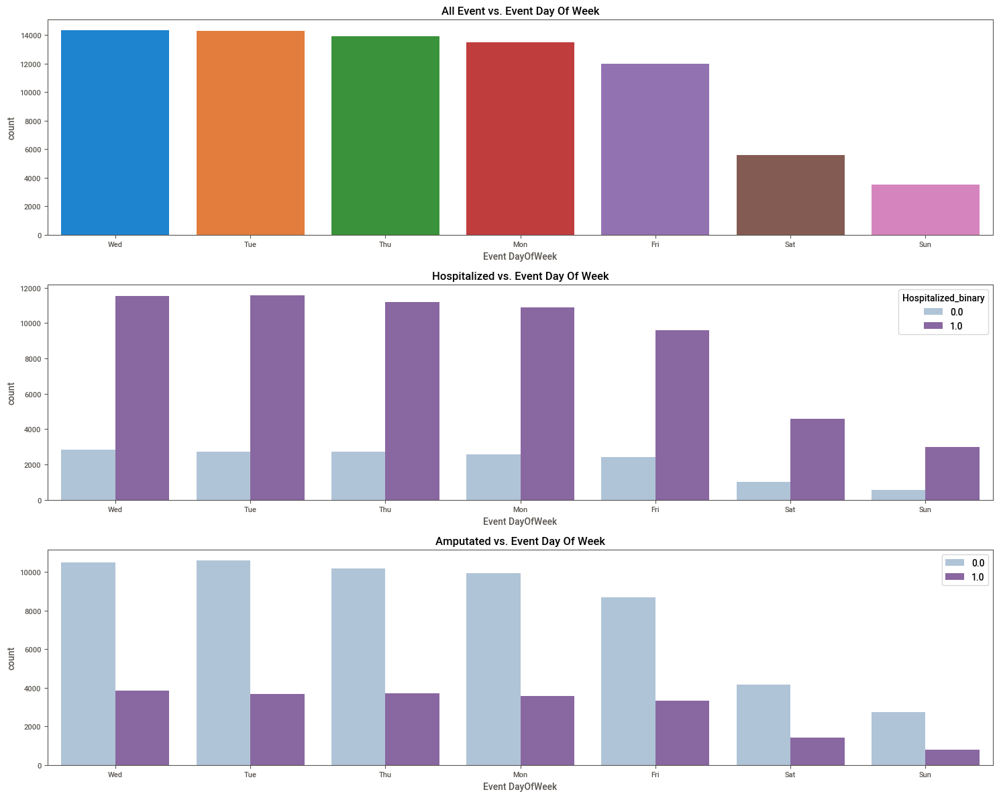

In [ ]:
fig, axes = plt.subplots(3, 1, figsize=(15,12))
sns.countplot(data=data , x='Event DayOfWeek', ax=axes[0],order = data['Event DayOfWeek'].value_counts().index)
axes[0].set_title('All Event vs. Event Day Of Week')

sns.countplot(data=data , x='Event DayOfWeek', hue='Hospitalized_binary', ax=axes[1],palette='BuPu',order = data['Event DayOfWeek'].value_counts().index)
axes[1].set_title('Hospitalized vs. Event Day Of Week')

sns.countplot(data=data , x='Event DayOfWeek', hue='Amputation_binary', ax=axes[2],palette='BuPu',order = data['Event DayOfWeek'].value_counts().index)
axes[2].set_title('Amputated vs. Event Day Of Week')


plt.legend()
plt.tight_layout()
plt.show()

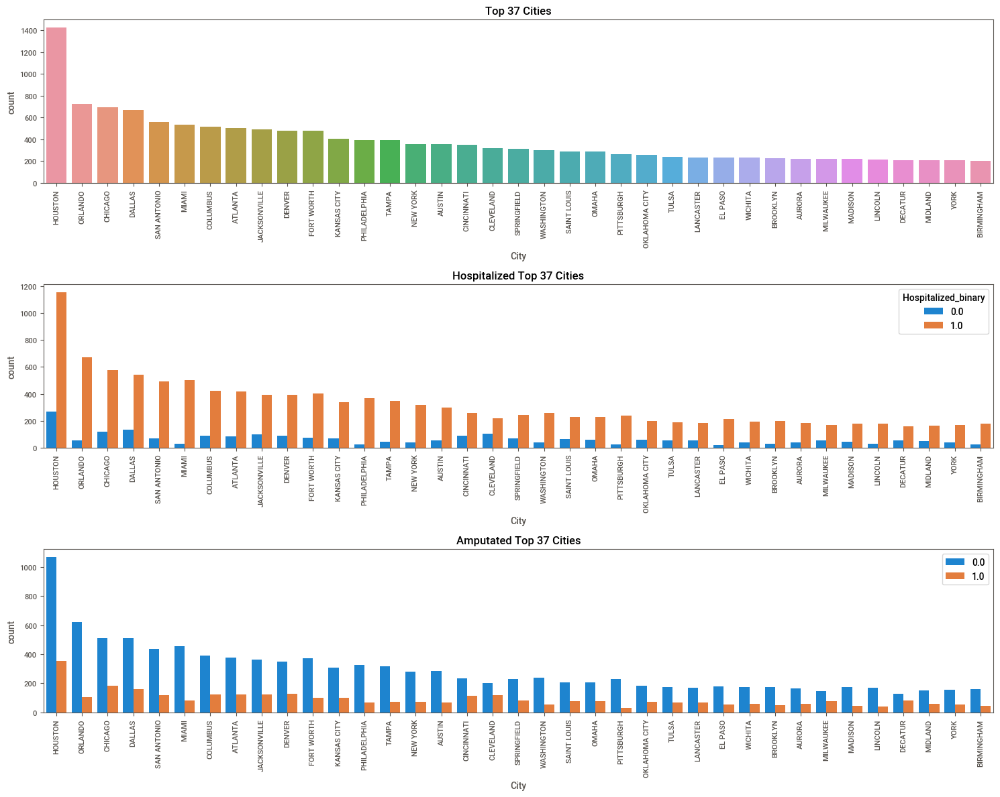

In [ ]:
filtered_City = data[data['City'].map(data['City'].value_counts()) > 200]

fig, axes = plt.subplots(3, 1, figsize=(15,12))
sns.countplot(data=filtered_City , x='City', ax=axes[0],order = filtered_City['City'].value_counts().index).tick_params(axis="x", labelrotation=90)
axes[0].set_title('Top 37 Cities')

sns.countplot(data=filtered_City , x='City', hue='Hospitalized_binary', ax=axes[1],order = filtered_City['City'].value_counts().index).tick_params(axis="x", labelrotation=90)
axes[1].set_title('Hospitalized Top 37 Cities')

sns.countplot(data=filtered_City , x='City', hue='Amputation_binary', ax=axes[2],order = filtered_City['City'].value_counts().index).tick_params(axis="x", labelrotation=90)
axes[2].set_title('Amputated Top 37 Cities')


plt.legend()
plt.tight_layout()
plt.show()

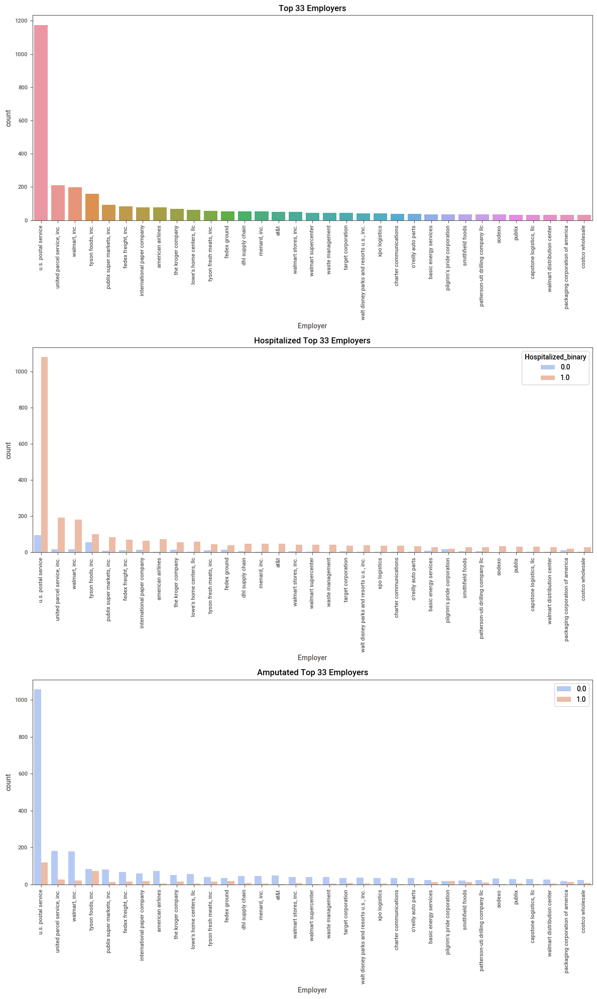

In [ ]:
filtered_Employer = data[data['Employer'].map(data['Employer'].value_counts()) > 30]

fig, axes = plt.subplots(3, 1, figsize=(12,20))
sns.countplot(data=filtered_Employer , x='Employer', ax=axes[0],order = filtered_Employer['Employer'].value_counts().index).tick_params(axis="x", labelrotation=90)
axes[0].set_title('Top 33 Employers')

sns.countplot(data=filtered_Employer , x='Employer', hue='Hospitalized_binary', ax=axes[1],palette='coolwarm',order = filtered_Employer['Employer'].value_counts().index).tick_params(axis="x", labelrotation=90)
axes[1].set_title('Hospitalized Top 33 Employers')

sns.countplot(data=filtered_Employer , x='Employer', hue='Amputation_binary', ax=axes[2],palette='coolwarm',order = filtered_Employer['Employer'].value_counts().index).tick_params(axis="x", labelrotation=90)
axes[2].set_title('Amputated Top 33 Employers')


plt.legend()
plt.tight_layout()
plt.show()

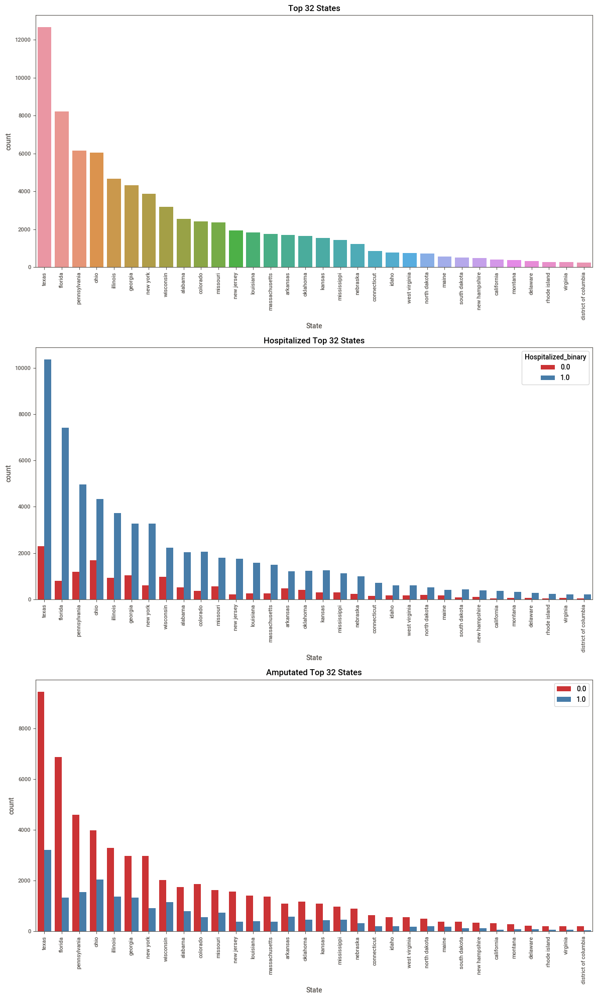

In [ ]:
filtered_State = data[data['State'].map(data['State'].value_counts()) > 200]

fig, axes = plt.subplots(3, 1, figsize=(12,20))
sns.countplot(data=filtered_State , x='State', ax=axes[0],order = filtered_State['State'].value_counts().index).tick_params(axis="x", labelrotation=90)
axes[0].set_title('Top 32 States')

sns.countplot(data=filtered_State , x='State', hue='Hospitalized_binary', ax=axes[1],palette='Set1',order = filtered_State['State'].value_counts().index).tick_params(axis="x", labelrotation=90)
axes[1].set_title('Hospitalized Top 32 States')

sns.countplot(data=filtered_State , x='State', hue='Amputation_binary', ax=axes[2],palette='Set1',order = filtered_State['State'].value_counts().index).tick_params(axis="x", labelrotation=90)
axes[2].set_title('Amputated Top 32 States')


plt.legend()
plt.tight_layout()
plt.show()

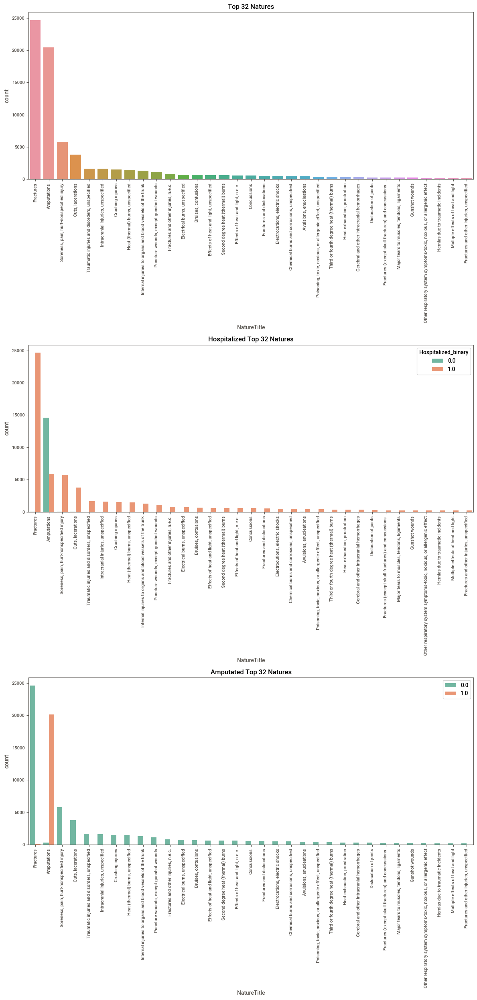

In [ ]:
filtered_Nature = data[data['NatureTitle'].map(data['NatureTitle'].value_counts()) > 200]

fig, axes = plt.subplots(3, 1, figsize=(12,25))
sns.countplot(data=filtered_Nature , x='NatureTitle', ax=axes[0],order = filtered_Nature['NatureTitle'].value_counts().index).tick_params(axis="x", labelrotation=90)
axes[0].set_title('Top 32 Natures')

sns.countplot(data=filtered_Nature , x='NatureTitle', hue='Hospitalized_binary', ax=axes[1],palette='Set2',order = filtered_Nature['NatureTitle'].value_counts().index).tick_params(axis="x", labelrotation=90)
axes[1].set_title('Hospitalized Top 32 Natures')

sns.countplot(data=filtered_Nature , x='NatureTitle', hue='Amputation_binary', ax=axes[2],palette='Set2',order = filtered_Nature['NatureTitle'].value_counts().index).tick_params(axis="x", labelrotation=90)
axes[2].set_title('Amputated Top 32 Natures')


plt.legend()
plt.tight_layout()
plt.show()

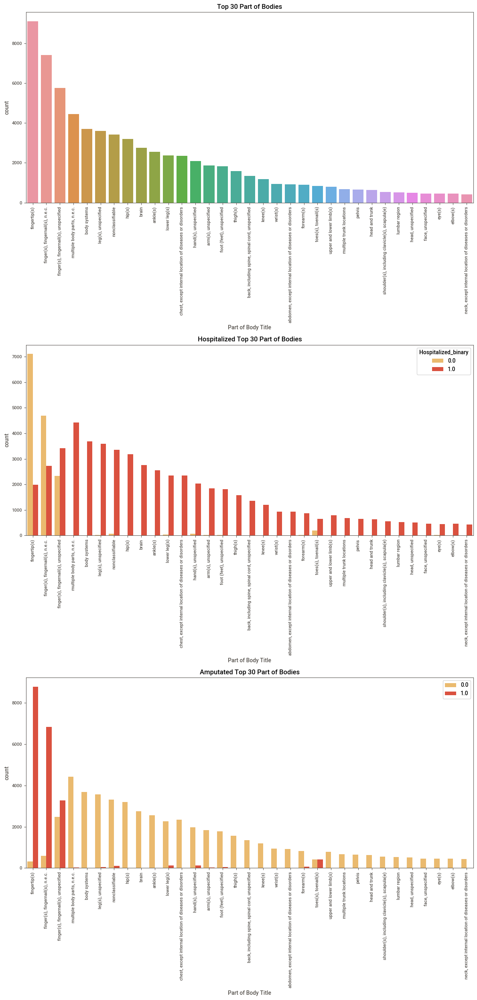

In [ ]:
filtered_PartofBody = data[data['Part of Body Title'].map(data['Part of Body Title'].value_counts()) > 400]
fig, axes = plt.subplots(3, 1, figsize=(12,25))
sns.countplot(data=filtered_PartofBody , x='Part of Body Title', ax=axes[0],order = filtered_PartofBody['Part of Body Title'].value_counts().index).tick_params(axis="x", labelrotation=90)
axes[0].set_title('Top 30 Part of Bodies')

sns.countplot(data=filtered_PartofBody , x='Part of Body Title', hue='Hospitalized_binary', ax=axes[1],palette='YlOrRd',order = filtered_PartofBody['Part of Body Title'].value_counts().index).tick_params(axis="x", labelrotation=90)
axes[1].set_title('Hospitalized Top 30 Part of Bodies')

sns.countplot(data=filtered_PartofBody , x='Part of Body Title', hue='Amputation_binary', ax=axes[2],palette='YlOrRd',order = filtered_PartofBody['Part of Body Title'].value_counts().index).tick_params(axis="x", labelrotation=90)
axes[2].set_title('Amputated Top 30 Part of Bodies')


plt.legend()
plt.tight_layout()
plt.show()

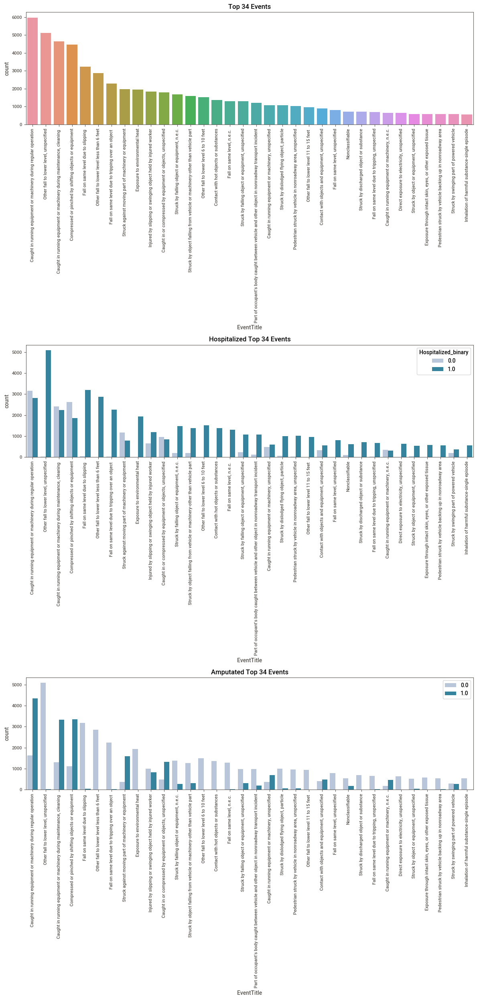

In [ ]:
filtered_Event = data[data['EventTitle'].map(data['EventTitle'].value_counts()) > 500]
fig, axes = plt.subplots(3, 1, figsize=(12,25))
sns.countplot(data=filtered_Event , x='EventTitle', ax=axes[0],order = filtered_Event['EventTitle'].value_counts().index).tick_params(axis="x", labelrotation=90)
axes[0].set_title('Top 34 Events')

sns.countplot(data=filtered_Event , x='EventTitle', hue='Hospitalized_binary', ax=axes[1],palette='PuBuGn',order = filtered_Event['EventTitle'].value_counts().index).tick_params(axis="x", labelrotation=90)
axes[1].set_title('Hospitalized Top 34 Events')

sns.countplot(data=filtered_Event , x='EventTitle', hue='Amputation_binary', ax=axes[2],palette='PuBuGn',order = filtered_Event['EventTitle'].value_counts().index).tick_params(axis="x", labelrotation=90)
axes[2].set_title('Amputated Top 34 Events')


plt.legend()
plt.tight_layout()
plt.show()

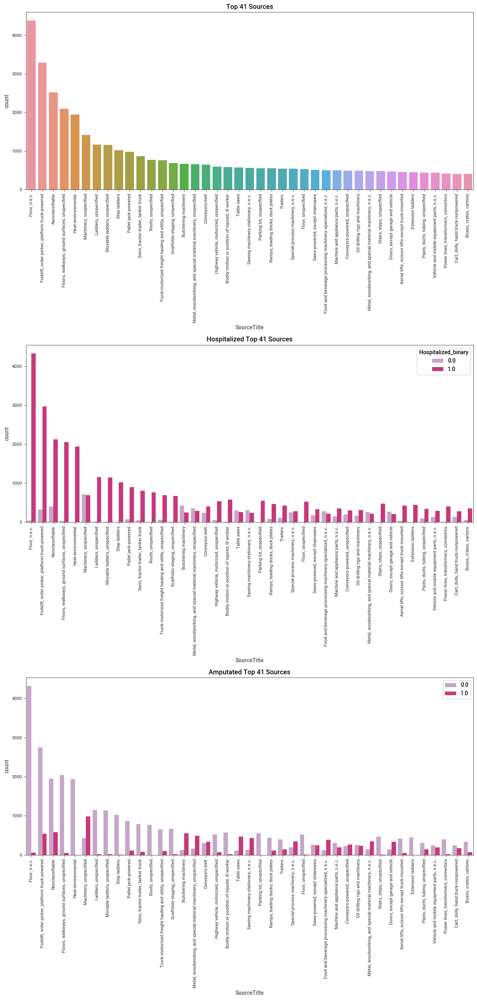

In [ ]:
filtered_Source = data[data['SourceTitle'].map(data['SourceTitle'].value_counts()) > 400]
fig, axes = plt.subplots(3, 1, figsize=(12,25))
sns.countplot(data=filtered_Source , x='SourceTitle', ax=axes[0],order = filtered_Source['SourceTitle'].value_counts().index).tick_params(axis="x", labelrotation=90)
axes[0].set_title('Top 41 Sources')

sns.countplot(data=filtered_Source , x='SourceTitle', hue='Hospitalized_binary', ax=axes[1],palette='PuRd',order = filtered_Source['SourceTitle'].value_counts().index).tick_params(axis="x", labelrotation=90)
axes[1].set_title('Hospitalized Top 41 Sources')

sns.countplot(data=filtered_Source , x='SourceTitle', hue='Amputation_binary', ax=axes[2],palette='PuRd',order = filtered_Source['SourceTitle'].value_counts().index).tick_params(axis="x", labelrotation=90)
axes[2].set_title('Amputated Top 41 Sources')


plt.legend()
plt.tight_layout()
plt.show()

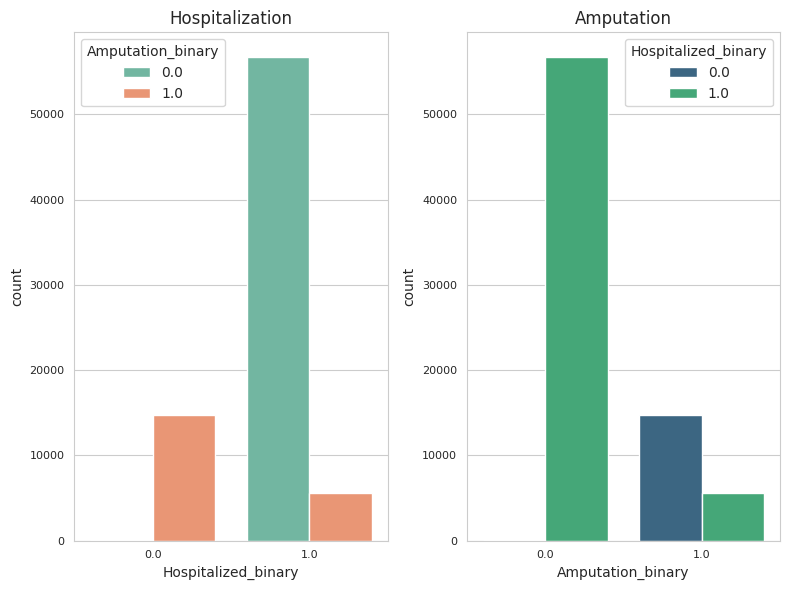

In [ ]:
sns.set_style('whitegrid')
fig, axes = plt.subplots(1, 2, figsize=(8,6))
sns.countplot(data=data , x='Hospitalized_binary',hue='Amputation_binary', ax=axes[0],palette='Set2')
axes[0].set_title('Hospitalization')

sns.countplot(data=data , x='Amputation_binary',hue='Hospitalized_binary', ax=axes[1],palette='viridis')
axes[1].set_title('Amputation')

plt.tight_layout()
plt.show()

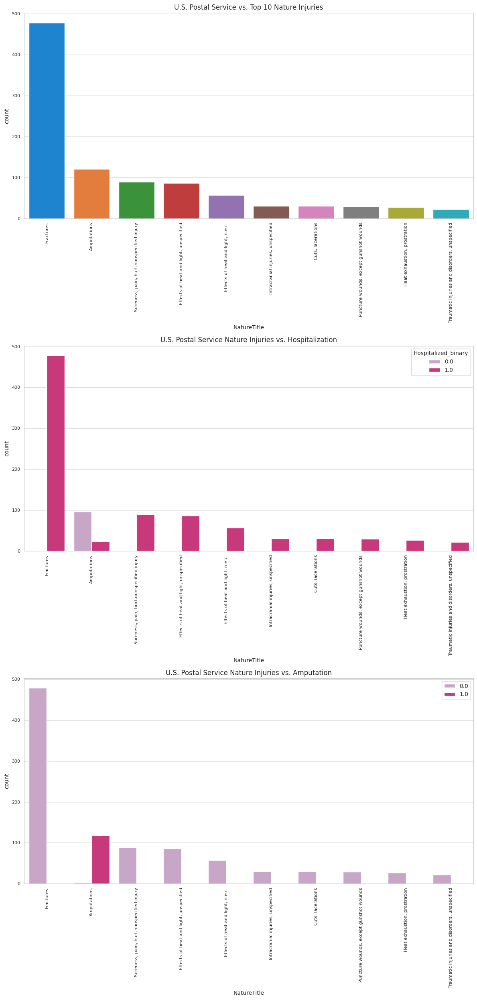

In [ ]:
usps = data[data['Employer']=='u.s. postal service']
filtered_usps = usps[usps['NatureTitle'].map(usps['NatureTitle'].value_counts()) > 20]
fig, axes = plt.subplots(3, 1, figsize=(12,25))
sns.countplot(data=filtered_usps , x='NatureTitle',
              ax=axes[0],order = filtered_usps['NatureTitle'].value_counts().index).tick_params(axis="x", labelrotation=90)
axes[0].set_title('U.S. Postal Service vs. Top 10 Nature Injuries')

sns.countplot(data=filtered_usps , x='NatureTitle', hue='Hospitalized_binary',
              ax=axes[1],order = filtered_usps['NatureTitle'].value_counts().index,palette='PuRd').tick_params(axis="x", labelrotation=90)
axes[1].set_title('U.S. Postal Service Nature Injuries vs. Hospitalization')

sns.countplot(data=filtered_usps , x='NatureTitle', hue='Amputation_binary',
              ax=axes[2],order = filtered_usps['NatureTitle'].value_counts().index,palette='PuRd').tick_params(axis="x", labelrotation=90)
axes[2].set_title('U.S. Postal Service Nature Injuries vs. Amputation')


plt.legend()
plt.tight_layout()
plt.show()

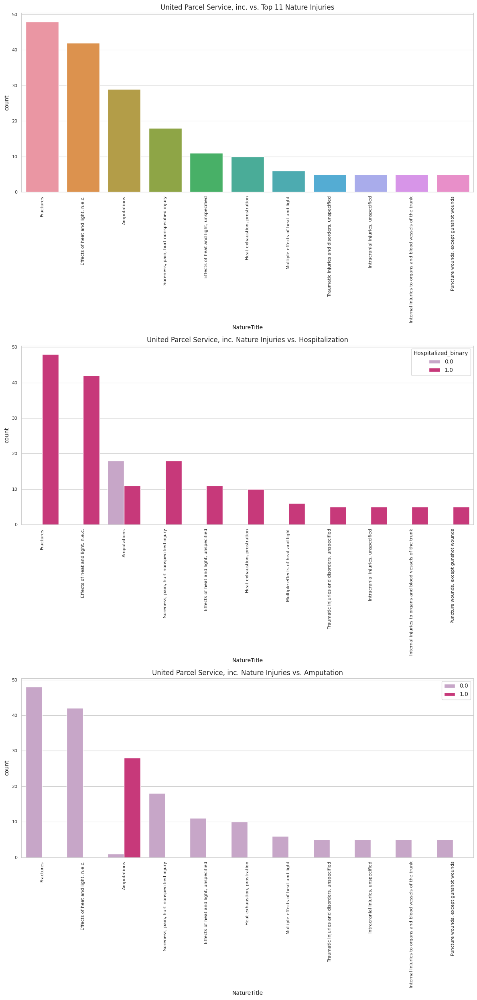

In [ ]:
ups = data[data['Employer']=='united parcel service, inc.']
filtered_ups = ups[ups['NatureTitle'].map(ups['NatureTitle'].value_counts()> 4)]
fig, axes = plt.subplots(3, 1, figsize=(12,25))
sns.countplot(data=filtered_ups , x='NatureTitle',
              ax=axes[0],order = filtered_ups['NatureTitle'].value_counts().index).tick_params(axis="x", labelrotation=90)
axes[0].set_title('United Parcel Service, inc. vs. Top 11 Nature Injuries')

sns.countplot(data=filtered_ups , x='NatureTitle', hue='Hospitalized_binary',
              ax=axes[1],order = filtered_ups['NatureTitle'].value_counts().index,palette='PuRd').tick_params(axis="x", labelrotation=90)
axes[1].set_title('United Parcel Service, inc. Nature Injuries vs. Hospitalization')

sns.countplot(data=filtered_ups , x='NatureTitle', hue='Amputation_binary',
              ax=axes[2],order = filtered_ups['NatureTitle'].value_counts().index,palette='PuRd').tick_params(axis="x", labelrotation=90)
axes[2].set_title('United Parcel Service, inc. Nature Injuries vs. Amputation')


plt.legend()
plt.tight_layout()
plt.show()

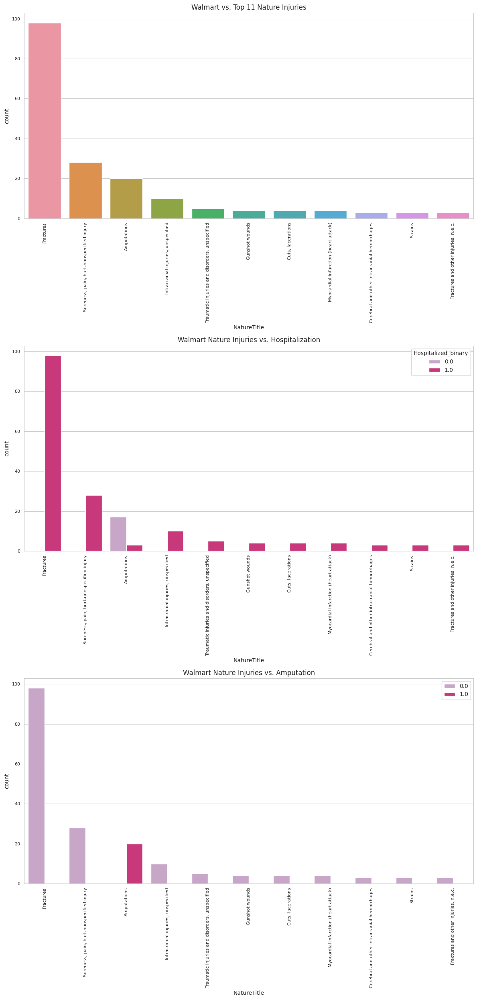

In [ ]:
walmart = data[data['Employer']=='walmart, inc.']
filtered_walmart = walmart[walmart['NatureTitle'].map(walmart['NatureTitle'].value_counts()> 2)]
fig, axes = plt.subplots(3, 1, figsize=(12,25))
sns.countplot(data=filtered_walmart , x='NatureTitle',
              ax=axes[0],order = filtered_walmart['NatureTitle'].value_counts().index).tick_params(axis="x", labelrotation=90)
axes[0].set_title('Walmart vs. Top 11 Nature Injuries')

sns.countplot(data=filtered_walmart , x='NatureTitle', hue='Hospitalized_binary',
              ax=axes[1],order = filtered_walmart['NatureTitle'].value_counts().index,palette='PuRd').tick_params(axis="x", labelrotation=90)
axes[1].set_title('Walmart Nature Injuries vs. Hospitalization')

sns.countplot(data=filtered_walmart , x='NatureTitle', hue='Amputation_binary',
              ax=axes[2],order = filtered_walmart['NatureTitle'].value_counts().index,palette='PuRd').tick_params(axis="x", labelrotation=90)
axes[2].set_title('Walmart Nature Injuries vs. Amputation')


plt.legend()
plt.tight_layout()
plt.show()

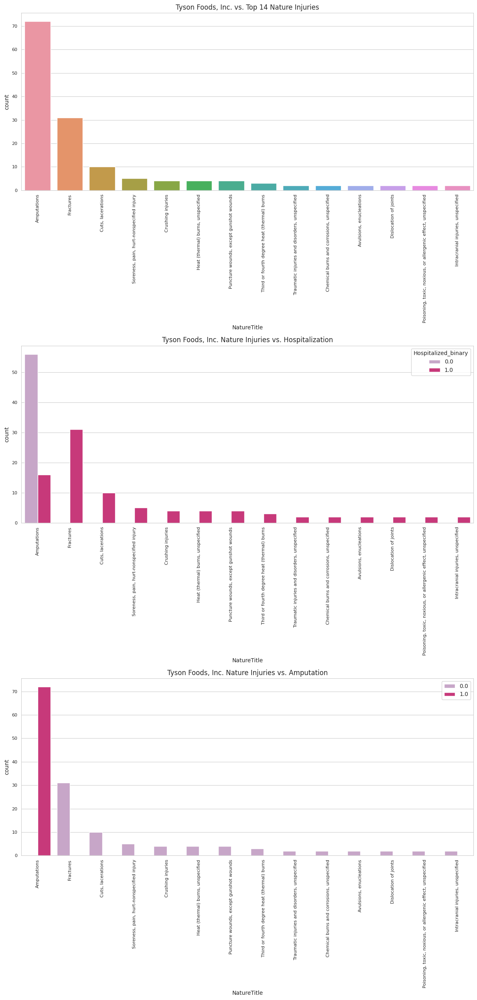

In [ ]:
tyson = data[data['Employer']=='tyson foods, inc.']
filtered_tyson = tyson[tyson['NatureTitle'].map(tyson['NatureTitle'].value_counts()> 1)]
fig, axes = plt.subplots(3, 1, figsize=(12,25))
sns.countplot(data=filtered_tyson , x='NatureTitle',
              ax=axes[0],order = filtered_tyson['NatureTitle'].value_counts().index).tick_params(axis="x", labelrotation=90)
axes[0].set_title('Tyson Foods, Inc. vs. Top 14 Nature Injuries')

sns.countplot(data=filtered_tyson , x='NatureTitle', hue='Hospitalized_binary',
              ax=axes[1],order = filtered_tyson['NatureTitle'].value_counts().index,palette='PuRd').tick_params(axis="x", labelrotation=90)
axes[1].set_title('Tyson Foods, Inc. Nature Injuries vs. Hospitalization')

sns.countplot(data=filtered_tyson , x='NatureTitle', hue='Amputation_binary',
              ax=axes[2],order = filtered_tyson['NatureTitle'].value_counts().index,palette='PuRd').tick_params(axis="x", labelrotation=90)
axes[2].set_title('Tyson Foods, Inc. Nature Injuries vs. Amputation')


plt.legend()
plt.tight_layout()
plt.show()

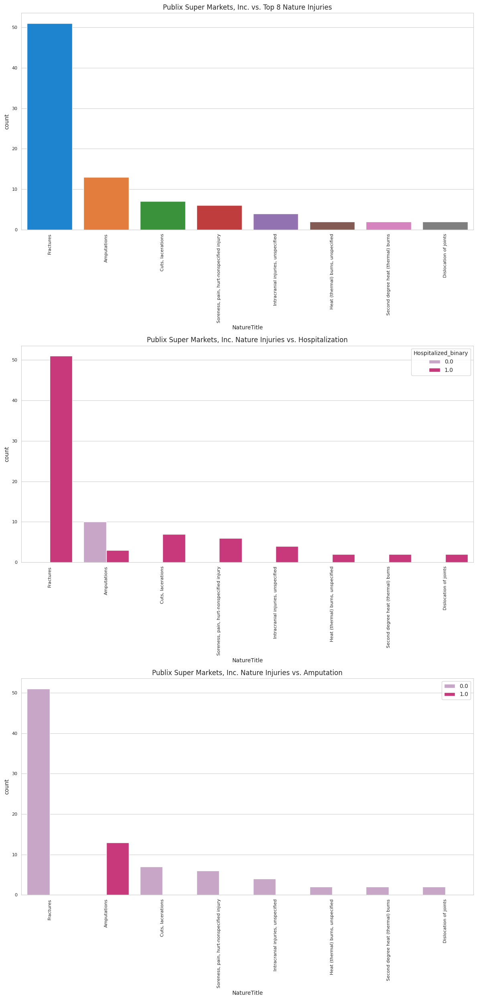

In [ ]:
psm = data[data['Employer']=='publix super markets, inc.']
filtered_psm = psm[psm['NatureTitle'].map(psm['NatureTitle'].value_counts()> 1)]
fig, axes = plt.subplots(3, 1, figsize=(12,25))
sns.countplot(data=filtered_psm , x='NatureTitle',
              ax=axes[0],order = filtered_psm['NatureTitle'].value_counts().index).tick_params(axis="x", labelrotation=90)
axes[0].set_title('Publix Super Markets, Inc. vs. Top 8 Nature Injuries')

sns.countplot(data=filtered_psm , x='NatureTitle', hue='Hospitalized_binary',
              ax=axes[1],order = filtered_psm['NatureTitle'].value_counts().index,palette='PuRd').tick_params(axis="x", labelrotation=90)
axes[1].set_title('Publix Super Markets, Inc. Nature Injuries vs. Hospitalization')

sns.countplot(data=filtered_psm , x='NatureTitle', hue='Amputation_binary',
              ax=axes[2],order = filtered_psm['NatureTitle'].value_counts().index,palette='PuRd').tick_params(axis="x", labelrotation=90)
axes[2].set_title('Publix Super Markets, Inc. Nature Injuries vs. Amputation')


plt.legend()
plt.tight_layout()
plt.show()

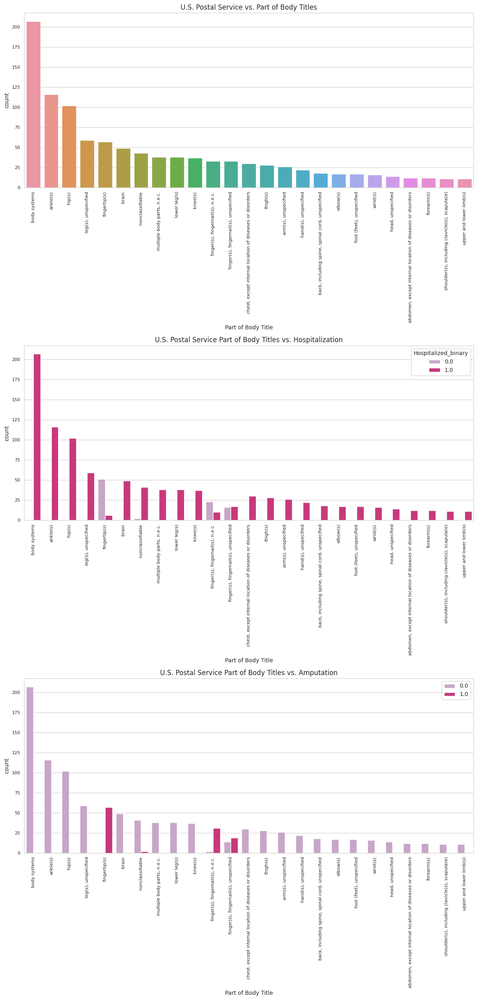

In [ ]:
usps = data[data['Employer']=='u.s. postal service']
filtered_usps = usps[usps['Part of Body Title'].map(usps['Part of Body Title'].value_counts()) > 10]
fig, axes = plt.subplots(3, 1, figsize=(12,25))
sns.countplot(data=filtered_usps , x='Part of Body Title',
              ax=axes[0],order = filtered_usps['Part of Body Title'].value_counts().index).tick_params(axis="x", labelrotation=90)
axes[0].set_title('U.S. Postal Service vs. Part of Body Titles')

sns.countplot(data=filtered_usps , x='Part of Body Title', hue='Hospitalized_binary',
              ax=axes[1],order = filtered_usps['Part of Body Title'].value_counts().index,palette='PuRd').tick_params(axis="x", labelrotation=90)
axes[1].set_title('U.S. Postal Service Part of Body Titles vs. Hospitalization')

sns.countplot(data=filtered_usps , x='Part of Body Title', hue='Amputation_binary',
              ax=axes[2],order = filtered_usps['Part of Body Title'].value_counts().index,palette='PuRd').tick_params(axis="x", labelrotation=90)
axes[2].set_title('U.S. Postal Service Part of Body Titles vs. Amputation')


plt.legend()
plt.tight_layout()
plt.show()

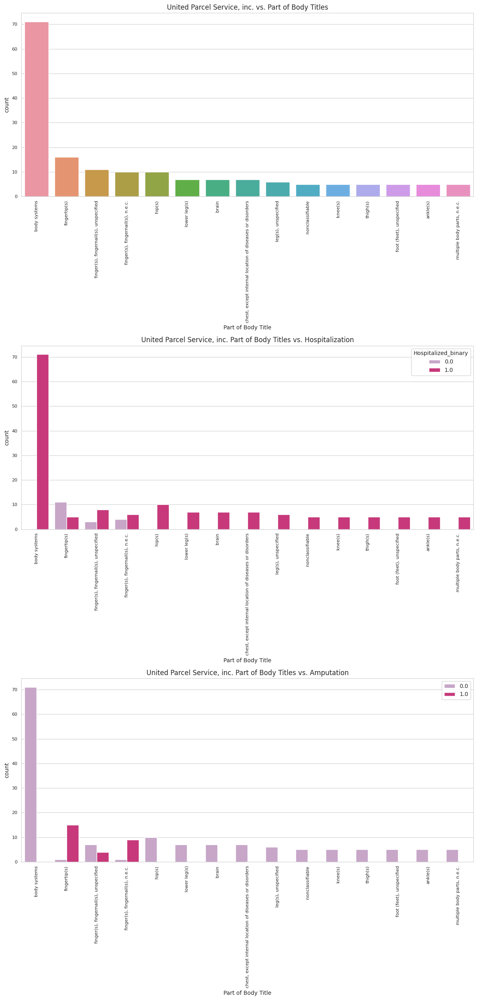

In [ ]:
ups = data[data['Employer']=='united parcel service, inc.']
filtered_ups = ups[ups['Part of Body Title'].map(ups['Part of Body Title'].value_counts()> 4)]
fig, axes = plt.subplots(3, 1, figsize=(12,25))
sns.countplot(data=filtered_ups , x='Part of Body Title',
              ax=axes[0],order = filtered_ups['Part of Body Title'].value_counts().index).tick_params(axis="x", labelrotation=90)
axes[0].set_title('United Parcel Service, inc. vs. Part of Body Titles')

sns.countplot(data=filtered_ups , x='Part of Body Title', hue='Hospitalized_binary',
              ax=axes[1],order = filtered_ups['Part of Body Title'].value_counts().index,palette='PuRd').tick_params(axis="x", labelrotation=90)
axes[1].set_title('United Parcel Service, inc. Part of Body Titles vs. Hospitalization')

sns.countplot(data=filtered_ups , x='Part of Body Title', hue='Amputation_binary',
              ax=axes[2],order = filtered_ups['Part of Body Title'].value_counts().index,palette='PuRd').tick_params(axis="x", labelrotation=90)
axes[2].set_title('United Parcel Service, inc. Part of Body Titles vs. Amputation')


plt.legend()
plt.tight_layout()
plt.show()

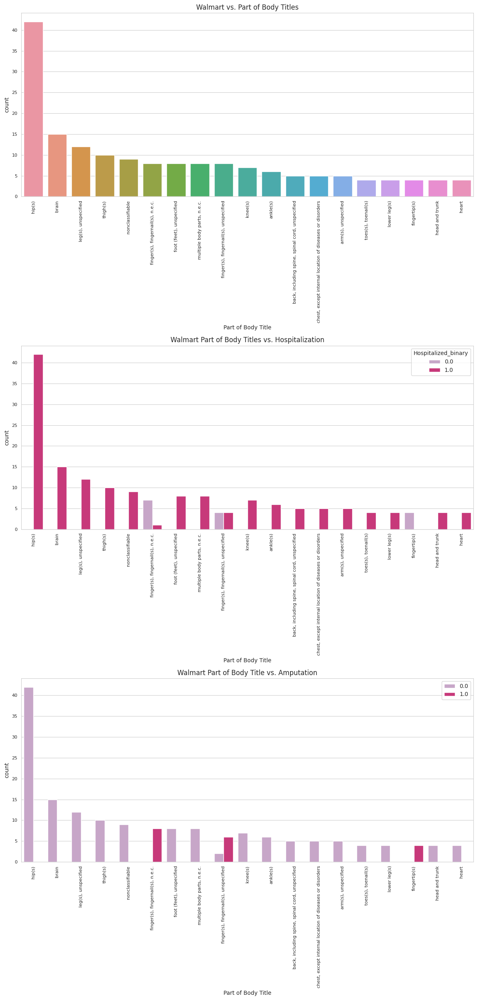

In [ ]:
walmart = data[data['Employer']=='walmart, inc.']
filtered_walmart = walmart[walmart['Part of Body Title'].map(walmart['Part of Body Title'].value_counts()> 3)]
fig, axes = plt.subplots(3, 1, figsize=(12,25))
sns.countplot(data=filtered_walmart , x='Part of Body Title',
              ax=axes[0],order = filtered_walmart['Part of Body Title'].value_counts().index).tick_params(axis="x", labelrotation=90)
axes[0].set_title('Walmart vs. Part of Body Titles')

sns.countplot(data=filtered_walmart , x='Part of Body Title', hue='Hospitalized_binary',
              ax=axes[1],order = filtered_walmart['Part of Body Title'].value_counts().index,palette='PuRd').tick_params(axis="x", labelrotation=90)
axes[1].set_title('Walmart Part of Body Titles vs. Hospitalization')

sns.countplot(data=filtered_walmart , x='Part of Body Title', hue='Amputation_binary',
              ax=axes[2],order = filtered_walmart['Part of Body Title'].value_counts().index,palette='PuRd').tick_params(axis="x", labelrotation=90)
axes[2].set_title('Walmart Part of Body Title vs. Amputation')


plt.legend()
plt.tight_layout()
plt.show()

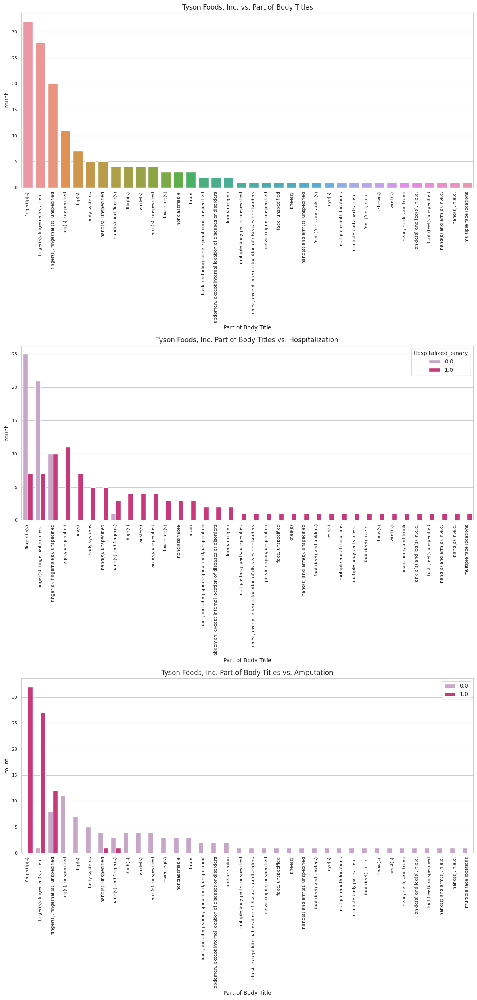

In [ ]:
tyson = data[data['Employer']=='tyson foods, inc.']
filtered_tyson = tyson[tyson['Part of Body Title'].map(tyson['Part of Body Title'].value_counts()> 0)]
fig, axes = plt.subplots(3, 1, figsize=(12,25))
sns.countplot(data=filtered_tyson , x='Part of Body Title',
              ax=axes[0],order = filtered_tyson['Part of Body Title'].value_counts().index).tick_params(axis="x", labelrotation=90)
axes[0].set_title('Tyson Foods, Inc. vs. Part of Body Titles')

sns.countplot(data=filtered_tyson , x='Part of Body Title', hue='Hospitalized_binary',
              ax=axes[1],order = filtered_tyson['Part of Body Title'].value_counts().index,palette='PuRd').tick_params(axis="x", labelrotation=90)
axes[1].set_title('Tyson Foods, Inc. Part of Body Titles vs. Hospitalization')

sns.countplot(data=filtered_tyson , x='Part of Body Title', hue='Amputation_binary',
              ax=axes[2],order = filtered_tyson['Part of Body Title'].value_counts().index,palette='PuRd').tick_params(axis="x", labelrotation=90)
axes[2].set_title('Tyson Foods, Inc. Part of Body Titles vs. Amputation')


plt.legend()
plt.tight_layout()
plt.show()

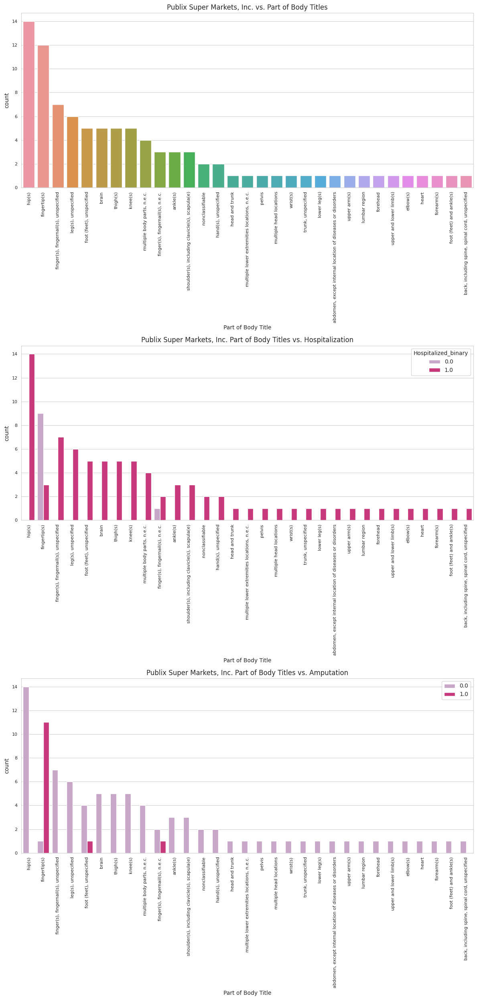

In [ ]:
psm = data[data['Employer']=='publix super markets, inc.']
filtered_psm = psm[psm['Part of Body Title'].map(psm['Part of Body Title'].value_counts()> 0)]
fig, axes = plt.subplots(3, 1, figsize=(12,25))
sns.countplot(data=filtered_psm , x='Part of Body Title',
              ax=axes[0],order = filtered_psm['Part of Body Title'].value_counts().index).tick_params(axis="x", labelrotation=90)
axes[0].set_title('Publix Super Markets, Inc. vs. Part of Body Titles')

sns.countplot(data=filtered_psm , x='Part of Body Title', hue='Hospitalized_binary',
              ax=axes[1],order = filtered_psm['Part of Body Title'].value_counts().index,palette='PuRd').tick_params(axis="x", labelrotation=90)
axes[1].set_title('Publix Super Markets, Inc. Part of Body Titles vs. Hospitalization')

sns.countplot(data=filtered_psm , x='Part of Body Title', hue='Amputation_binary',
              ax=axes[2],order = filtered_psm['Part of Body Title'].value_counts().index,palette='PuRd').tick_params(axis="x", labelrotation=90)
axes[2].set_title('Publix Super Markets, Inc. Part of Body Titles vs. Amputation')


plt.legend()
plt.tight_layout()
plt.show()

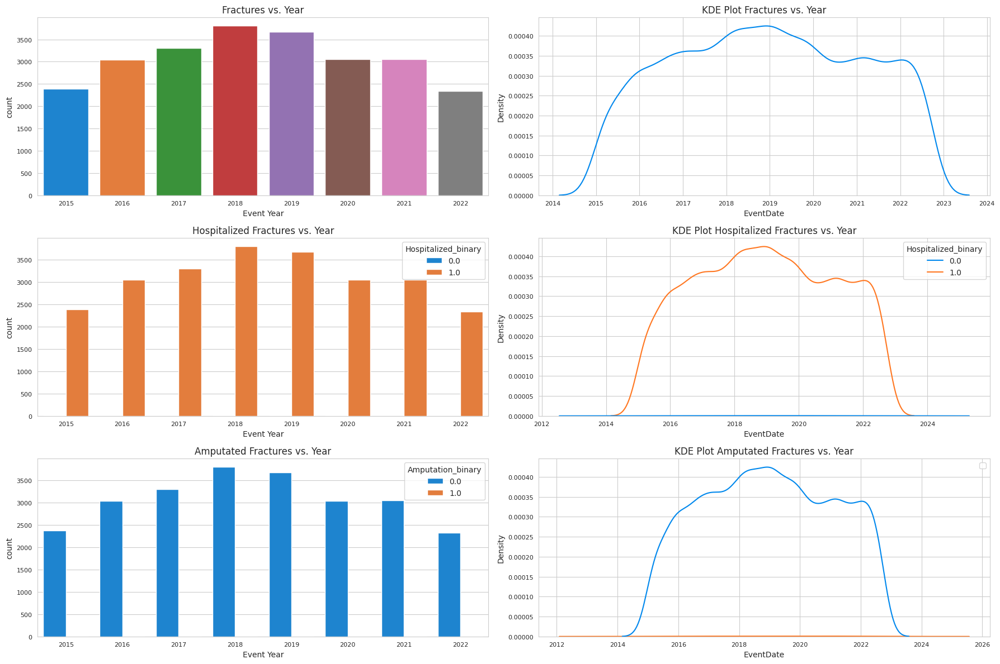

In [ ]:
fractures = data[data['NatureTitle']=='Fractures']
fig, axes = plt.subplots(3, 2, figsize=(18,12))
sns.countplot(data=fractures , x='Event Year', ax=axes[0,0])
axes[0,0].set_title('Fractures vs. Year')
sns.kdeplot(data=fractures , x='EventDate', ax=axes[0,1])
axes[0,1].set_title('KDE Plot Fractures vs. Year')

sns.countplot(data=fractures , x='Event Year', hue='Hospitalized_binary', ax=axes[1,0])
axes[1,0].set_title('Hospitalized Fractures vs. Year')
sns.kdeplot(data=fractures , x='EventDate', hue='Hospitalized_binary', ax=axes[1,1])
axes[1,1].set_title('KDE Plot Hospitalized Fractures vs. Year')

sns.countplot(data=fractures , x='Event Year', hue='Amputation_binary', ax=axes[2,0])
axes[2,0].set_title('Amputated Fractures vs. Year')
sns.kdeplot(data=fractures , x='EventDate', hue='Amputation_binary', ax=axes[2,1])
axes[2,1].set_title('KDE Plot Amputated Fractures vs. Year')

plt.legend()
plt.tight_layout()
plt.show()

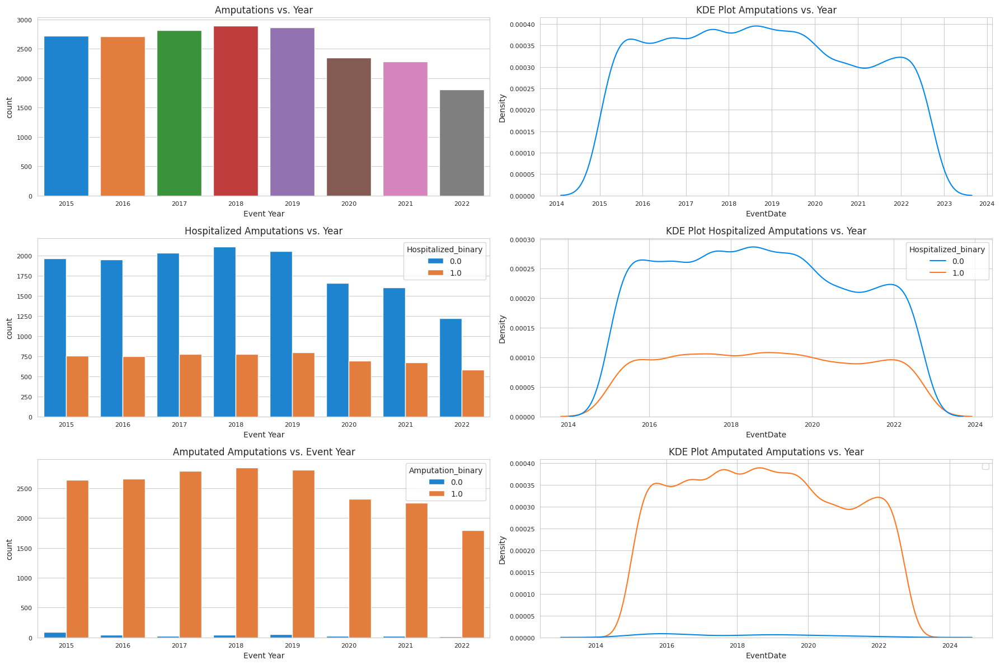

In [ ]:
amputations = data[data['NatureTitle']=='Amputations']
fig, axes = plt.subplots(3, 2, figsize=(18,12))
sns.countplot(data=amputations , x='Event Year', ax=axes[0,0])
axes[0,0].set_title('Amputations vs. Year')
sns.kdeplot(data=amputations , x='EventDate', ax=axes[0,1])
axes[0,1].set_title('KDE Plot Amputations vs. Year')

sns.countplot(data=amputations , x='Event Year', hue='Hospitalized_binary', ax=axes[1,0])
axes[1,0].set_title('Hospitalized Amputations vs. Year')
sns.kdeplot(data=amputations , x='EventDate', hue='Hospitalized_binary', ax=axes[1,1])
axes[1,1].set_title('KDE Plot Hospitalized Amputations vs. Year')

sns.countplot(data=amputations , x='Event Year', hue='Amputation_binary', ax=axes[2,0])
axes[2,0].set_title('Amputated Amputations vs. Event Year')
sns.kdeplot(data=amputations , x='EventDate', hue='Amputation_binary', ax=axes[2,1])
axes[2,1].set_title('KDE Plot Amputated Amputations vs. Year')

plt.legend()
plt.tight_layout()
plt.show()

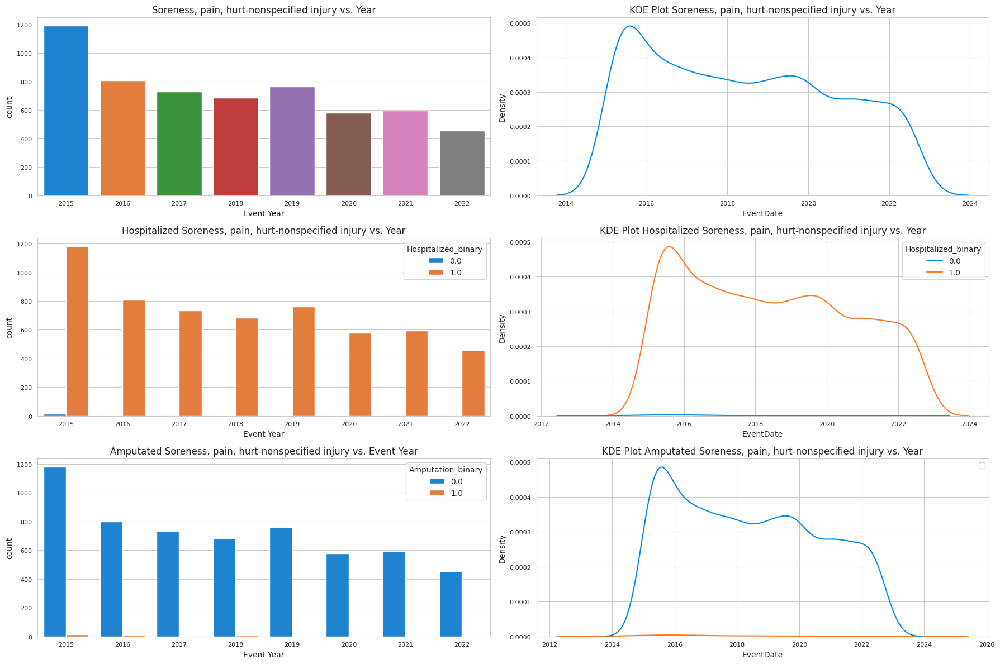

In [ ]:
sph = data[data['NatureTitle']=='Soreness, pain, hurt-nonspecified injury']
fig, axes = plt.subplots(3, 2, figsize=(18,12))
sns.countplot(data=sph , x='Event Year', ax=axes[0,0])
axes[0,0].set_title('Soreness, pain, hurt-nonspecified injury vs. Year')
sns.kdeplot(data=sph , x='EventDate', ax=axes[0,1])
axes[0,1].set_title('KDE Plot Soreness, pain, hurt-nonspecified injury vs. Year')

sns.countplot(data=sph , x='Event Year', hue='Hospitalized_binary', ax=axes[1,0])
axes[1,0].set_title('Hospitalized Soreness, pain, hurt-nonspecified injury vs. Year')
sns.kdeplot(data=sph , x='EventDate', hue='Hospitalized_binary', ax=axes[1,1])
axes[1,1].set_title('KDE Plot Hospitalized Soreness, pain, hurt-nonspecified injury vs. Year')

sns.countplot(data=sph , x='Event Year', hue='Amputation_binary', ax=axes[2,0])
axes[2,0].set_title('Amputated Soreness, pain, hurt-nonspecified injury vs. Event Year')
sns.kdeplot(data=sph , x='EventDate', hue='Amputation_binary', ax=axes[2,1])
axes[2,1].set_title('KDE Plot Amputated Soreness, pain, hurt-nonspecified injury vs. Year')

plt.legend()
plt.tight_layout()
plt.show()

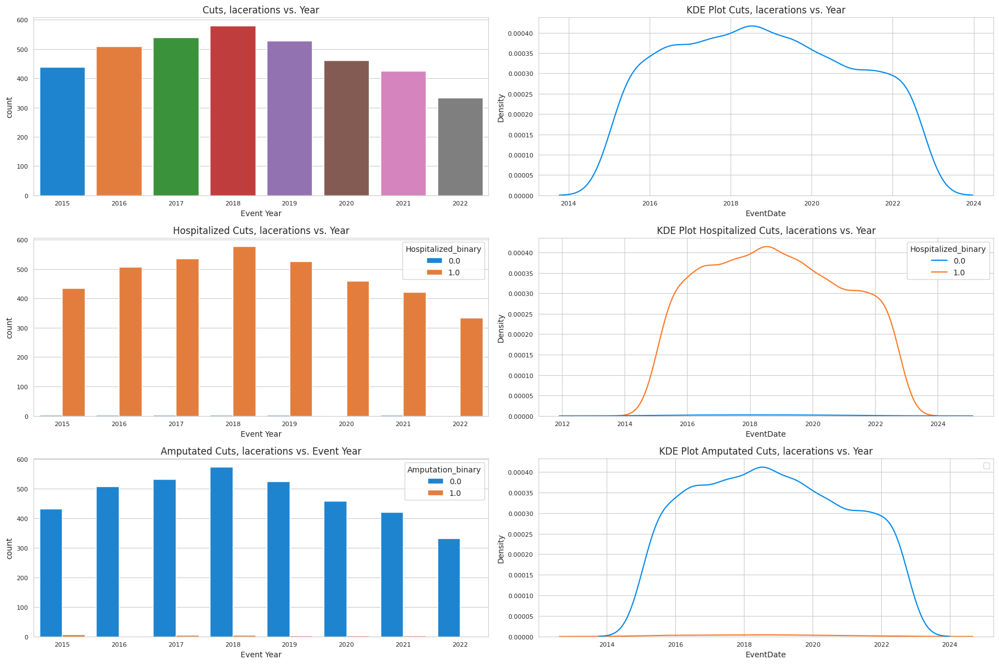

In [ ]:
cut = data[data['NatureTitle']=='Cuts, lacerations']
fig, axes = plt.subplots(3, 2, figsize=(18,12))
sns.countplot(data=cut , x='Event Year', ax=axes[0,0])
axes[0,0].set_title('Cuts, lacerations vs. Year')
sns.kdeplot(data=cut , x='EventDate', ax=axes[0,1])
axes[0,1].set_title('KDE Plot Cuts, lacerations vs. Year')

sns.countplot(data=cut , x='Event Year', hue='Hospitalized_binary', ax=axes[1,0])
axes[1,0].set_title('Hospitalized Cuts, lacerations vs. Year')
sns.kdeplot(data=cut , x='EventDate', hue='Hospitalized_binary', ax=axes[1,1])
axes[1,1].set_title('KDE Plot Hospitalized Cuts, lacerations vs. Year')

sns.countplot(data=cut , x='Event Year', hue='Amputation_binary', ax=axes[2,0])
axes[2,0].set_title('Amputated Cuts, lacerations vs. Event Year')
sns.kdeplot(data=cut , x='EventDate', hue='Amputation_binary', ax=axes[2,1])
axes[2,1].set_title('KDE Plot Amputated Cuts, lacerations vs. Year')

plt.legend()
plt.tight_layout()
plt.show()

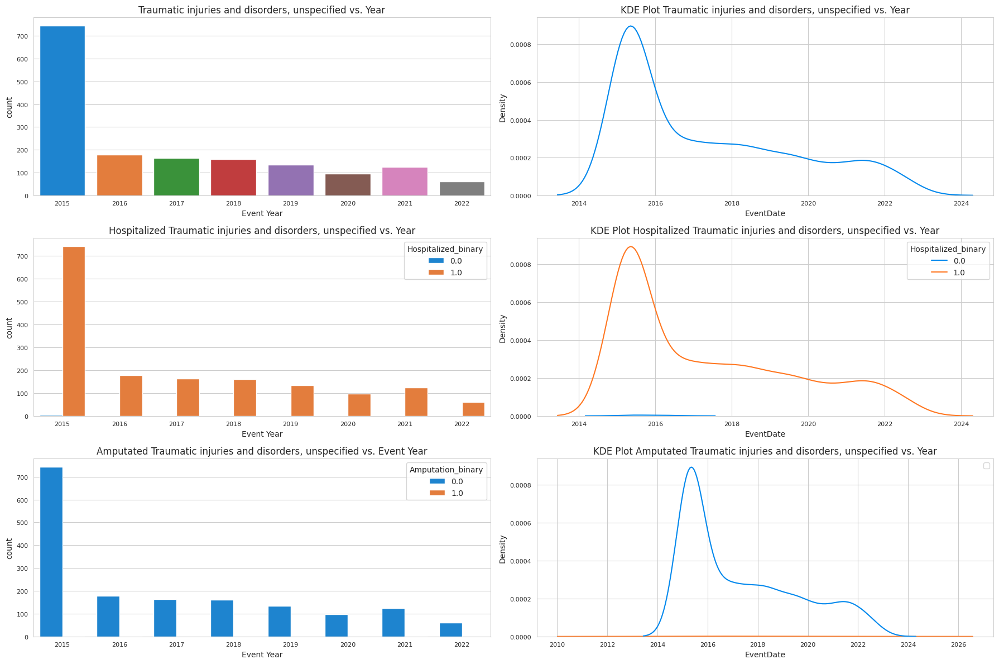

In [ ]:
tid = data[data['NatureTitle']=='Traumatic injuries and disorders, unspecified']
fig, axes = plt.subplots(3, 2, figsize=(18,12))
sns.countplot(data=tid , x='Event Year', ax=axes[0,0])
axes[0,0].set_title('Traumatic injuries and disorders, unspecified vs. Year')
sns.kdeplot(data=tid , x='EventDate', ax=axes[0,1])
axes[0,1].set_title('KDE Plot Traumatic injuries and disorders, unspecified vs. Year')

sns.countplot(data=tid , x='Event Year', hue='Hospitalized_binary', ax=axes[1,0])
axes[1,0].set_title('Hospitalized Traumatic injuries and disorders, unspecified vs. Year')
sns.kdeplot(data=tid , x='EventDate', hue='Hospitalized_binary', ax=axes[1,1])
axes[1,1].set_title('KDE Plot Hospitalized Traumatic injuries and disorders, unspecified vs. Year')

sns.countplot(data=tid , x='Event Year', hue='Amputation_binary', ax=axes[2,0])
axes[2,0].set_title('Amputated Traumatic injuries and disorders, unspecified vs. Event Year')
sns.kdeplot(data=tid , x='EventDate', hue='Amputation_binary', ax=axes[2,1])
axes[2,1].set_title('KDE Plot Amputated Traumatic injuries and disorders, unspecified vs. Year')

plt.legend()
plt.tight_layout()
plt.show()

<ipython-input-118-22fe5a8db197>:10: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=ii , x='EventDate', hue='Hospitalized_binary', ax=axes[1,1])


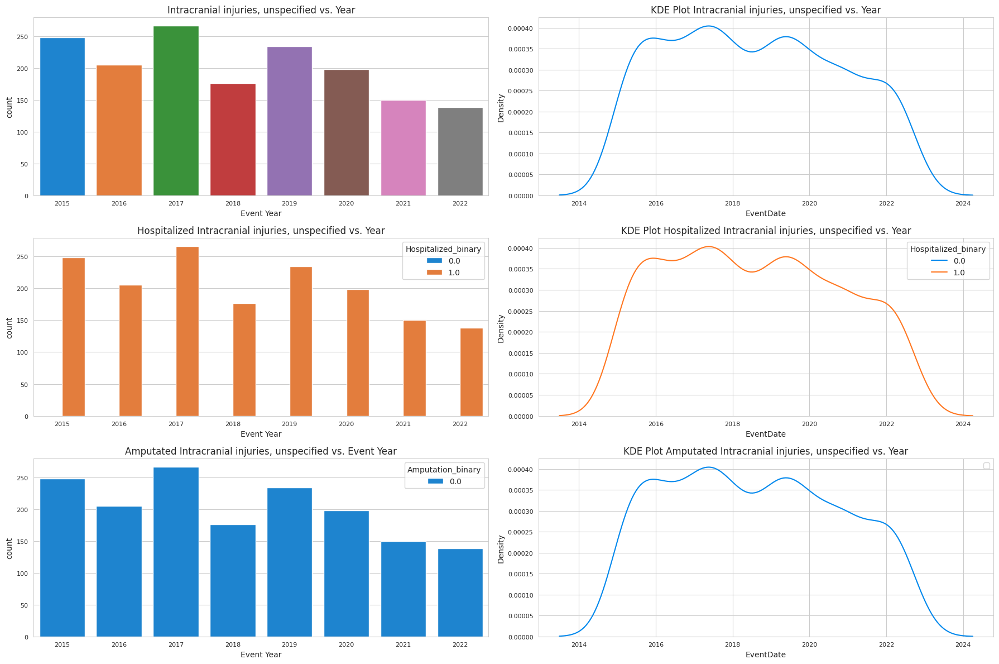

In [ ]:
ii = data[data['NatureTitle']=='Intracranial injuries, unspecified']
fig, axes = plt.subplots(3, 2, figsize=(18,12))
sns.countplot(data=ii , x='Event Year', ax=axes[0,0])
axes[0,0].set_title('Intracranial injuries, unspecified vs. Year')
sns.kdeplot(data=ii , x='EventDate', ax=axes[0,1])
axes[0,1].set_title('KDE Plot Intracranial injuries, unspecified vs. Year')

sns.countplot(data=ii , x='Event Year', hue='Hospitalized_binary', ax=axes[1,0])
axes[1,0].set_title('Hospitalized Intracranial injuries, unspecified vs. Year')
sns.kdeplot(data=ii , x='EventDate', hue='Hospitalized_binary', ax=axes[1,1])
axes[1,1].set_title('KDE Plot Hospitalized Intracranial injuries, unspecified vs. Year')

sns.countplot(data=ii , x='Event Year', hue='Amputation_binary', ax=axes[2,0])
axes[2,0].set_title('Amputated Intracranial injuries, unspecified vs. Event Year')
sns.kdeplot(data=ii , x='EventDate', hue='Amputation_binary', ax=axes[2,1])
axes[2,1].set_title('KDE Plot Amputated Intracranial injuries, unspecified vs. Year')

plt.legend()
plt.tight_layout()
plt.show()

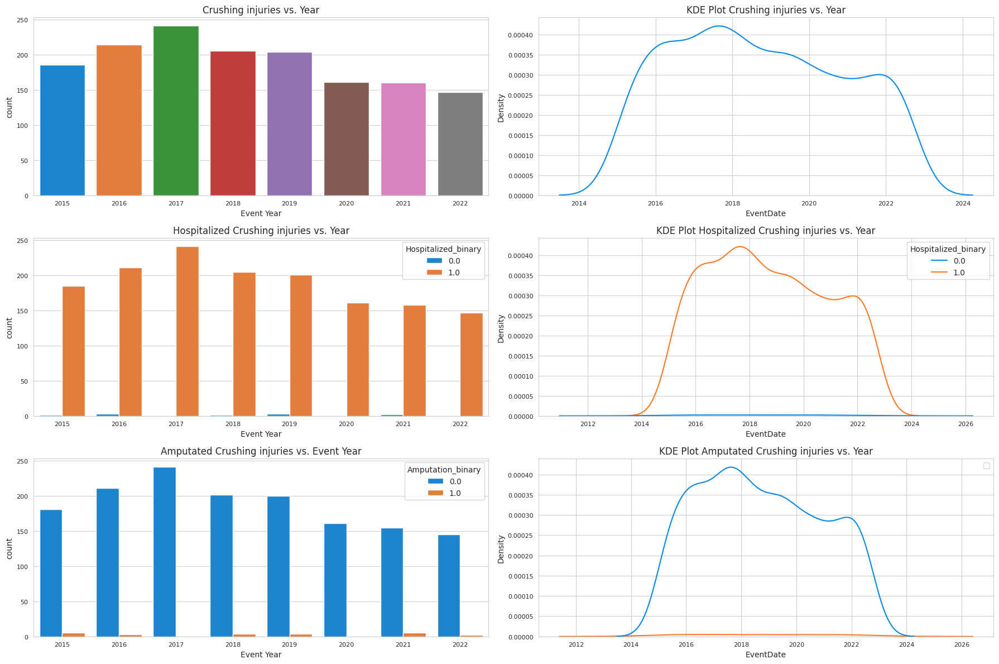

In [ ]:
crush = data[data['NatureTitle']=='Crushing injuries']
fig, axes = plt.subplots(3, 2, figsize=(18,12))
sns.countplot(data=crush , x='Event Year', ax=axes[0,0])
axes[0,0].set_title('Crushing injuries vs. Year')
sns.kdeplot(data=crush , x='EventDate', ax=axes[0,1])
axes[0,1].set_title('KDE Plot Crushing injuries vs. Year')

sns.countplot(data=crush , x='Event Year', hue='Hospitalized_binary', ax=axes[1,0])
axes[1,0].set_title('Hospitalized Crushing injuries vs. Year')
sns.kdeplot(data=crush , x='EventDate', hue='Hospitalized_binary', ax=axes[1,1])
axes[1,1].set_title('KDE Plot Hospitalized Crushing injuries vs. Year')

sns.countplot(data=crush , x='Event Year', hue='Amputation_binary', ax=axes[2,0])
axes[2,0].set_title('Amputated Crushing injuries vs. Event Year')
sns.kdeplot(data=crush , x='EventDate', hue='Amputation_binary', ax=axes[2,1])
axes[2,1].set_title('KDE Plot Amputated Crushing injuries vs. Year')

plt.legend()
plt.tight_layout()
plt.show()

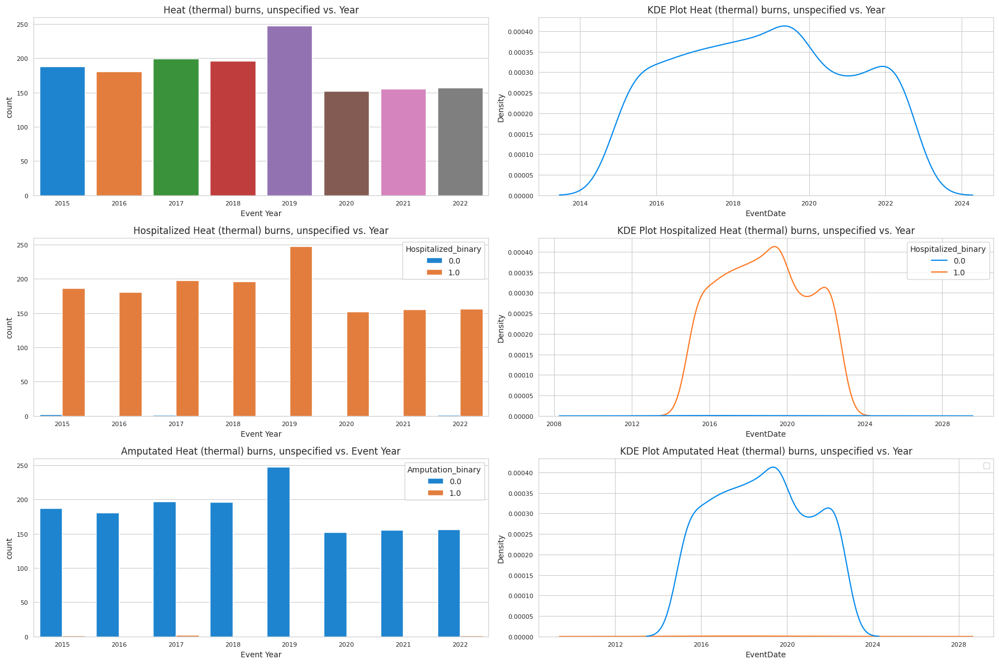

In [ ]:
hb = data[data['NatureTitle']=='Heat (thermal) burns, unspecified']
fig, axes = plt.subplots(3, 2, figsize=(18,12))
sns.countplot(data=hb , x='Event Year', ax=axes[0,0])
axes[0,0].set_title('Heat (thermal) burns, unspecified vs. Year')
sns.kdeplot(data=hb , x='EventDate', ax=axes[0,1])
axes[0,1].set_title('KDE Plot Heat (thermal) burns, unspecified vs. Year')

sns.countplot(data=hb , x='Event Year', hue='Hospitalized_binary', ax=axes[1,0])
axes[1,0].set_title('Hospitalized Heat (thermal) burns, unspecified vs. Year')
sns.kdeplot(data=hb , x='EventDate', hue='Hospitalized_binary', ax=axes[1,1])
axes[1,1].set_title('KDE Plot Hospitalized Heat (thermal) burns, unspecified vs. Year')

sns.countplot(data=hb , x='Event Year', hue='Amputation_binary', ax=axes[2,0])
axes[2,0].set_title('Amputated Heat (thermal) burns, unspecified vs. Event Year')
sns.kdeplot(data=hb , x='EventDate', hue='Amputation_binary', ax=axes[2,1])
axes[2,1].set_title('KDE Plot Amputated Heat (thermal) burns, unspecified vs. Year')

plt.legend()
plt.tight_layout()
plt.show()

<ipython-input-121-6150f695b523>:10: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=iiobvt , x='EventDate', hue='Hospitalized_binary', ax=axes[1,1])


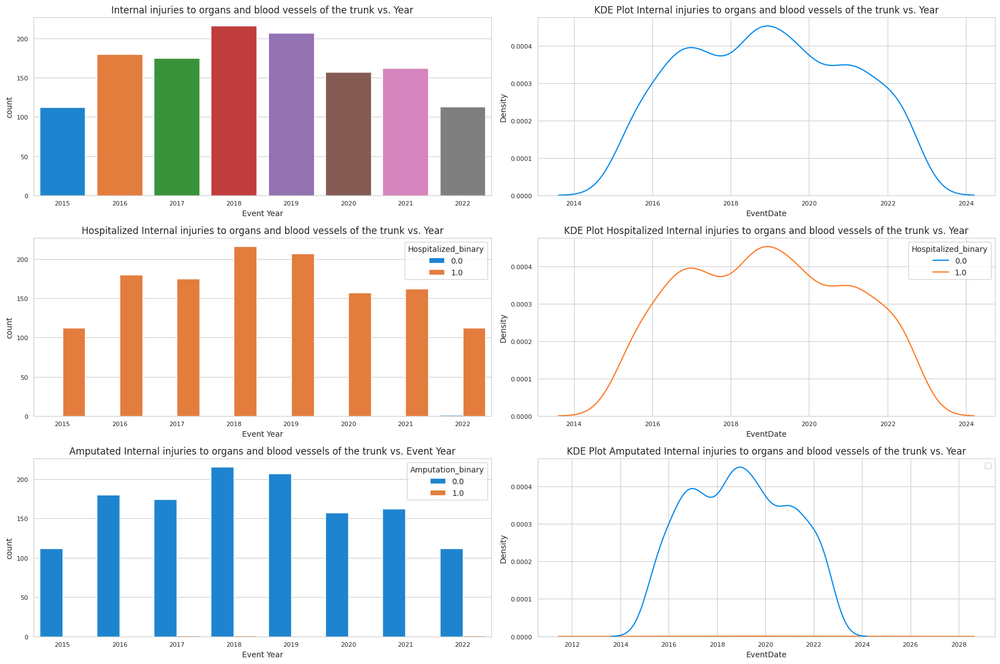

In [ ]:
iiobvt = data[data['NatureTitle']=='Internal injuries to organs and blood vessels of the trunk']
fig, axes = plt.subplots(3, 2, figsize=(18,12))
sns.countplot(data=iiobvt , x='Event Year', ax=axes[0,0])
axes[0,0].set_title('Internal injuries to organs and blood vessels of the trunk vs. Year')
sns.kdeplot(data=iiobvt , x='EventDate', ax=axes[0,1])
axes[0,1].set_title('KDE Plot Internal injuries to organs and blood vessels of the trunk vs. Year')

sns.countplot(data=iiobvt , x='Event Year', hue='Hospitalized_binary', ax=axes[1,0])
axes[1,0].set_title('Hospitalized Internal injuries to organs and blood vessels of the trunk vs. Year')
sns.kdeplot(data=iiobvt , x='EventDate', hue='Hospitalized_binary', ax=axes[1,1])
axes[1,1].set_title('KDE Plot Hospitalized Internal injuries to organs and blood vessels of the trunk vs. Year')

sns.countplot(data=iiobvt , x='Event Year', hue='Amputation_binary', ax=axes[2,0])
axes[2,0].set_title('Amputated Internal injuries to organs and blood vessels of the trunk vs. Event Year')
sns.kdeplot(data=iiobvt , x='EventDate', hue='Amputation_binary', ax=axes[2,1])
axes[2,1].set_title('KDE Plot Amputated Internal injuries to organs and blood vessels of the trunk vs. Year')

plt.legend()
plt.tight_layout()
plt.show()

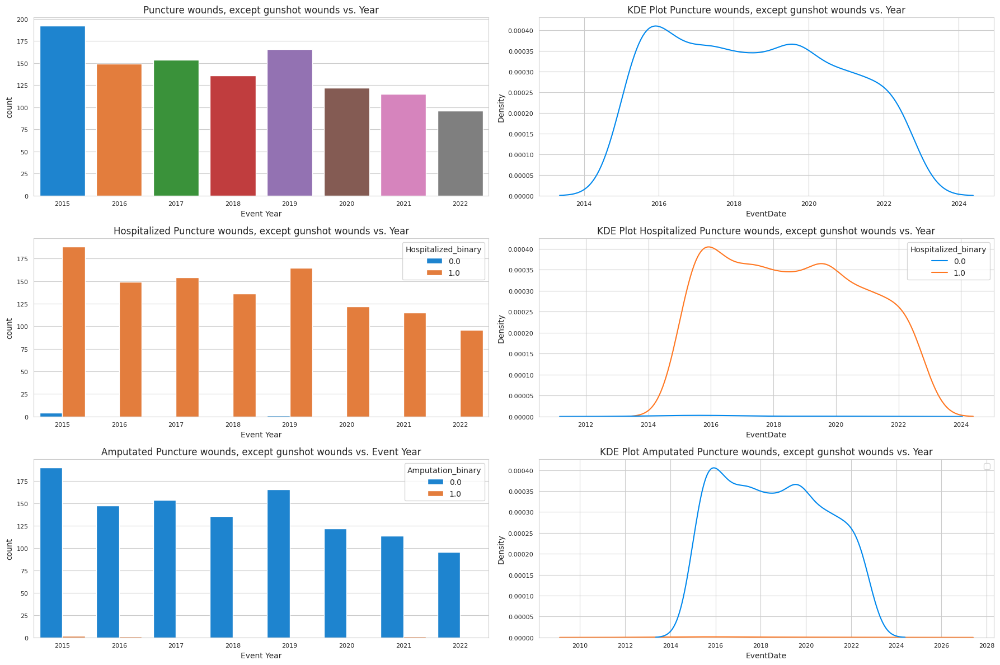

In [ ]:
pw = data[data['NatureTitle']=='Puncture wounds, except gunshot wounds']
fig, axes = plt.subplots(3, 2, figsize=(18,12))
sns.countplot(data=pw , x='Event Year', ax=axes[0,0])
axes[0,0].set_title('Puncture wounds, except gunshot wounds vs. Year')
sns.kdeplot(data=pw , x='EventDate', ax=axes[0,1])
axes[0,1].set_title('KDE Plot Puncture wounds, except gunshot wounds vs. Year')

sns.countplot(data=pw , x='Event Year', hue='Hospitalized_binary', ax=axes[1,0])
axes[1,0].set_title('Hospitalized Puncture wounds, except gunshot wounds vs. Year')
sns.kdeplot(data=pw , x='EventDate', hue='Hospitalized_binary', ax=axes[1,1])
axes[1,1].set_title('KDE Plot Hospitalized Puncture wounds, except gunshot wounds vs. Year')

sns.countplot(data=pw , x='Event Year', hue='Amputation_binary', ax=axes[2,0])
axes[2,0].set_title('Amputated Puncture wounds, except gunshot wounds vs. Event Year')
sns.kdeplot(data=pw , x='EventDate', hue='Amputation_binary', ax=axes[2,1])
axes[2,1].set_title('KDE Plot Amputated Puncture wounds, except gunshot wounds vs. Year')

plt.legend()
plt.tight_layout()
plt.show()

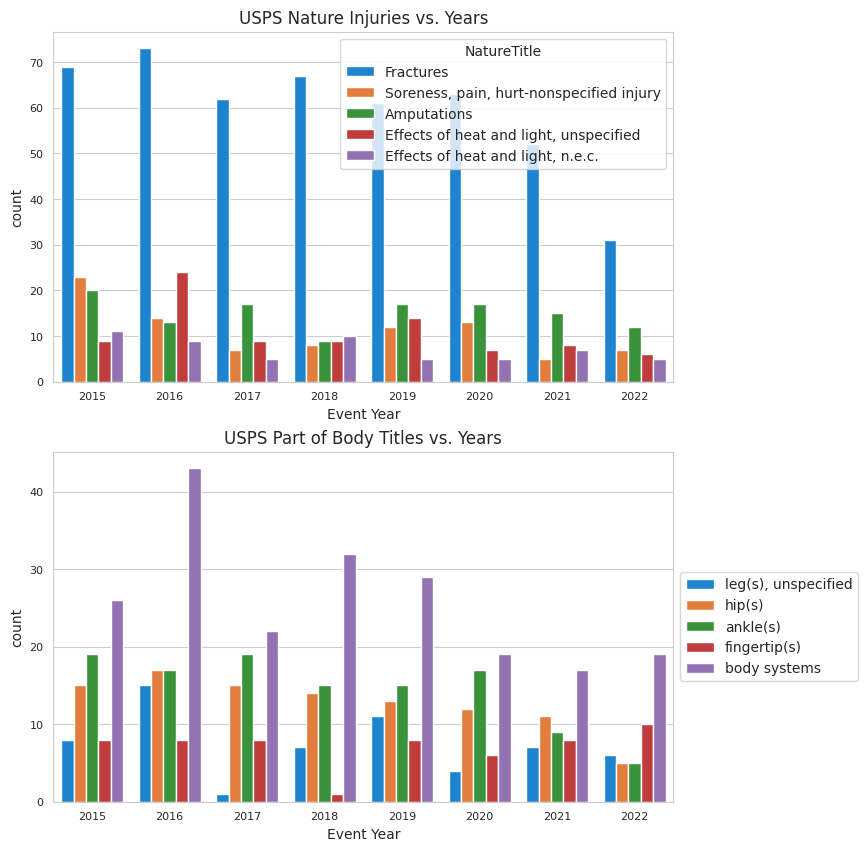

In [ ]:
usps_filtered = usps[usps['NatureTitle'].map(usps['NatureTitle'].value_counts()) > 50]

fig, axes = plt.subplots(2, 1, figsize=(8,10))

sns.countplot(data=usps_filtered , x='Event Year', hue='NatureTitle',ax=axes[0])
axes[0].set_title('USPS Nature Injuries vs. Years')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

usps_filtered = usps[usps['Part of Body Title'].map(usps['Part of Body Title'].value_counts()) > 50]
sns.countplot(data=usps_filtered , x='Event Year', hue='Part of Body Title',ax=axes[1])
axes[1].set_title('USPS Part of Body Titles vs. Years')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

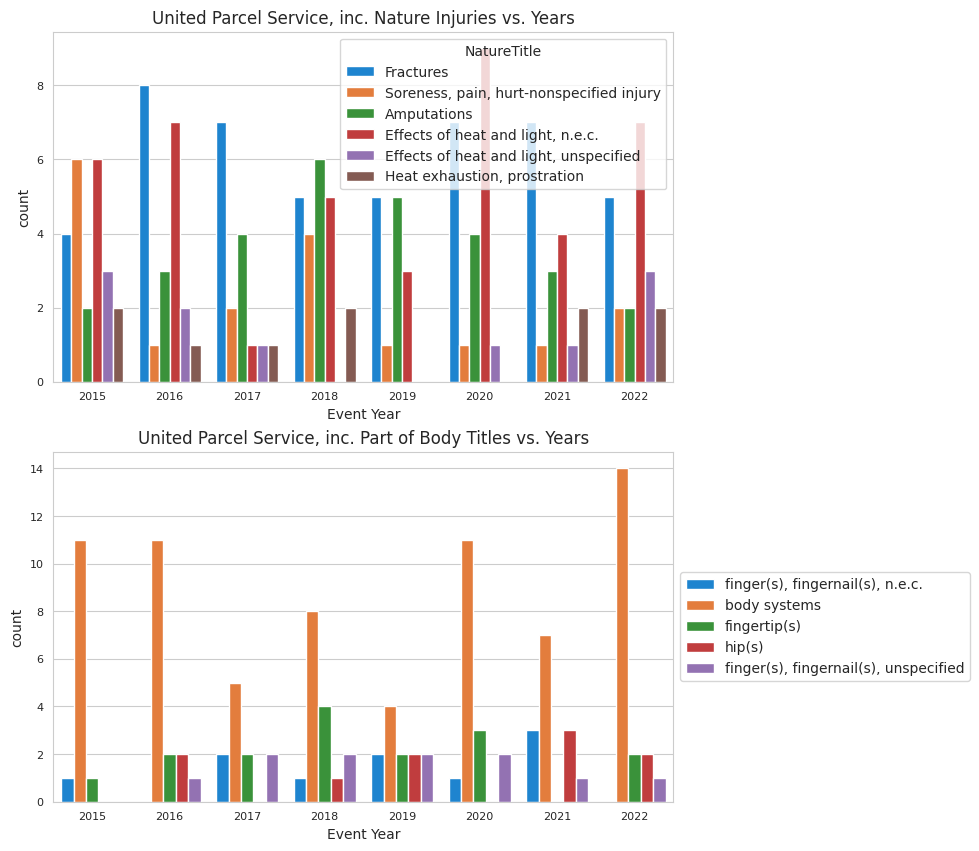

In [ ]:
ups_filtered = ups[ups['NatureTitle'].map(ups['NatureTitle'].value_counts()) >= 10]
fig, axes = plt.subplots(2, 1, figsize=(8,10))

sns.countplot(data=ups_filtered , x='Event Year', hue='NatureTitle',ax=axes[0])
axes[0].set_title('United Parcel Service, inc. Nature Injuries vs. Years')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

ups_filtered = ups[ups['Part of Body Title'].map(ups['Part of Body Title'].value_counts()) >= 10]
sns.countplot(data=ups_filtered , x='Event Year', hue='Part of Body Title',ax=axes[1])
axes[1].set_title('United Parcel Service, inc. Part of Body Titles vs. Years')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

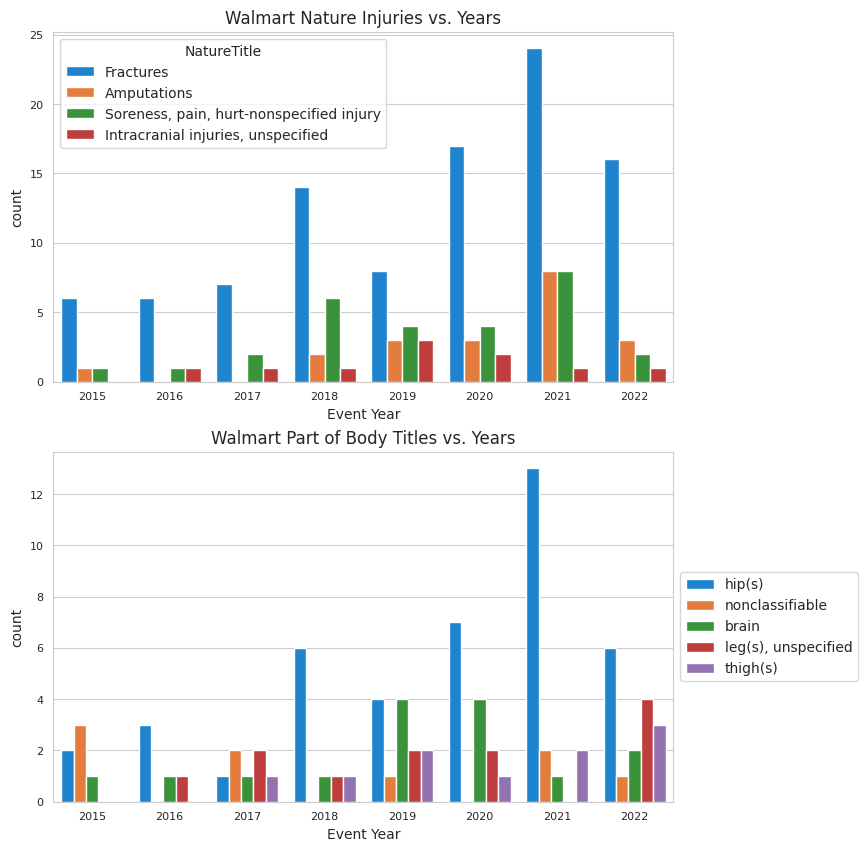

In [ ]:
walmart_filtered = walmart[walmart['NatureTitle'].map(walmart['NatureTitle'].value_counts()) >= 10]
fig, axes = plt.subplots(2, 1, figsize=(8,10))

sns.countplot(data=walmart_filtered , x='Event Year', hue='NatureTitle',ax=axes[0])
axes[0].set_title('Walmart Nature Injuries vs. Years')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

walmart_filtered = walmart[walmart['Part of Body Title'].map(walmart['Part of Body Title'].value_counts()) >= 9]
sns.countplot(data=walmart_filtered , x='Event Year', hue='Part of Body Title',ax=axes[1])
axes[1].set_title('Walmart Part of Body Titles vs. Years')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

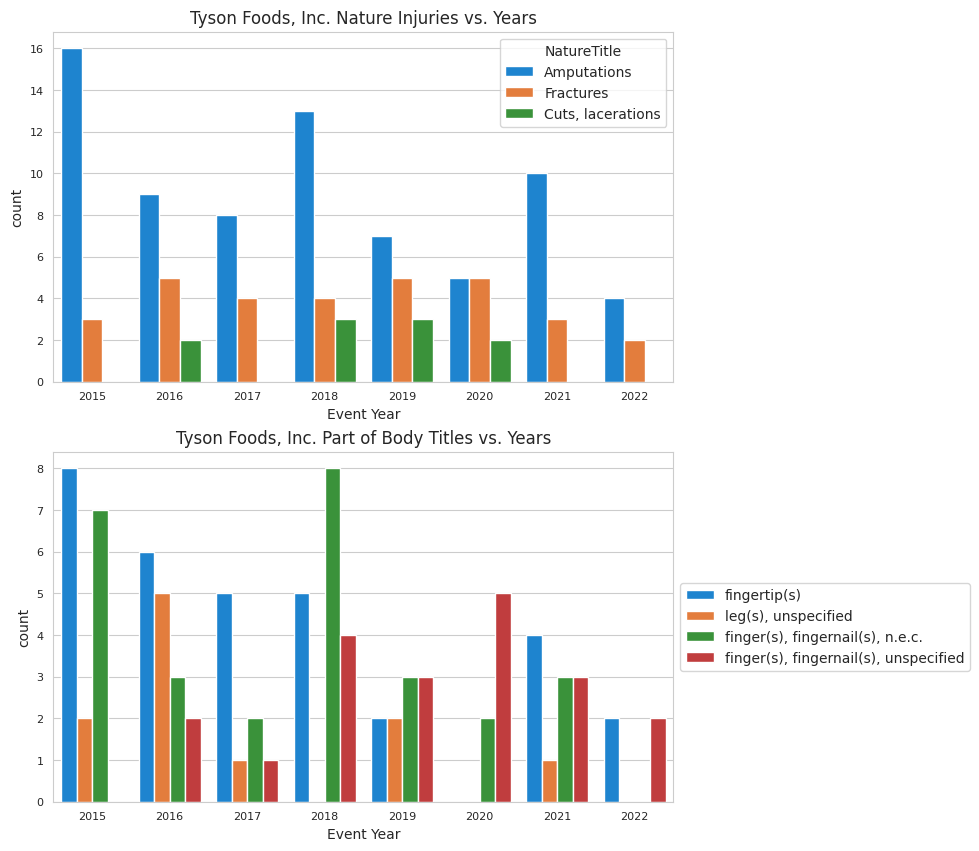

In [ ]:
tyson_filtered = tyson[tyson['NatureTitle'].map(tyson['NatureTitle'].value_counts()) >= 10]
fig, axes = plt.subplots(2, 1, figsize=(8,10))

sns.countplot(data=tyson_filtered , x='Event Year', hue='NatureTitle',ax=axes[0])
axes[0].set_title('Tyson Foods, Inc. Nature Injuries vs. Years')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

tyson_filtered = tyson[tyson['Part of Body Title'].map(tyson['Part of Body Title'].value_counts()) >= 10]
sns.countplot(data=tyson_filtered , x='Event Year', hue='Part of Body Title',ax=axes[1])
axes[1].set_title('Tyson Foods, Inc. Part of Body Titles vs. Years')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

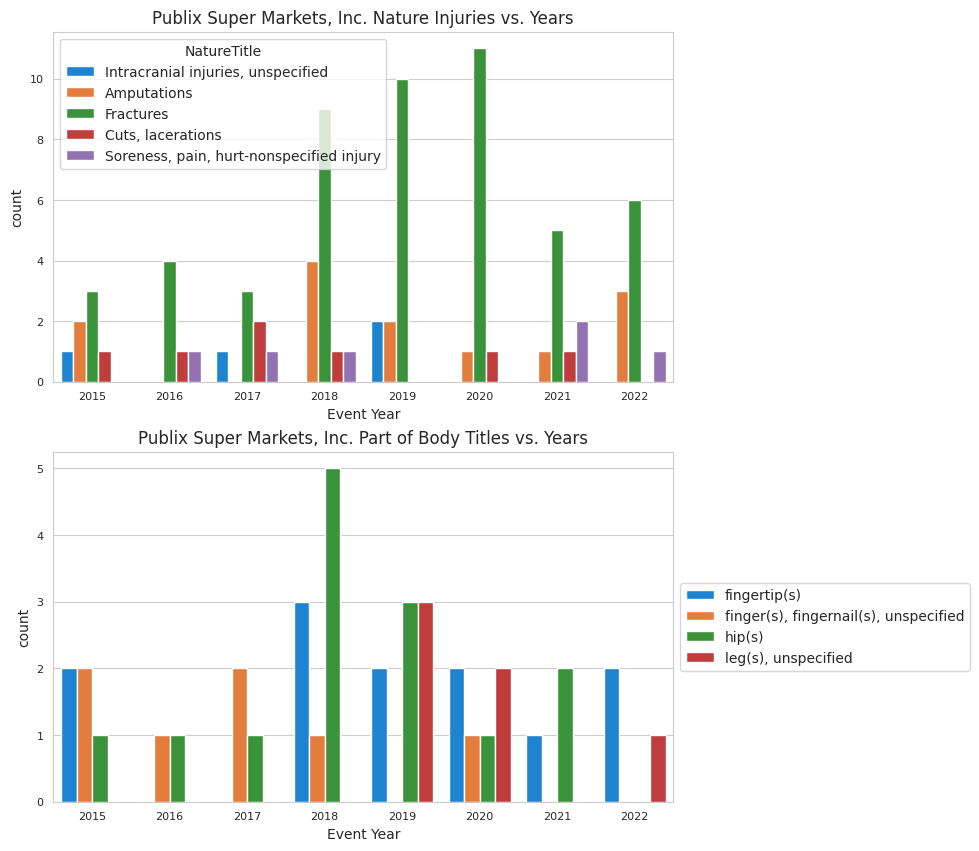

In [ ]:
psm_filtered = psm[psm['NatureTitle'].map(psm['NatureTitle'].value_counts()) >= 4]
fig, axes = plt.subplots(2, 1, figsize=(8,10))

sns.countplot(data=psm_filtered , x='Event Year', hue='NatureTitle',ax=axes[0])
axes[0].set_title('Publix Super Markets, Inc. Nature Injuries vs. Years')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

psm_filtered = psm[psm['Part of Body Title'].map(psm['Part of Body Title'].value_counts()) >= 6]
sns.countplot(data=psm_filtered , x='Event Year', hue='Part of Body Title',ax=axes[1])
axes[1].set_title('Publix Super Markets, Inc. Part of Body Titles vs. Years')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

# 3. Build Dataset For Predicting

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 77172 entries, 0 to 77207
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   EventDate            77172 non-null  datetime64[ns]
 1   Employer             77172 non-null  object        
 2   City                 77172 non-null  object        
 3   State                77172 non-null  object        
 4   Zip                  77172 non-null  float64       
 5   Primary NAICS        77172 non-null  int64         
 6   Nature               77172 non-null  int64         
 7   NatureTitle          77172 non-null  object        
 8   Part of Body         77172 non-null  int64         
 9   Part of Body Title   77172 non-null  object        
 10  Event                77172 non-null  int64         
 11  EventTitle           77172 non-null  object        
 12  Source               77172 non-null  int64         
 13  SourceTitle          77172 non-

## 3.1 Assign Unique Numbers To Each Value In The 'City', 'State' and 'Employer' Columns

In [ ]:
# Use factorize() to assign unique numbers to each value in the 'City' column
data['City_ID'] = pd.factorize(data['City'])[0]

# Use factorize() to assign unique numbers to each value in the 'State' column
data['State_ID'] = pd.factorize(data['State'])[0]

# Use factorize() to assign unique numbers to each value in the 'Employer' column
data['Employer_ID'] = pd.factorize(data['Employer'])[0]

In [ ]:
data.to_csv('Trend Dataset.csv', index=False)

## 3.2 Removing Categorical Columns For Predicting

In [ ]:
data.drop(['EventDate','Employer','City','State','NatureTitle','Part of Body Title',
           'EventTitle','SourceTitle','Event DayOfWeek'],axis=1,inplace=True)

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 77172 entries, 0 to 77207
Data columns (total 14 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Zip                  77172 non-null  float64
 1   Primary NAICS        77172 non-null  int64  
 2   Nature               77172 non-null  int64  
 3   Part of Body         77172 non-null  int64  
 4   Event                77172 non-null  int64  
 5   Source               77172 non-null  int64  
 6   Event Day            77172 non-null  int64  
 7   Event Month          77172 non-null  int64  
 8   Event Year           77172 non-null  int64  
 9   Hospitalized_binary  77172 non-null  float64
 10  Amputation_binary    77172 non-null  float64
 11  City_ID              77172 non-null  int64  
 12  State_ID             77172 non-null  int64  
 13  Employer_ID          77172 non-null  int64  
dtypes: float64(3), int64(11)
memory usage: 8.8 MB


In [ ]:
data.to_csv('Prediction Dataset.csv', index=False)

# End of Part 1